In [1]:
pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.1 MB/s eta 0:00:00


In [2]:
!pip install pytorch_forecasting
!pip install torch
!pip install pytorch_lightning
!pip install ta

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.9/260.9 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 824.2/824.2 kB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 828.2/828.2 kB 38.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=9df6c96ffcc42bbc9c3c4c08b4d3907396de0f0768b34490f0fffa0615956faf
  Stored in directory: /root/.cache/pip/wheels/5c/a1/5f/c6b85a7d9452057be4ce68a8e45d77ba34234a6d46581777c6
Successfully built ta


# TFT-GNN 1

maybe change train loss to test loss for gnn because im a filthy cheat.

In [ ]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])
    df['Close_next'] = df['Close'].shift(-1)
    df['up_down'] = (df['Close_next'] > df['Close']).astype(int)   # 1 = up, 0 = down


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['up_down'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.long)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd_class.pt')

SAVED MODEL:

Epoch 01 | Train Loss: 0.0037 | Test Loss: 0.0097
 New best model saved (Train Loss: 0.0097)
Epoch 02 | Train Loss: 0.0019 | Test Loss: 0.0074
 New best model saved (Train Loss: 0.0074)
Epoch 03 | Train Loss: 0.0018 | Test Loss: 0.0082
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0015 | Test Loss: 0.0155
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0017 | Test Loss: 0.0089
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0015 | Test Loss: 0.0143
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0015 | Test Loss: 0.0099
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0074
 Saved trained GNN model to gnn_model_aapl.pt
AAPL — RMSE: 22.2480 | MAE: 17.3417 | MAPE: 9.13% | R²: 0.2469


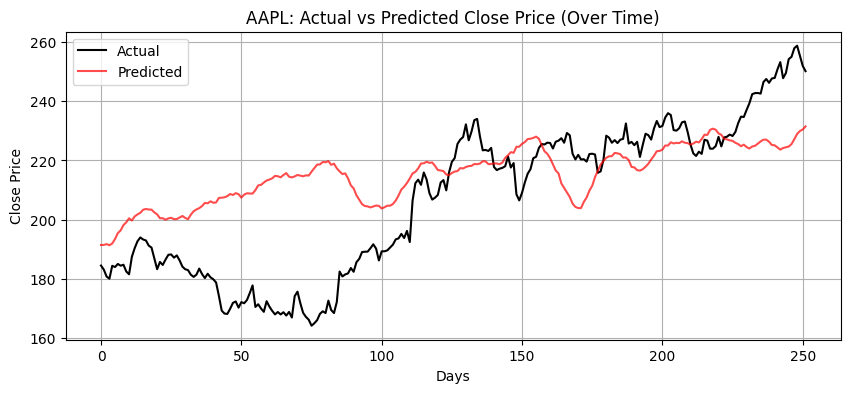

Extracted attention weights for AAPL for 252 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


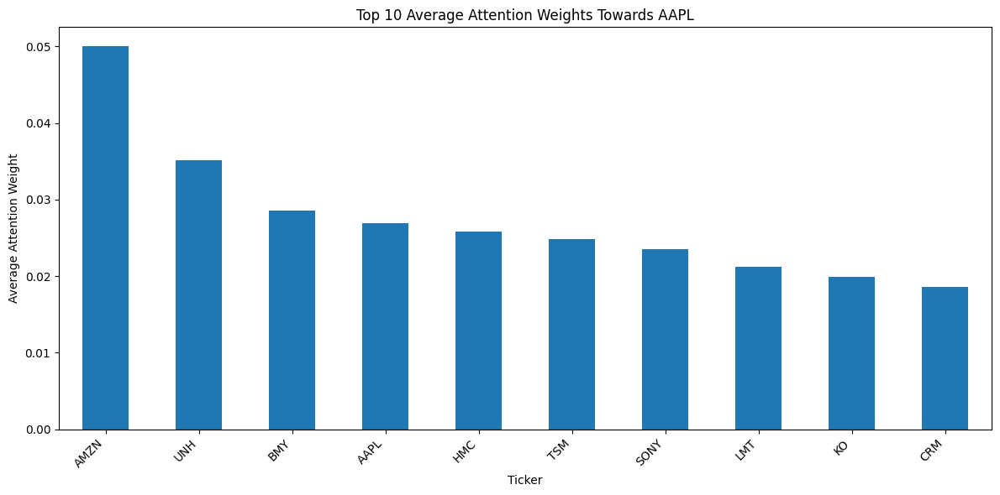

Top 10 tickers by average attention weight towards AAPL:
AMZN    0.050031
UNH     0.035108
BMY     0.028513
AAPL    0.026972
HMC     0.025782
TSM     0.024789
SONY    0.023555
LMT     0.021252
KO      0.019894
CRM     0.018570
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# --- Save model after training ---
torch.save(model.state_dict(), "gnn_model_aapl.pt")
print(" Saved trained GNN model to gnn_model_aapl.pt")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()


# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

SAVED EMBEDDINGS:

In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list[-test_days:]

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)
        self.dropout = nn.Dropout(dropout_prob)

    def encode(self, data):
        """Return node embeddings for all tickers (not just prediction)."""
        x, edge_index = data.x, data.edge_index
        x = F.elu(self.gat1(x, edge_index))   # shape: [num_nodes, hidden_channels * heads]
        return x

    def forward(self, data):
        node_embeddings = self.encode(data)
        return node_embeddings

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Recreate model exactly as trained
model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1, heads=4).to(device)

# Load trained weights
model.load_state_dict(torch.load("gnn_model_aapl.pt"))
model.eval()
print(" Loaded GNN model from gnn_model_aapl.pt")

# === Extract embeddings ===
gnn_embeddings = []

with torch.no_grad():
    for data in graph_list:
        data = data.to(device)
        node_emb = model.encode(data)   # [num_nodes, hidden_dim]
        aapl_emb = node_emb[data.target_node_ids]  # pick AAPL
        gnn_embeddings.append(aapl_emb.cpu().numpy())

gnn_embeddings = np.vstack(gnn_embeddings)  # [num_days, hidden_dim]
np.save("aapl_gnn_embeddings.npy", gnn_embeddings)
print(" Saved GNN embeddings to aapl_gnn_embeddings.npy")

 Loaded GNN model from gnn_model_aapl.pt
 Saved GNN embeddings to aapl_gnn_embeddings.npy


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 253 K  | train
------------------------------------------------------------
253 K     Trainable params
0         Non-trainable params
253 K     Total params
1.015     Total estimated model params size (MB)
478       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.0793
  MAE : 2.3132
  R²  : 0.9855
  MAPE: 1.13%


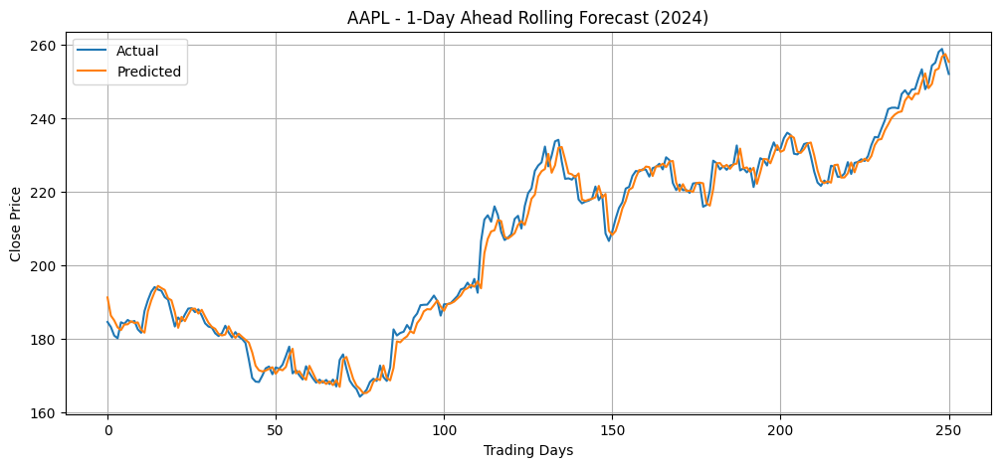

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

import torch.nn as nn

class GNNEmbeddingProjector(nn.Module):
    def __init__(self, emb_dim, proj_dim=16):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Linear(emb_dim, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, x):
        return self.proj(x)


# Load GNN embeddings for AAPL (shape [num_days, hidden_dim])
gnn_emb = np.load("aapl_gnn_embeddings.npy")

# Ensure sorted by date to align with your df
aapl_sorted = df[df["group"] == "AAPL"].sort_values("Date").reset_index(drop=True)

if len(gnn_emb) < len(aapl_sorted):
    pad_len = len(aapl_sorted) - len(gnn_emb)
    print(f"Padding GNN embeddings with {pad_len} dummy zeros")
    gnn_emb = np.vstack([np.zeros((pad_len, gnn_emb.shape[1])), gnn_emb])

assert len(aapl_sorted) == len(gnn_emb), "Mismatch between AAPL rows and GNN embeddings!"

# Add each embedding dimension as its own column
hidden_dim = gnn_emb.shape[1]

gnn_cols_proj = [f"gnn_proj_{i}" for i in range(16)]  # matches proj_dim
projector = GNNEmbeddingProjector(hidden_dim, proj_dim=16)

# Apply projector per stock (example for AAPL)
projected = projector(torch.tensor(gnn_emb, dtype=torch.float32)).detach().numpy()

for i, col in enumerate(gnn_cols_proj):
    aapl_sorted[col] = projected[:, i]

# Merge back into full df
df = df.merge(
    aapl_sorted[["Date", "group"] + gnn_cols_proj],
    on=["Date", "group"],
    how="left"
)
df[gnn_cols_proj] = df[gnn_cols_proj].fillna(0.0)

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow"] + gnn_cols_proj,
    static_categoricals=["group"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


Things to add:
more stocks
etf/stock col, like group
sector?
Maybe with all this extra data, model can change (more complex?)

In [ ]:
hidden_dim

128

128 to 16

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x225 with 1 Axes>,
 'encoder_variables': <Figure size 700x750 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

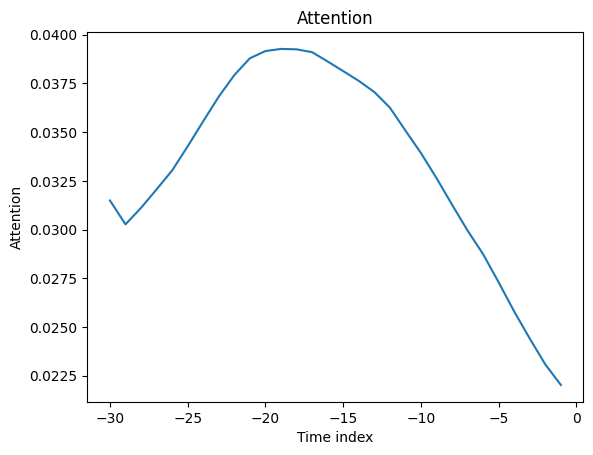

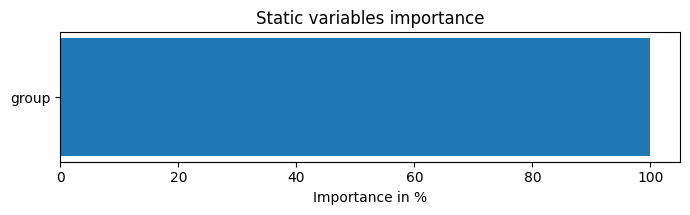

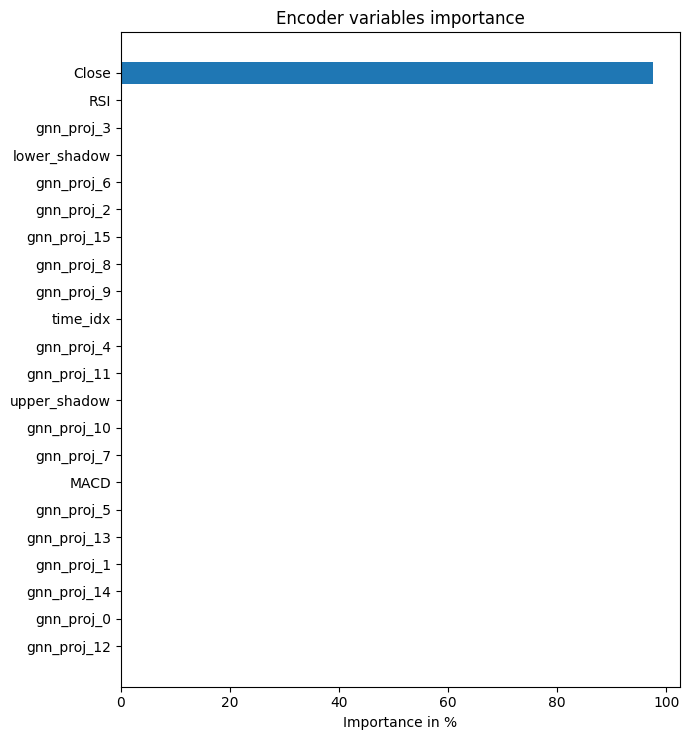

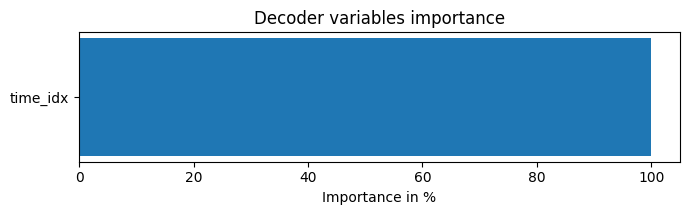

In [ ]:
# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

In [ ]:
aapl_sorted

,Date,Close,High,Low,Open,Volume,group,RSI,MACD,upper_shadow,...,gnn_proj_6,gnn_proj_7,gnn_proj_8,gnn_proj_9,gnn_proj_10,gnn_proj_11,gnn_proj_12,gnn_proj_13,gnn_proj_14,gnn_proj_15
0,2018-01-02,40.479839,40.489241,39.774861,39.986357,102223600,AAPL,52.035969,0.099967,0.009402,...,0.191278,0.077011,-0.151678,-0.056712,-0.166237,0.167627,0.232681,0.012368,0.092470,-0.155067
1,2018-01-03,40.472782,41.017967,40.409337,40.543281,118071600,AAPL,51.950289,0.096543,0.474686,...,0.191789,0.077648,-0.152284,-0.057523,-0.165930,0.167231,0.233621,0.012464,0.091801,-0.154355
2,2018-01-04,40.660770,40.764168,40.437528,40.545623,89738400,AAPL,54.117516,0.107757,0.103397,...,0.188524,0.078376,-0.151322,-0.055975,-0.165165,0.166918,0.230985,0.010669,0.093810,-0.155416
3,2018-01-05,41.123718,41.210664,40.665483,40.757130,94640000,AAPL,59.019550,0.152245,0.086946,...,0.190606,0.079926,-0.155876,-0.057111,-0.163635,0.169007,0.226868,0.006401,0.091313,-0.153087
4,2018-01-08,40.970982,41.267071,40.872282,40.970982,82271200,AAPL,56.861107,0.173181,0.296090,...,0.188643,0.076888,-0.154537,-0.056122,-0.166827,0.167518,0.230224,0.009980,0.095391,-0.151222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1756,2024-12-24,257.916443,257.926411,255.009620,255.209412,23234700,AAPL,75.750267,6.067327,0.009968,...,0.197159,0.066139,-0.131055,-0.024704,-0.153977,0.190565,0.213427,0.027779,0.100999,-0.132630
1757,2024-12-26,258.735504,259.814335,257.347047,257.906429,27237100,AAPL,76.452855,6.300019,1.078831,...,0.197047,0.067858,-0.134177,-0.029094,-0.154922,0.187907,0.216655,0.026926,0.098533,-0.134519
1758,2024-12-27,255.309296,258.415896,252.782075,257.546826,42355300,AAPL,67.626289,6.137217,0.869070,...,0.197585,0.069212,-0.137114,-0.032197,-0.155160,0.187551,0.219044,0.026719,0.095228,-0.133838
1759,2024-12-30,251.923019,253.221595,250.474615,251.952985,35557500,AAPL,60.225595,5.669595,1.268609,...,0.198718,0.068149,-0.136937,-0.032528,-0.157100,0.187893,0.218169,0.023867,0.097181,-0.134684


# TFT GNN 2

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 238 K  | train
------------------------------------------------------------
238 K     Trainable params
0         Non-trainable params
238 K     Total params
0.955     Total estimated model params size (MB)
377       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.0992
  MAE : 2.3622
  R²  : 0.9853
  MAPE: 1.15%


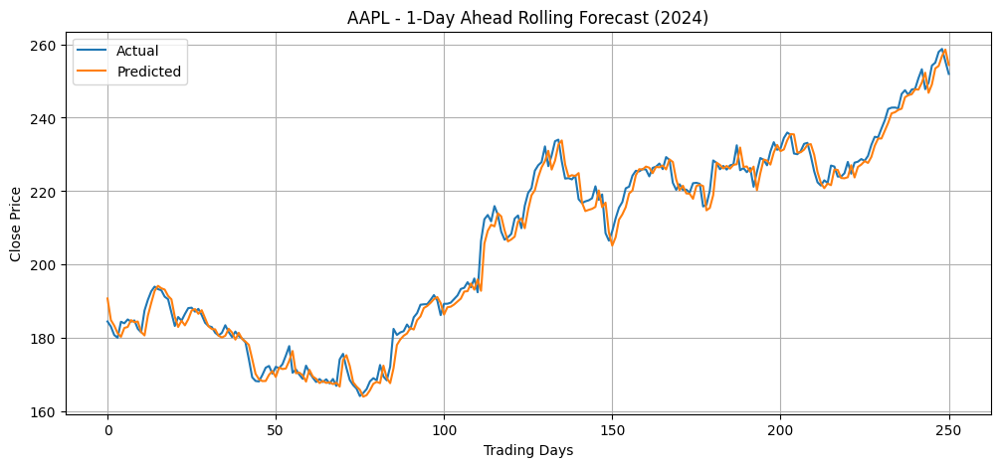

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x550 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

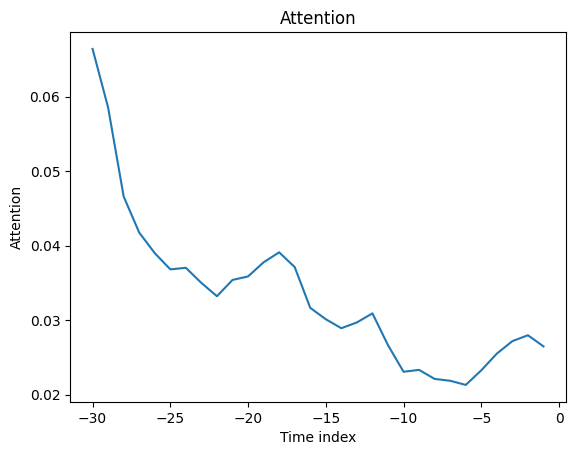

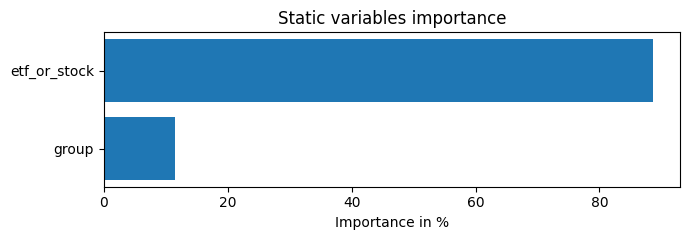

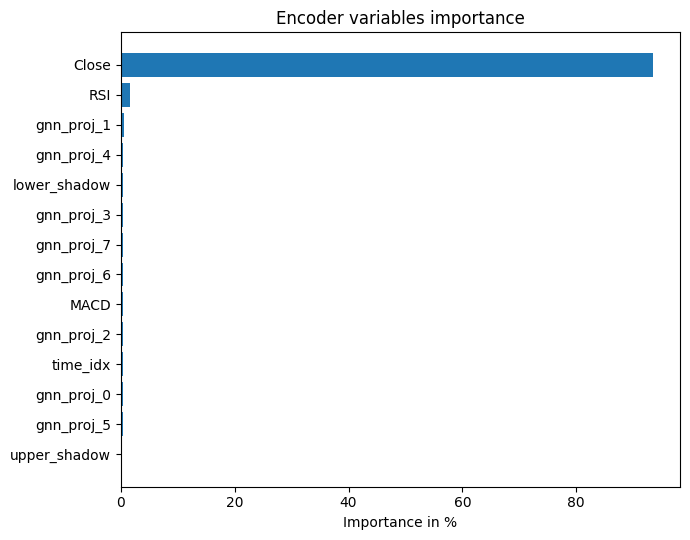

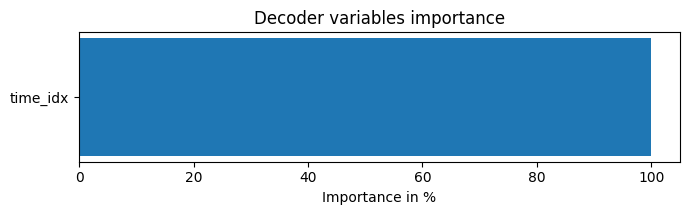

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")
googl = load_stock("GOOGL.csv", "GOOGL", "stock")
msft = load_stock("MSFT.csv", "MSFT", "stock")
amzn = load_stock("AMZN.csv", "AMZN", "stock")
meta = load_stock("META.csv", "META", "stock")
tsla = load_stock("TSLA.csv", "TSLA", "stock")
sony = load_stock("SONY.csv", "SONY", "stock")
jbl = load_stock("JBL.csv", "JBL", "stock")
nflx = load_stock("NFLX.csv", "NFLX", "stock")
amd = load_stock("AMD.csv", "AMD", "stock")
tsm = load_stock("TSM.csv", "TSM", "stock")
orcl = load_stock("ORCL.csv", "ORCL", "stock")
avgo = load_stock("AVGO.csv", "AVGO", "stock")
v = load_stock("V.csv", "V", "stock")
ms = load_stock("MS.csv", "MS", "stock")
cof = load_stock("COF.csv", "COF", "stock")
met = load_stock("MET.csv", "MET", "stock")
amat = load_stock("AMAT.csv", "AMAT", "stock")
mchip = load_stock("MCHP.csv", "MCHP", "stock")
adi = load_stock("ADI.csv", "ADI", "stock")
bac = load_stock("BAC.csv", "BAC", "stock")
blk = load_stock("BLK.csv", "BLK", "stock")
asml = load_stock("ASML.csv", "ASML", "stock")
qcom = load_stock("QCOM.csv", "QCOM", "stock")
crm = load_stock("CRM.csv", "CRM", "stock")
adbe = load_stock("ADBE.csv", "ADBE", "stock")
gs = load_stock("GS.csv", "GS", "stock")
wfc = load_stock("WFC.csv", "WFC", "stock")
schw = load_stock("SCHW.csv", "SCHW", "stock")
bk = load_stock("BK.csv", "BK", "stock")
axp = load_stock("AXP.csv", "AXP", "stock")
txn = load_stock("TXN.csv", "TXN", "stock")
mu = load_stock("MU.csv", "MU", "stock")
nxpi = load_stock("NXPI.csv", "NXPI", "stock")
klac = load_stock("KLAC.csv", "KLAC", "stock")
lrcx = load_stock("LRCX.csv", "LRCX", "stock")
unh = load_stock("UNH.csv", "UNH", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
pfe = load_stock("PFE.csv", "PFE", "stock")
mrk = load_stock("MRK.csv", "MRK", "stock")
lly = load_stock("LLY.csv", "LLY", "stock")
tmo = load_stock("TMO.csv", "TMO", "stock")
bmy = load_stock("BMY.csv", "BMY", "stock")
lmt = load_stock("LMT.csv", "LMT", "stock")
f = load_stock("F.csv", "F", "stock")
gm = load_stock("GM.csv", "GM", "stock")
hmc = load_stock("HMC.csv", "HMC", "stock")
tm = load_stock("TM.csv", "TM", "stock")
wmt = load_stock("WMT.csv", "WMT", "stock")
hd = load_stock("HD.csv", "HD", "stock")
cost = load_stock("COST.csv", "COST", "stock")
pg = load_stock("PG.csv", "PG", "stock")
ko = load_stock("KO.csv", "KO", "stock")
mcd = load_stock("MCD.csv", "MCD", "stock")
tgt = load_stock("TGT.csv", "TGT", "stock")
pep = load_stock("PEP.csv", "PEP", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
nvo = load_stock("NVO.csv", "NVO", "stock")

qqq = load_stock("QQQ.csv", "QQQ", "etf")
dia = load_stock("DIA.csv", "DIA", "etf")
iwm = load_stock("IWM.csv", "IWM", "etf")
xlk = load_stock("XLK.csv", "XLK", "etf")
xlf = load_stock("XLF.csv", "XLF", "etf")
xle = load_stock("XLE.csv", "XLE", "etf")
xli = load_stock("XLI.csv", "XLI", "etf")
xlv = load_stock("XLV.csv", "XLV", "etf")
xly = load_stock("XLY.csv", "XLY", "etf")
xlp = load_stock("XLP.csv", "XLP", "etf")
vnq = load_stock("VNQ.csv", "VNQ", "etf")
iyr = load_stock("IYR.csv", "IYR", "etf")
vgt = load_stock("VGT.csv", "VGT", "etf")
vti = load_stock("VTI.csv", "VTI", "etf")
vug = load_stock("VUG.csv", "VUG", "etf")
vtv = load_stock("VTV.csv", "VTV", "etf")
iwf = load_stock("IWF.csv", "IWF", "etf")
iwg = load_stock("IWD.csv", "IWD", "etf")
itot = load_stock("ITOT.csv", "ITOT", "etf")
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.


df = pd.concat([jpm, nvda, spy, aapl, googl, msft, amzn, meta,
                tsla, sony, jbl, nflx, amd, tsm, orcl, avgo,
                v, ms, cof, met, amat, mchip, adi, #22
                bac, blk, asml, qcom, crm, adbe, gs, wfc, #30
                schw, bk, axp, txn, mu, nxpi, klac, lrcx, #38
                unh, jnj, pfe, mrk, lly, tmo, bmy, lmt, f,
                gm, hmc, tm, wmt, hd, cost, pg, ko, mcd,
                tgt, pep, jnj, nvo, qqq, dia, iwm, xlk, xlf, xle,
                xli, xlv, xly, xlp, vnq, iyr, vgt, vti, vug, vtv, iwf,
                iwg, itot], ignore_index=True)
df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

import torch.nn as nn

class GNNEmbeddingProjector(nn.Module):
    def __init__(self, emb_dim, proj_dim=16):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Linear(emb_dim, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, x):
        return self.proj(x)


# Load GNN embeddings for AAPL (shape [num_days, hidden_dim])
gnn_emb = np.load("aapl_gnn_embeddings.npy")

# Ensure sorted by date to align with your df
aapl_sorted = df[df["group"] == "AAPL"].sort_values("Date").reset_index(drop=True)

if len(gnn_emb) < len(aapl_sorted):
    pad_len = len(aapl_sorted) - len(gnn_emb)
    print(f"Padding GNN embeddings with {pad_len} dummy zeros")
    gnn_emb = np.vstack([np.zeros((pad_len, gnn_emb.shape[1])), gnn_emb])

assert len(aapl_sorted) == len(gnn_emb), "Mismatch between AAPL rows and GNN embeddings!"

# Add each embedding dimension as its own column
hidden_dim = gnn_emb.shape[1]

gnn_cols_proj = [f"gnn_proj_{i}" for i in range(8)]  # matches proj_dim
projector = GNNEmbeddingProjector(hidden_dim, proj_dim=8)

# Apply projector per stock (example for AAPL)
projected = projector(torch.tensor(gnn_emb, dtype=torch.float32)).detach().numpy()

for i, col in enumerate(gnn_cols_proj):
    aapl_sorted[col] = projected[:, i]

# Merge back into full df
df = df.merge(
    aapl_sorted[["Date", "group"] + gnn_cols_proj],
    on=["Date", "group"],
    how="left"
)
df[gnn_cols_proj] = df[gnn_cols_proj].fillna(0.0)

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow"] + gnn_cols_proj,
    static_categoricals=["group", "etf_or_stock"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 503 K  | train
------------------------------------------------------------
503 K     Trainable params
0         Non-trainable params
503 K     Total params
2.015     Total estimated model params size (MB)
381       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.1499
  MAE : 2.3947
  R²  : 0.9848
  MAPE: 1.17%


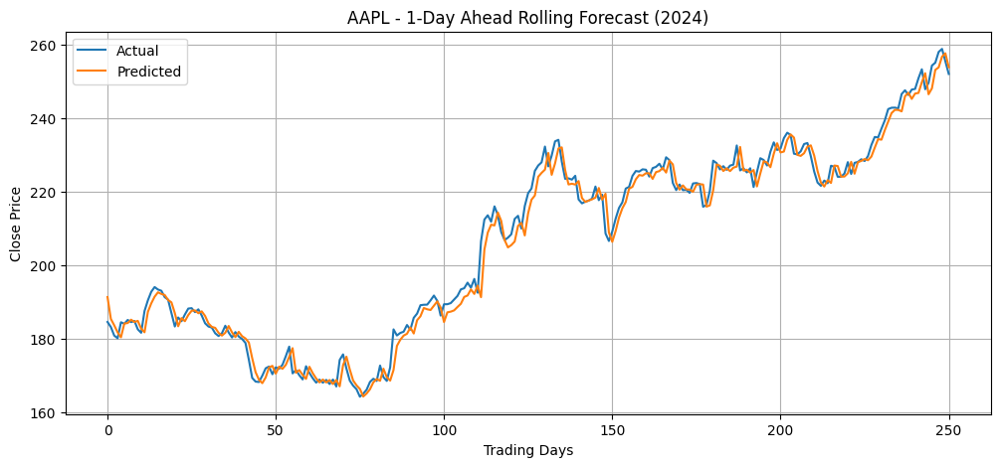

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x550 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

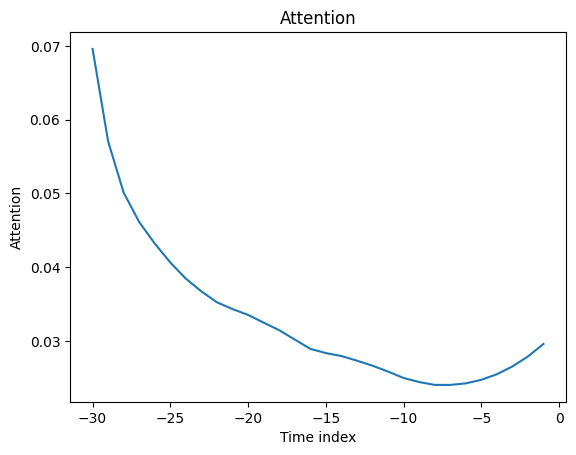

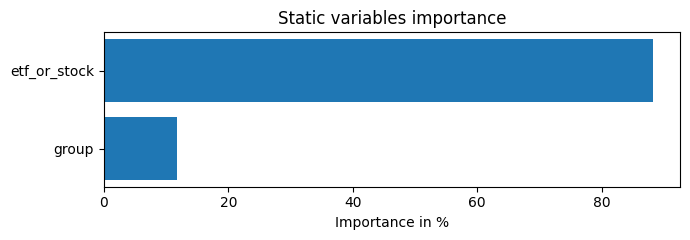

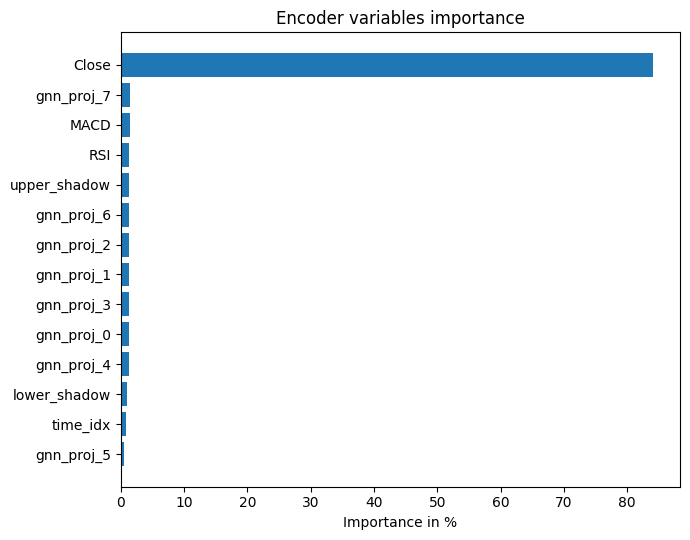

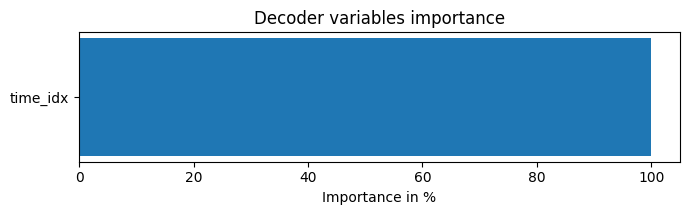

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")
googl = load_stock("GOOGL.csv", "GOOGL", "stock")
msft = load_stock("MSFT.csv", "MSFT", "stock")
amzn = load_stock("AMZN.csv", "AMZN", "stock")
meta = load_stock("META.csv", "META", "stock")
tsla = load_stock("TSLA.csv", "TSLA", "stock")
sony = load_stock("SONY.csv", "SONY", "stock")
jbl = load_stock("JBL.csv", "JBL", "stock")
nflx = load_stock("NFLX.csv", "NFLX", "stock")
amd = load_stock("AMD.csv", "AMD", "stock")
tsm = load_stock("TSM.csv", "TSM", "stock")
orcl = load_stock("ORCL.csv", "ORCL", "stock")
avgo = load_stock("AVGO.csv", "AVGO", "stock")
v = load_stock("V.csv", "V", "stock")
ms = load_stock("MS.csv", "MS", "stock")
cof = load_stock("COF.csv", "COF", "stock")
met = load_stock("MET.csv", "MET", "stock")
amat = load_stock("AMAT.csv", "AMAT", "stock")
mchip = load_stock("MCHP.csv", "MCHP", "stock")
adi = load_stock("ADI.csv", "ADI", "stock")
bac = load_stock("BAC.csv", "BAC", "stock")
blk = load_stock("BLK.csv", "BLK", "stock")
asml = load_stock("ASML.csv", "ASML", "stock")
qcom = load_stock("QCOM.csv", "QCOM", "stock")
crm = load_stock("CRM.csv", "CRM", "stock")
adbe = load_stock("ADBE.csv", "ADBE", "stock")
gs = load_stock("GS.csv", "GS", "stock")
wfc = load_stock("WFC.csv", "WFC", "stock")
schw = load_stock("SCHW.csv", "SCHW", "stock")
bk = load_stock("BK.csv", "BK", "stock")
axp = load_stock("AXP.csv", "AXP", "stock")
txn = load_stock("TXN.csv", "TXN", "stock")
mu = load_stock("MU.csv", "MU", "stock")
nxpi = load_stock("NXPI.csv", "NXPI", "stock")
klac = load_stock("KLAC.csv", "KLAC", "stock")
lrcx = load_stock("LRCX.csv", "LRCX", "stock")
unh = load_stock("UNH.csv", "UNH", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
pfe = load_stock("PFE.csv", "PFE", "stock")
mrk = load_stock("MRK.csv", "MRK", "stock")
lly = load_stock("LLY.csv", "LLY", "stock")
tmo = load_stock("TMO.csv", "TMO", "stock")
bmy = load_stock("BMY.csv", "BMY", "stock")
lmt = load_stock("LMT.csv", "LMT", "stock")
f = load_stock("F.csv", "F", "stock")
gm = load_stock("GM.csv", "GM", "stock")
hmc = load_stock("HMC.csv", "HMC", "stock")
tm = load_stock("TM.csv", "TM", "stock")
wmt = load_stock("WMT.csv", "WMT", "stock")
hd = load_stock("HD.csv", "HD", "stock")
cost = load_stock("COST.csv", "COST", "stock")
pg = load_stock("PG.csv", "PG", "stock")
ko = load_stock("KO.csv", "KO", "stock")
mcd = load_stock("MCD.csv", "MCD", "stock")
tgt = load_stock("TGT.csv", "TGT", "stock")
pep = load_stock("PEP.csv", "PEP", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
nvo = load_stock("NVO.csv", "NVO", "stock")

qqq = load_stock("QQQ.csv", "QQQ", "etf")
dia = load_stock("DIA.csv", "DIA", "etf")
iwm = load_stock("IWM.csv", "IWM", "etf")
xlk = load_stock("XLK.csv", "XLK", "etf")
xlf = load_stock("XLF.csv", "XLF", "etf")
xle = load_stock("XLE.csv", "XLE", "etf")
xli = load_stock("XLI.csv", "XLI", "etf")
xlv = load_stock("XLV.csv", "XLV", "etf")
xly = load_stock("XLY.csv", "XLY", "etf")
xlp = load_stock("XLP.csv", "XLP", "etf")
vnq = load_stock("VNQ.csv", "VNQ", "etf")
iyr = load_stock("IYR.csv", "IYR", "etf")
vgt = load_stock("VGT.csv", "VGT", "etf")
vti = load_stock("VTI.csv", "VTI", "etf")
vug = load_stock("VUG.csv", "VUG", "etf")
vtv = load_stock("VTV.csv", "VTV", "etf")
iwf = load_stock("IWF.csv", "IWF", "etf")
iwg = load_stock("IWD.csv", "IWD", "etf")
itot = load_stock("ITOT.csv", "ITOT", "etf")
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.


df = pd.concat([jpm, nvda, spy, aapl, googl, msft, amzn, meta,
                tsla, sony, jbl, nflx, amd, tsm, orcl, avgo,
                v, ms, cof, met, amat, mchip, adi, #22
                bac, blk, asml, qcom, crm, adbe, gs, wfc, #30
                schw, bk, axp, txn, mu, nxpi, klac, lrcx, #38
                unh, jnj, pfe, mrk, lly, tmo, bmy, lmt, f,
                gm, hmc, tm, wmt, hd, cost, pg, ko, mcd,
                tgt, pep, jnj, nvo, qqq, dia, iwm, xlk, xlf, xle,
                xli, xlv, xly, xlp, vnq, iyr, vgt, vti, vug, vtv, iwf,
                iwg, itot], ignore_index=True)
df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

import torch.nn as nn

class GNNEmbeddingProjector(nn.Module):
    def __init__(self, emb_dim, proj_dim=16):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Linear(emb_dim, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, x):
        return self.proj(x)


# Load GNN embeddings for AAPL (shape [num_days, hidden_dim])
gnn_emb = np.load("aapl_gnn_embeddings.npy")

# Ensure sorted by date to align with your df
aapl_sorted = df[df["group"] == "AAPL"].sort_values("Date").reset_index(drop=True)

if len(gnn_emb) < len(aapl_sorted):
    pad_len = len(aapl_sorted) - len(gnn_emb)
    print(f"Padding GNN embeddings with {pad_len} dummy zeros")
    gnn_emb = np.vstack([np.zeros((pad_len, gnn_emb.shape[1])), gnn_emb])

assert len(aapl_sorted) == len(gnn_emb), "Mismatch between AAPL rows and GNN embeddings!"

# Add each embedding dimension as its own column
hidden_dim = gnn_emb.shape[1]

gnn_cols_proj = [f"gnn_proj_{i}" for i in range(8)]  # matches proj_dim
projector = GNNEmbeddingProjector(hidden_dim, proj_dim=8)

# Apply projector per stock (example for AAPL)
projected = projector(torch.tensor(gnn_emb, dtype=torch.float32)).detach().numpy()

for i, col in enumerate(gnn_cols_proj):
    aapl_sorted[col] = projected[:, i]

# Merge back into full df
df = df.merge(
    aapl_sorted[["Date", "group"] + gnn_cols_proj],
    on=["Date", "group"],
    how="left"
)
df[gnn_cols_proj] = df[gnn_cols_proj].fillna(0.0)

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow"] + gnn_cols_proj,
    static_categoricals=["group", "etf_or_stock"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=96,
    attention_head_size=4,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

In [ ]:
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl_df = load_stock("AAPL.csv", "AAPL", "stock")
aapl_df['Close_lag1'] = aapl_df['Close'].shift(1)
aapl_df = aapl_df[(aapl_df['Date'] >= '2024-01-01') & (aapl_df['Date'] <= '2024-12-31')]


rmse = np.sqrt(mean_squared_error(aapl_df['Close'], aapl_df['Close_lag1']))
mae = mean_absolute_error(aapl_df['Close'], aapl_df['Close_lag1'])
print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")


 AAPL Evaluation:
  RMSE: 2.9022
  MAE : 2.1346


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 228 K  | train
------------------------------------------------------------
228 K     Trainable params
0         Non-trainable params
228 K     Total params
0.915     Total estimated model params size (MB)
321       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.1810
  MAE : 2.4397
  R²  : 0.9845
  MAPE: 1.18%


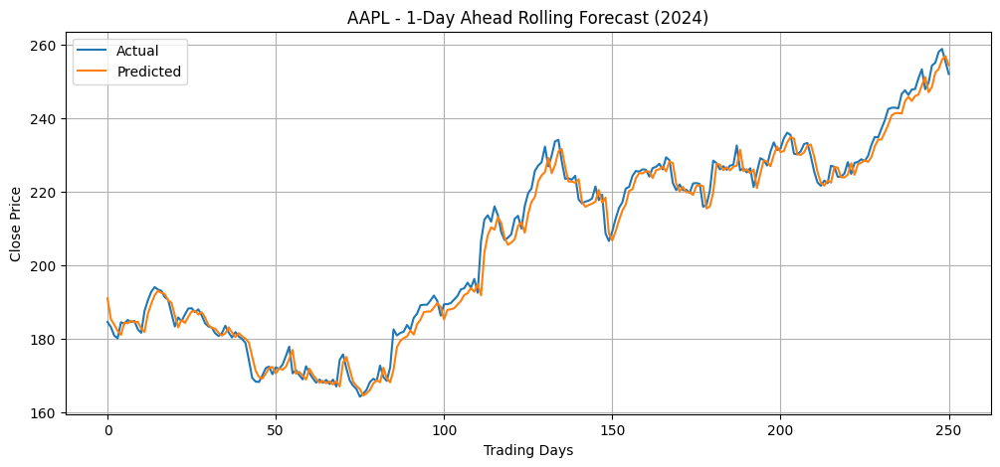

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x450 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

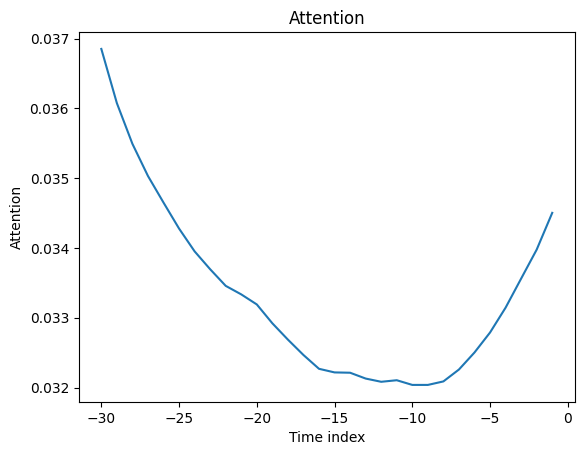

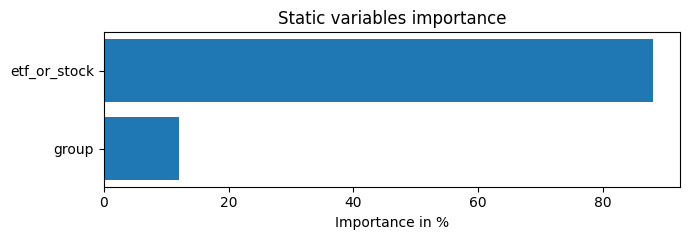

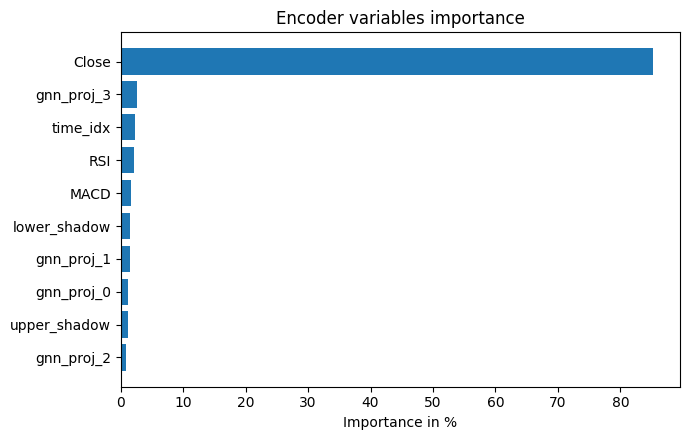

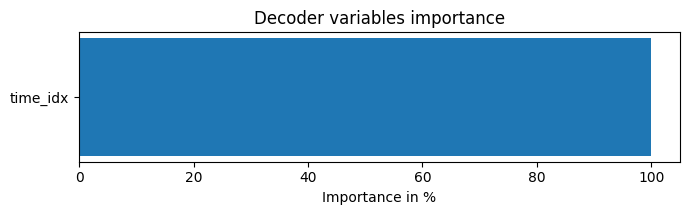

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")
googl = load_stock("GOOGL.csv", "GOOGL", "stock")
msft = load_stock("MSFT.csv", "MSFT", "stock")
amzn = load_stock("AMZN.csv", "AMZN", "stock")
meta = load_stock("META.csv", "META", "stock")
tsla = load_stock("TSLA.csv", "TSLA", "stock")
sony = load_stock("SONY.csv", "SONY", "stock")
jbl = load_stock("JBL.csv", "JBL", "stock")
nflx = load_stock("NFLX.csv", "NFLX", "stock")
amd = load_stock("AMD.csv", "AMD", "stock")
tsm = load_stock("TSM.csv", "TSM", "stock")
orcl = load_stock("ORCL.csv", "ORCL", "stock")
avgo = load_stock("AVGO.csv", "AVGO", "stock")
v = load_stock("V.csv", "V", "stock")
ms = load_stock("MS.csv", "MS", "stock")
cof = load_stock("COF.csv", "COF", "stock")
met = load_stock("MET.csv", "MET", "stock")
amat = load_stock("AMAT.csv", "AMAT", "stock")
mchip = load_stock("MCHP.csv", "MCHP", "stock")
adi = load_stock("ADI.csv", "ADI", "stock")
bac = load_stock("BAC.csv", "BAC", "stock")
blk = load_stock("BLK.csv", "BLK", "stock")
asml = load_stock("ASML.csv", "ASML", "stock")
qcom = load_stock("QCOM.csv", "QCOM", "stock")
crm = load_stock("CRM.csv", "CRM", "stock")
adbe = load_stock("ADBE.csv", "ADBE", "stock")
gs = load_stock("GS.csv", "GS", "stock")
wfc = load_stock("WFC.csv", "WFC", "stock")
schw = load_stock("SCHW.csv", "SCHW", "stock")
bk = load_stock("BK.csv", "BK", "stock")
axp = load_stock("AXP.csv", "AXP", "stock")
txn = load_stock("TXN.csv", "TXN", "stock")
mu = load_stock("MU.csv", "MU", "stock")
nxpi = load_stock("NXPI.csv", "NXPI", "stock")
klac = load_stock("KLAC.csv", "KLAC", "stock")
lrcx = load_stock("LRCX.csv", "LRCX", "stock")
unh = load_stock("UNH.csv", "UNH", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
pfe = load_stock("PFE.csv", "PFE", "stock")
mrk = load_stock("MRK.csv", "MRK", "stock")
lly = load_stock("LLY.csv", "LLY", "stock")
tmo = load_stock("TMO.csv", "TMO", "stock")
bmy = load_stock("BMY.csv", "BMY", "stock")
lmt = load_stock("LMT.csv", "LMT", "stock")
f = load_stock("F.csv", "F", "stock")
gm = load_stock("GM.csv", "GM", "stock")
hmc = load_stock("HMC.csv", "HMC", "stock")
tm = load_stock("TM.csv", "TM", "stock")
wmt = load_stock("WMT.csv", "WMT", "stock")
hd = load_stock("HD.csv", "HD", "stock")
cost = load_stock("COST.csv", "COST", "stock")
pg = load_stock("PG.csv", "PG", "stock")
ko = load_stock("KO.csv", "KO", "stock")
mcd = load_stock("MCD.csv", "MCD", "stock")
tgt = load_stock("TGT.csv", "TGT", "stock")
pep = load_stock("PEP.csv", "PEP", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
nvo = load_stock("NVO.csv", "NVO", "stock")

qqq = load_stock("QQQ.csv", "QQQ", "etf")
dia = load_stock("DIA.csv", "DIA", "etf")
iwm = load_stock("IWM.csv", "IWM", "etf")
xlk = load_stock("XLK.csv", "XLK", "etf")
xlf = load_stock("XLF.csv", "XLF", "etf")
xle = load_stock("XLE.csv", "XLE", "etf")
xli = load_stock("XLI.csv", "XLI", "etf")
xlv = load_stock("XLV.csv", "XLV", "etf")
xly = load_stock("XLY.csv", "XLY", "etf")
xlp = load_stock("XLP.csv", "XLP", "etf")
vnq = load_stock("VNQ.csv", "VNQ", "etf")
iyr = load_stock("IYR.csv", "IYR", "etf")
vgt = load_stock("VGT.csv", "VGT", "etf")
vti = load_stock("VTI.csv", "VTI", "etf")
vug = load_stock("VUG.csv", "VUG", "etf")
vtv = load_stock("VTV.csv", "VTV", "etf")
iwf = load_stock("IWF.csv", "IWF", "etf")
iwg = load_stock("IWD.csv", "IWD", "etf")
itot = load_stock("ITOT.csv", "ITOT", "etf")
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.


df = pd.concat([jpm, nvda, spy, aapl, googl, msft, amzn, meta,
                tsla, sony, jbl, nflx, amd, tsm, orcl, avgo,
                v, ms, cof, met, amat, mchip, adi, #22
                bac, blk, asml, qcom, crm, adbe, gs, wfc, #30
                schw, bk, axp, txn, mu, nxpi, klac, lrcx, #38
                unh, jnj, pfe, mrk, lly, tmo, bmy, lmt, f,
                gm, hmc, tm, wmt, hd, cost, pg, ko, mcd,
                tgt, pep, jnj, nvo, qqq, dia, iwm, xlk, xlf, xle,
                xli, xlv, xly, xlp, vnq, iyr, vgt, vti, vug, vtv, iwf,
                iwg, itot], ignore_index=True)
df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

import torch.nn as nn

class GNNEmbeddingProjector(nn.Module):
    def __init__(self, emb_dim, proj_dim=16):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Linear(emb_dim, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, x):
        return self.proj(x)


# Load GNN embeddings for AAPL (shape [num_days, hidden_dim])
gnn_emb = np.load("aapl_gnn_embeddings.npy")

# Ensure sorted by date to align with your df
aapl_sorted = df[df["group"] == "AAPL"].sort_values("Date").reset_index(drop=True)

if len(gnn_emb) < len(aapl_sorted):
    pad_len = len(aapl_sorted) - len(gnn_emb)
    print(f"Padding GNN embeddings with {pad_len} dummy zeros")
    gnn_emb = np.vstack([np.zeros((pad_len, gnn_emb.shape[1])), gnn_emb])

assert len(aapl_sorted) == len(gnn_emb), "Mismatch between AAPL rows and GNN embeddings!"

# Add each embedding dimension as its own column
hidden_dim = gnn_emb.shape[1]

gnn_cols_proj = [f"gnn_proj_{i}" for i in range(4)]  # matches proj_dim
projector = GNNEmbeddingProjector(hidden_dim, proj_dim=4)

# Apply projector per stock (example for AAPL)
projected = projector(torch.tensor(gnn_emb, dtype=torch.float32)).detach().numpy()

for i, col in enumerate(gnn_cols_proj):
    aapl_sorted[col] = projected[:, i]

# Merge back into full df
df = df.merge(
    aapl_sorted[["Date", "group"] + gnn_cols_proj],
    on=["Date", "group"],
    how="left"
)
df[gnn_cols_proj] = df[gnn_cols_proj].fillna(0.0)

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow"] + gnn_cols_proj,
    static_categoricals=["group", "etf_or_stock"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=64,
    attention_head_size=4,
    dropout=0.05,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# TFT GNN 3: Signal not embeddings

Epoch 01 | Train Loss: 0.0150 | Test Loss: 0.0247
 New best model saved (Train Loss: 0.0247)
Epoch 02 | Train Loss: 0.0044 | Test Loss: 0.0257
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0037 | Test Loss: 0.0249
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0030 | Test Loss: 0.0392
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0029 | Test Loss: 0.0411
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0028 | Test Loss: 0.0523
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0247
 Saved trained GNN model to gnn_model_aapl.pt
AAPL — RMSE: 40.6319 | MAE: 33.6511 | MAPE: 50.79% | R²: 0.5306


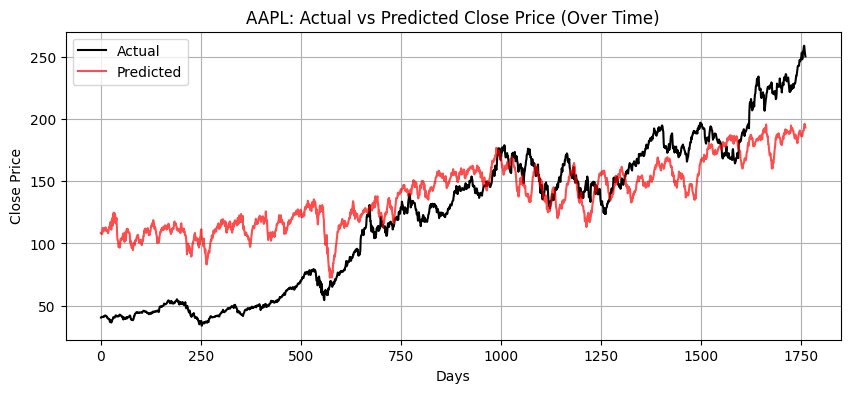

Extracted attention weights for AAPL for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


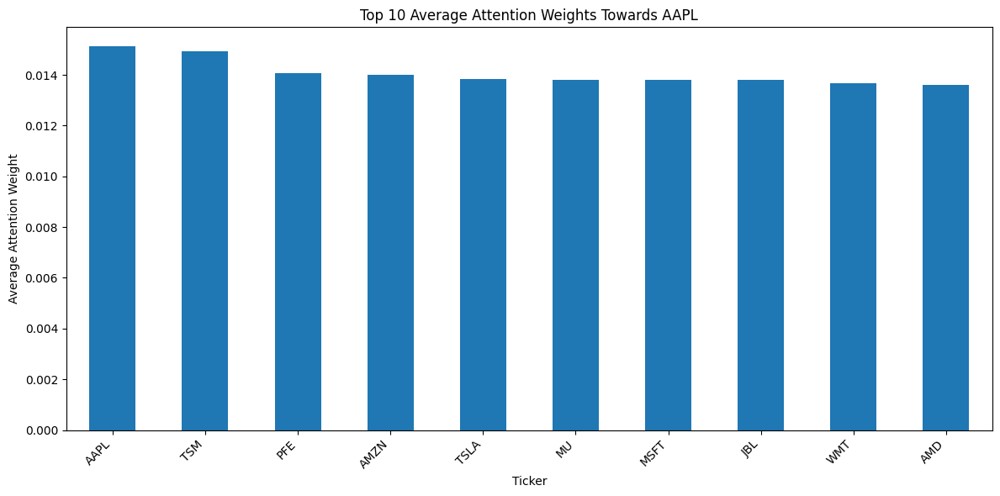

Top 10 tickers by average attention weight towards AAPL:
AAPL    0.015123
TSM     0.014921
PFE     0.014072
AMZN    0.013995
TSLA    0.013842
MU      0.013810
MSFT    0.013798
JBL     0.013798
WMT     0.013679
AMD     0.013602
dtype: float32


In [ ]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.5):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# --- Save model after training ---
torch.save(model.state_dict(), "gnn_model_aapl.pt")
print(" Saved trained GNN model to gnn_model_aapl.pt")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [ ]:
len(gnn_predictions)

1761

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 225 K  | train
------------------------------------------------------------
225 K     Trainable params
0         Non-trainable params
225 K     Total params
0.900     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.2531
  MAE : 2.4926
  R²  : 0.9838
  MAPE: 1.23%


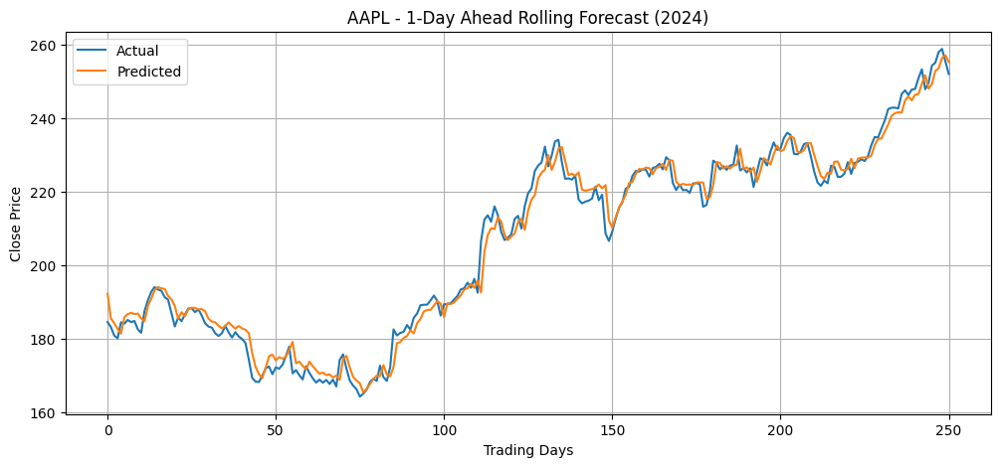

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

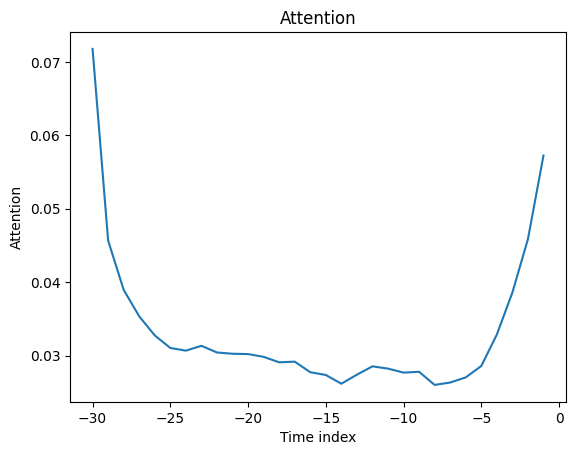

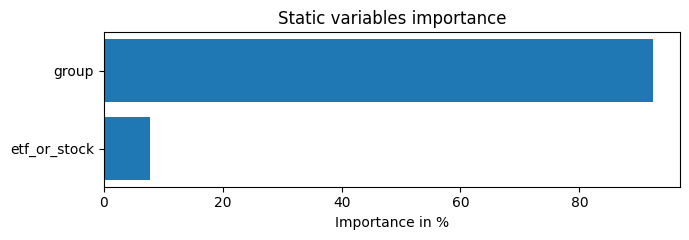

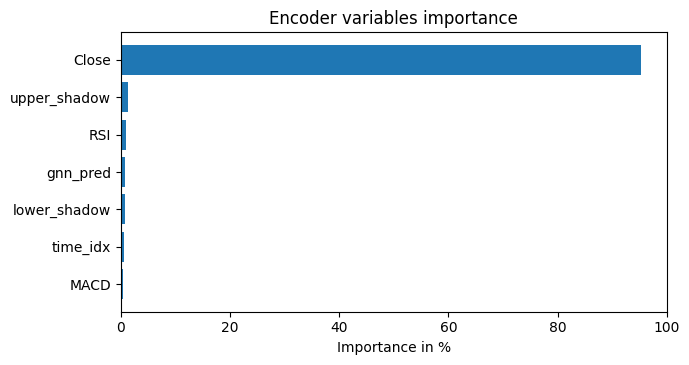

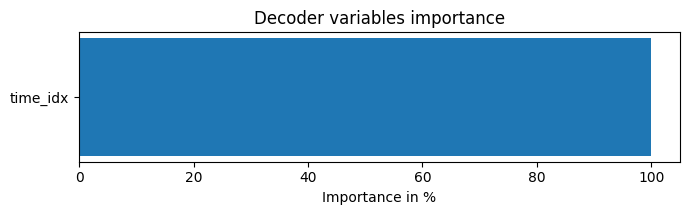

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")
googl = load_stock("GOOGL.csv", "GOOGL", "stock")
msft = load_stock("MSFT.csv", "MSFT", "stock")
amzn = load_stock("AMZN.csv", "AMZN", "stock")
meta = load_stock("META.csv", "META", "stock")
tsla = load_stock("TSLA.csv", "TSLA", "stock")
sony = load_stock("SONY.csv", "SONY", "stock")
jbl = load_stock("JBL.csv", "JBL", "stock")
nflx = load_stock("NFLX.csv", "NFLX", "stock")
amd = load_stock("AMD.csv", "AMD", "stock")
tsm = load_stock("TSM.csv", "TSM", "stock")
orcl = load_stock("ORCL.csv", "ORCL", "stock")
avgo = load_stock("AVGO.csv", "AVGO", "stock")
v = load_stock("V.csv", "V", "stock")
ms = load_stock("MS.csv", "MS", "stock")
cof = load_stock("COF.csv", "COF", "stock")
met = load_stock("MET.csv", "MET", "stock")
amat = load_stock("AMAT.csv", "AMAT", "stock")
mchip = load_stock("MCHP.csv", "MCHP", "stock")
adi = load_stock("ADI.csv", "ADI", "stock")
bac = load_stock("BAC.csv", "BAC", "stock")
blk = load_stock("BLK.csv", "BLK", "stock")
asml = load_stock("ASML.csv", "ASML", "stock")
qcom = load_stock("QCOM.csv", "QCOM", "stock")
crm = load_stock("CRM.csv", "CRM", "stock")
adbe = load_stock("ADBE.csv", "ADBE", "stock")
gs = load_stock("GS.csv", "GS", "stock")
wfc = load_stock("WFC.csv", "WFC", "stock")
schw = load_stock("SCHW.csv", "SCHW", "stock")
bk = load_stock("BK.csv", "BK", "stock")
axp = load_stock("AXP.csv", "AXP", "stock")
txn = load_stock("TXN.csv", "TXN", "stock")
mu = load_stock("MU.csv", "MU", "stock")
nxpi = load_stock("NXPI.csv", "NXPI", "stock")
klac = load_stock("KLAC.csv", "KLAC", "stock")
lrcx = load_stock("LRCX.csv", "LRCX", "stock")
unh = load_stock("UNH.csv", "UNH", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
pfe = load_stock("PFE.csv", "PFE", "stock")
mrk = load_stock("MRK.csv", "MRK", "stock")
lly = load_stock("LLY.csv", "LLY", "stock")
tmo = load_stock("TMO.csv", "TMO", "stock")
bmy = load_stock("BMY.csv", "BMY", "stock")
lmt = load_stock("LMT.csv", "LMT", "stock")
f = load_stock("F.csv", "F", "stock")
gm = load_stock("GM.csv", "GM", "stock")
hmc = load_stock("HMC.csv", "HMC", "stock")
tm = load_stock("TM.csv", "TM", "stock")
wmt = load_stock("WMT.csv", "WMT", "stock")
hd = load_stock("HD.csv", "HD", "stock")
cost = load_stock("COST.csv", "COST", "stock")
pg = load_stock("PG.csv", "PG", "stock")
ko = load_stock("KO.csv", "KO", "stock")
mcd = load_stock("MCD.csv", "MCD", "stock")
tgt = load_stock("TGT.csv", "TGT", "stock")
pep = load_stock("PEP.csv", "PEP", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
nvo = load_stock("NVO.csv", "NVO", "stock")

qqq = load_stock("QQQ.csv", "QQQ", "etf")
dia = load_stock("DIA.csv", "DIA", "etf")
iwm = load_stock("IWM.csv", "IWM", "etf")
xlk = load_stock("XLK.csv", "XLK", "etf")
xlf = load_stock("XLF.csv", "XLF", "etf")
xle = load_stock("XLE.csv", "XLE", "etf")
xli = load_stock("XLI.csv", "XLI", "etf")
xlv = load_stock("XLV.csv", "XLV", "etf")
xly = load_stock("XLY.csv", "XLY", "etf")
xlp = load_stock("XLP.csv", "XLP", "etf")
vnq = load_stock("VNQ.csv", "VNQ", "etf")
iyr = load_stock("IYR.csv", "IYR", "etf")
vgt = load_stock("VGT.csv", "VGT", "etf")
vti = load_stock("VTI.csv", "VTI", "etf")
vug = load_stock("VUG.csv", "VUG", "etf")
vtv = load_stock("VTV.csv", "VTV", "etf")
iwf = load_stock("IWF.csv", "IWF", "etf")
iwg = load_stock("IWD.csv", "IWD", "etf")
itot = load_stock("ITOT.csv", "ITOT", "etf")
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.


df = pd.concat([jpm, nvda, spy, aapl, googl, msft, amzn, meta,
                tsla, sony, jbl, nflx, amd, tsm, orcl, avgo,
                v, ms, cof, met, amat, mchip, adi, #22
                bac, blk, asml, qcom, crm, adbe, gs, wfc, #30
                schw, bk, axp, txn, mu, nxpi, klac, lrcx, #38
                unh, jnj, pfe, mrk, lly, tmo, bmy, lmt, f,
                gm, hmc, tm, wmt, hd, cost, pg, ko, mcd,
                tgt, pep, jnj, nvo, qqq, dia, iwm, xlk, xlf, xle,
                xli, xlv, xly, xlp, vnq, iyr, vgt, vti, vug, vtv, iwf,
                iwg, itot], ignore_index=True)

df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
# Assuming predictions are for AAPL only
gnn_preds_df = pd.DataFrame({
    "Date": df[df["group"] == "AAPL"]["Date"].reset_index(drop=True),
    "group": "AAPL",
    "gnn_pred": gnn_predictions  # your 1761-length array
})
df = df.merge(
    gnn_preds_df,
    on=["Date", "group"],
    how="left"
)

df["gnn_pred"] = df["gnn_pred"].fillna(0)

df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow", "gnn_pred"],
    static_categoricals=["group", "etf_or_stock"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# TFT GNN 4: Signal not embeddings - classification gnn is bad.


In [18]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])
    df['Close_next'] = df['Close'].shift(-1)
    df['up_down'] = (df['Close_next'] > df['Close']).astype(int)   # 1 = up, 0 = down


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 6  # today + previous 5 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['up_down'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.long)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd_class.pt')

In [22]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd_class.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

from collections import Counter
import torch

# Count labels in training set
labels = [int(data.y.item()) for data in train_graphs]  # assuming y is scalar 0/1
class_counts = Counter(labels)

print("Class distribution:", class_counts)

# Convert to tensor of weights (inverse frequency)
total = sum(class_counts.values())
class_weights = [total / class_counts[i] for i in range(len(class_counts))]
class_weights = torch.tensor(class_weights, dtype=torch.float)
print("Class weights:", class_weights)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels=2, heads=4, dropout_prob=0.1):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # 2 classes
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)
        output = self.fc(x)  # shape: [num_nodes, 2]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=6, hidden_channels=128, out_channels=2).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.CrossEntropyLoss(weight=class_weights.to(device))

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)

        # Check for NaN/Inf in input features
        if torch.isnan(data.x).any() or torch.isinf(data.x).any():
            print("NaN or Inf found in input features (train data)")
            continue
        # Check for NaN/Inf in target labels
        if torch.isnan(data.y).any() or torch.isinf(data.y).any():
            print("NaN or Inf found in target labels (train data)")
            continue

        optimizer.zero_grad()
        out, _ = model(data)
        # Select prediction for the target node and ensure shape is [1, 2]
        out_target_nodes = out[data.target_node_ids]#.unsqueeze(0) # shape [1, 2]
        # Ensure target label is shape [1]
        # Correct
        target_label = data.y.to(device).long().view(-1)  # shape [1]

        loss = loss_fn(out_target_nodes, target_label)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    all_preds, all_labels = [], []
    all_attn_weights = []

    with torch.no_grad():
        for data in loader:
            data = data.to(device)

            # Check for NaN/Inf in input features
            if torch.isnan(data.x).any() or torch.isinf(data.x).any():
                print("NaN or Inf found in input features (test data)")
                continue
            # Check for NaN/Inf in target labels
            if torch.isnan(data.y).any() or torch.isinf(data.y).any():
                print("NaN or Inf found in target labels (test data)")
                continue

            out, (edge_index_attn, attn_weights_tensor) = model(data)
            # Select prediction for the target node and ensure shape is [1, 2]
            out_target_nodes = out[data.target_node_ids]#.unsqueeze(0) # shape [1, 2]
            # Ensure target label is shape [1]
            # Correct
            target_label = data.y.to(device).long().view(-1)

            loss = loss_fn(out_target_nodes, target_label)
            total_loss += loss.item()

            print("Raw output for target node:", out_target_nodes)
            pred_class = out_target_nodes.argmax(dim=1).item() # Argmax over class dimension
            true_class = data.y.item()

            all_preds.append(pred_class)
            all_labels.append(true_class)

            if pred_class == true_class:
                correct += 1
            total += 1
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor


    acc = correct / total
    return total_loss / len(loader), acc, all_preds, all_labels, all_attn_weights


import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, acc, preds, labels, test_attn_weights = test(test_loader)


    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f} | Test Accuracy: {acc:.4f}")

    # --- Early stopping check (based on train loss) ---
    if acc < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = acc
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# --- Save model after training ---
torch.save(model.state_dict(), "gnn_model_aapl.pt")
print(" Saved trained GNN model to gnn_model_aapl.pt")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')


from sklearn.metrics import classification_report, confusion_matrix

test_loss, acc, preds, labels, test_attn_weights = test(test_loader)
print(f"Test Loss: {test_loss:.4f} | Accuracy: {acc:.4f}")
print(classification_report(labels, preds, target_names=["Down", "Up"]))
print(confusion_matrix(labels, preds))

gnn_predictions = predictions
#





# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Class distribution: Counter({1: 812, 0: 712})
Class weights: tensor([16.1404,  1.8768])
Raw output for target node: tensor([[-0.0525,  0.0687]])
Raw output for target node: tensor([[-0.0525,  0.0686]])
Raw output for target node: tensor([[-0.0526,  0.0685]])
Raw output for target node: tensor([[-0.0528,  0.0686]])
Raw output for target node: tensor([[-0.0528,  0.0688]])
Raw output for target node: tensor([[-0.0529,  0.0689]])
Raw output for target node: tensor([[-0.0529,  0.0689]])
Raw output for target node: tensor([[-0.0528,  0.0690]])
Raw output for target node: tensor([[-0.0530,  0.0689]])
Raw output for target node: tensor([[-0.0533,  0.0690]])
Raw output for target node: tensor([[-0.0532,  0.0693]])
Raw output for target node: tensor([[-0.0532,  0.0694]])
Raw output for target node: tensor([[-0.0532,  0.0693]])
Raw output for target node: tensor([[-0.0532,  0.0693]])
Raw output for target node: tensor([[-0.0531,  0.0693]])
Raw output for target node: tensor([[-0.0532,  0.0693]])


KeyboardInterrupt: 

In [16]:
print(set([int(d.y.item()) for d in graph_list]))


{0, 1}


len(gnn_predictions)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 225 K  | train
------------------------------------------------------------
225 K     Trainable params
0         Non-trainable params
225 K     Total params
0.900     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.2531
  MAE : 2.4926
  R²  : 0.9838
  MAPE: 1.23%


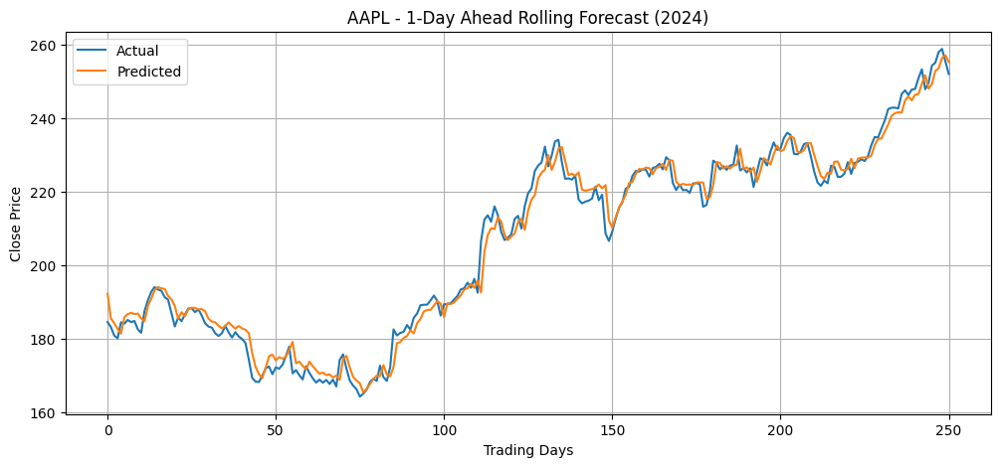

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

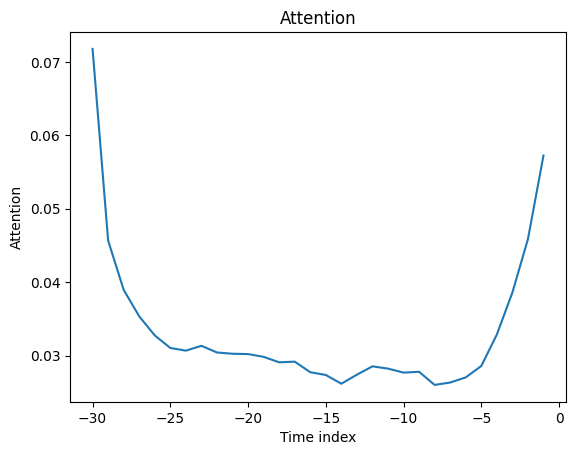

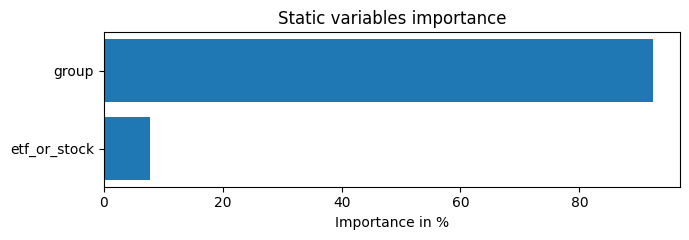

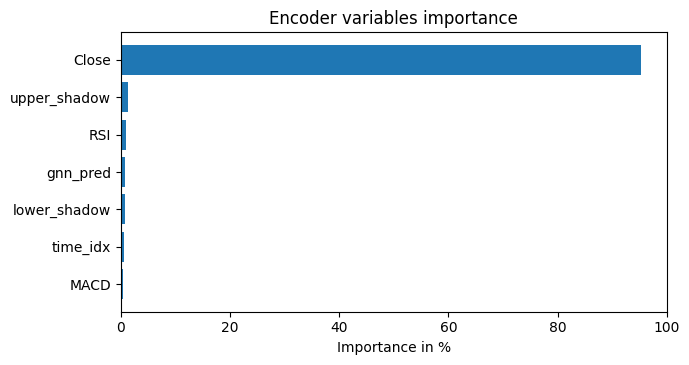

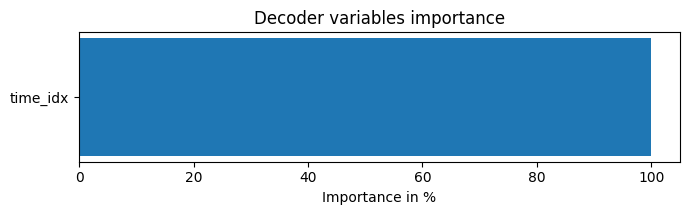

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")
googl = load_stock("GOOGL.csv", "GOOGL", "stock")
msft = load_stock("MSFT.csv", "MSFT", "stock")
amzn = load_stock("AMZN.csv", "AMZN", "stock")
meta = load_stock("META.csv", "META", "stock")
tsla = load_stock("TSLA.csv", "TSLA", "stock")
sony = load_stock("SONY.csv", "SONY", "stock")
jbl = load_stock("JBL.csv", "JBL", "stock")
nflx = load_stock("NFLX.csv", "NFLX", "stock")
amd = load_stock("AMD.csv", "AMD", "stock")
tsm = load_stock("TSM.csv", "TSM", "stock")
orcl = load_stock("ORCL.csv", "ORCL", "stock")
avgo = load_stock("AVGO.csv", "AVGO", "stock")
v = load_stock("V.csv", "V", "stock")
ms = load_stock("MS.csv", "MS", "stock")
cof = load_stock("COF.csv", "COF", "stock")
met = load_stock("MET.csv", "MET", "stock")
amat = load_stock("AMAT.csv", "AMAT", "stock")
mchip = load_stock("MCHP.csv", "MCHP", "stock")
adi = load_stock("ADI.csv", "ADI", "stock")
bac = load_stock("BAC.csv", "BAC", "stock")
blk = load_stock("BLK.csv", "BLK", "stock")
asml = load_stock("ASML.csv", "ASML", "stock")
qcom = load_stock("QCOM.csv", "QCOM", "stock")
crm = load_stock("CRM.csv", "CRM", "stock")
adbe = load_stock("ADBE.csv", "ADBE", "stock")
gs = load_stock("GS.csv", "GS", "stock")
wfc = load_stock("WFC.csv", "WFC", "stock")
schw = load_stock("SCHW.csv", "SCHW", "stock")
bk = load_stock("BK.csv", "BK", "stock")
axp = load_stock("AXP.csv", "AXP", "stock")
txn = load_stock("TXN.csv", "TXN", "stock")
mu = load_stock("MU.csv", "MU", "stock")
nxpi = load_stock("NXPI.csv", "NXPI", "stock")
klac = load_stock("KLAC.csv", "KLAC", "stock")
lrcx = load_stock("LRCX.csv", "LRCX", "stock")
unh = load_stock("UNH.csv", "UNH", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
pfe = load_stock("PFE.csv", "PFE", "stock")
mrk = load_stock("MRK.csv", "MRK", "stock")
lly = load_stock("LLY.csv", "LLY", "stock")
tmo = load_stock("TMO.csv", "TMO", "stock")
bmy = load_stock("BMY.csv", "BMY", "stock")
lmt = load_stock("LMT.csv", "LMT", "stock")
f = load_stock("F.csv", "F", "stock")
gm = load_stock("GM.csv", "GM", "stock")
hmc = load_stock("HMC.csv", "HMC", "stock")
tm = load_stock("TM.csv", "TM", "stock")
wmt = load_stock("WMT.csv", "WMT", "stock")
hd = load_stock("HD.csv", "HD", "stock")
cost = load_stock("COST.csv", "COST", "stock")
pg = load_stock("PG.csv", "PG", "stock")
ko = load_stock("KO.csv", "KO", "stock")
mcd = load_stock("MCD.csv", "MCD", "stock")
tgt = load_stock("TGT.csv", "TGT", "stock")
pep = load_stock("PEP.csv", "PEP", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
nvo = load_stock("NVO.csv", "NVO", "stock")

qqq = load_stock("QQQ.csv", "QQQ", "etf")
dia = load_stock("DIA.csv", "DIA", "etf")
iwm = load_stock("IWM.csv", "IWM", "etf")
xlk = load_stock("XLK.csv", "XLK", "etf")
xlf = load_stock("XLF.csv", "XLF", "etf")
xle = load_stock("XLE.csv", "XLE", "etf")
xli = load_stock("XLI.csv", "XLI", "etf")
xlv = load_stock("XLV.csv", "XLV", "etf")
xly = load_stock("XLY.csv", "XLY", "etf")
xlp = load_stock("XLP.csv", "XLP", "etf")
vnq = load_stock("VNQ.csv", "VNQ", "etf")
iyr = load_stock("IYR.csv", "IYR", "etf")
vgt = load_stock("VGT.csv", "VGT", "etf")
vti = load_stock("VTI.csv", "VTI", "etf")
vug = load_stock("VUG.csv", "VUG", "etf")
vtv = load_stock("VTV.csv", "VTV", "etf")
iwf = load_stock("IWF.csv", "IWF", "etf")
iwg = load_stock("IWD.csv", "IWD", "etf")
itot = load_stock("ITOT.csv", "ITOT", "etf")
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.


df = pd.concat([jpm, nvda, spy, aapl, googl, msft, amzn, meta,
                tsla, sony, jbl, nflx, amd, tsm, orcl, avgo,
                v, ms, cof, met, amat, mchip, adi, #22
                bac, blk, asml, qcom, crm, adbe, gs, wfc, #30
                schw, bk, axp, txn, mu, nxpi, klac, lrcx, #38
                unh, jnj, pfe, mrk, lly, tmo, bmy, lmt, f,
                gm, hmc, tm, wmt, hd, cost, pg, ko, mcd,
                tgt, pep, jnj, nvo, qqq, dia, iwm, xlk, xlf, xle,
                xli, xlv, xly, xlp, vnq, iyr, vgt, vti, vug, vtv, iwf,
                iwg, itot], ignore_index=True)

df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
# Assuming predictions are for AAPL only
gnn_preds_df = pd.DataFrame({
    "Date": df[df["group"] == "AAPL"]["Date"].reset_index(drop=True),
    "group": "AAPL",
    "gnn_pred": gnn_predictions  # your 1761-length array
})
df = df.merge(
    gnn_preds_df,
    on=["Date", "group"],
    how="left"
)

df["gnn_pred"] = df["gnn_pred"].fillna(0)

df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow", "gnn_pred"],
    static_categoricals=["group", "etf_or_stock"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# TFTGNN 5: Preds to class - just needs to be run on a gpu. maybe tune gnn.

In [27]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close', 'RSI', 'MACD']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0123 | Test Loss: 0.0533
 New best model saved (Train Loss: 0.0533)
Epoch 02 | Train Loss: 0.0044 | Test Loss: 0.0337
 New best model saved (Train Loss: 0.0337)
Epoch 03 | Train Loss: 0.0034 | Test Loss: 0.0421
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0028 | Test Loss: 0.0543
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0028 | Test Loss: 0.0578
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0025 | Test Loss: 0.0456
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0023 | Test Loss: 0.0655
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0337
 Saved trained GNN model to gnn_model_aapl.pt
AAPL — RMSE: 47.4659 | MAE: 38.3335 | MAPE: 61.20% | R²: 0.3594


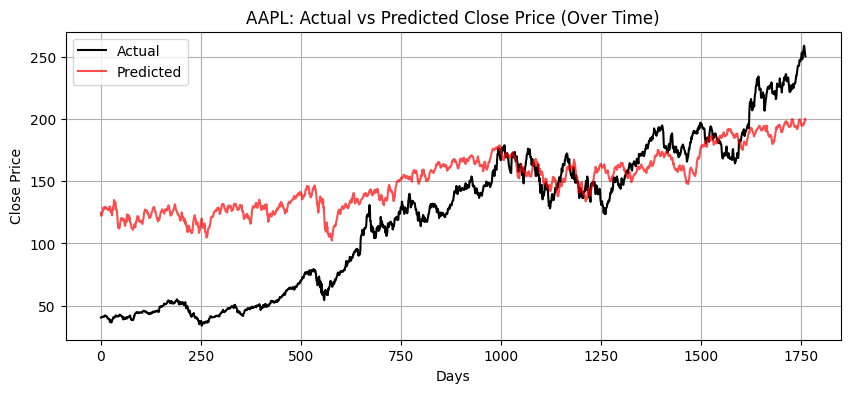

Extracted attention weights for AAPL for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


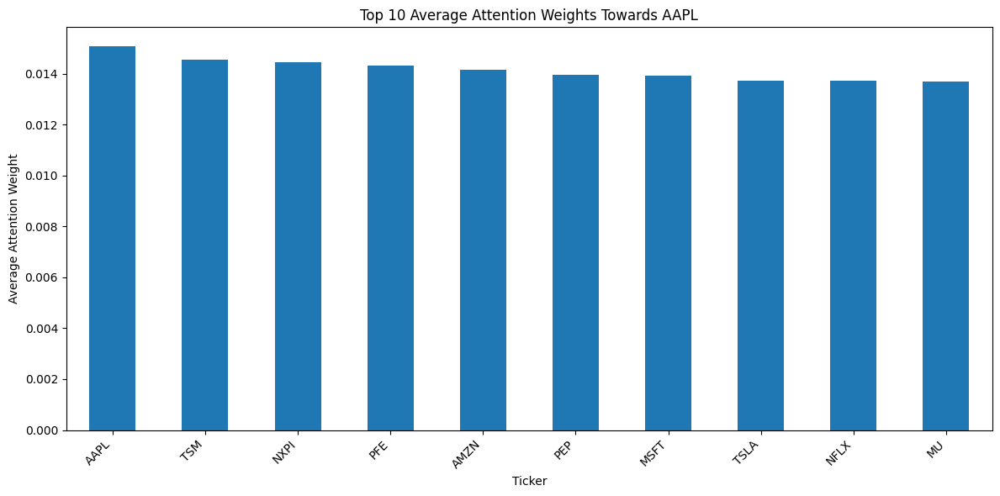

Top 10 tickers by average attention weight towards AAPL:
AAPL    0.015070
TSM     0.014532
NXPI    0.014443
PFE     0.014310
AMZN    0.014158
PEP     0.013937
MSFT    0.013917
TSLA    0.013732
NFLX    0.013711
MU      0.013687
dtype: float32


In [28]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.5):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=63, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# --- Save model after training ---
torch.save(model.state_dict(), "gnn_model_aapl.pt")
print(" Saved trained GNN model to gnn_model_aapl.pt")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [29]:
import numpy as np

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1

In [31]:
len(gnn_updown)

1761

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 225 K  | train
------------------------------------------------------------
225 K     Trainable params
0         Non-trainable params
225 K     Total params
0.900     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.2531
  MAE : 2.4926
  R²  : 0.9838
  MAPE: 1.23%


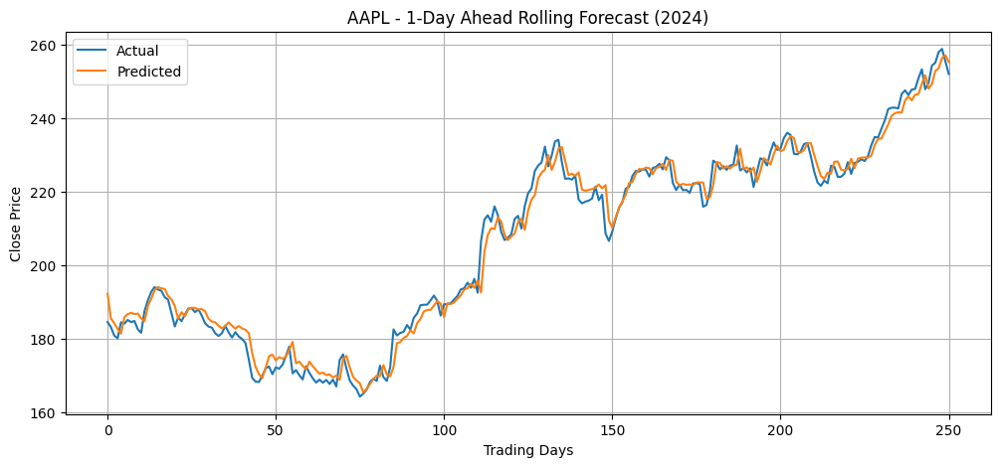

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

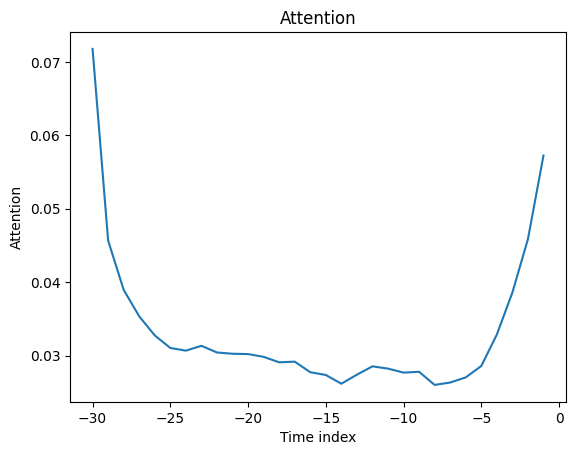

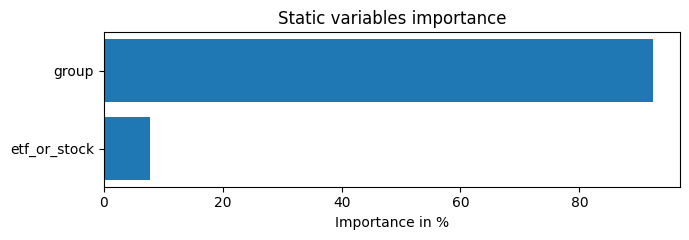

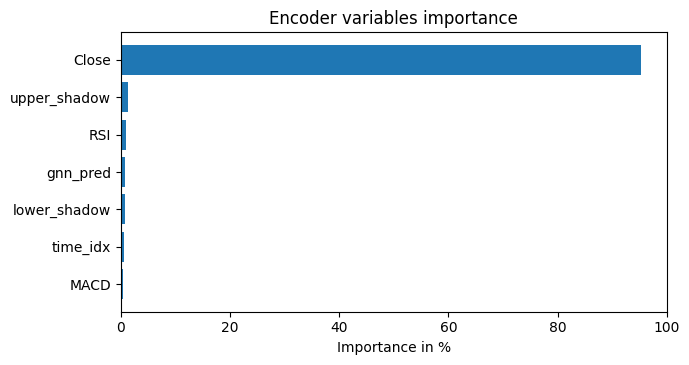

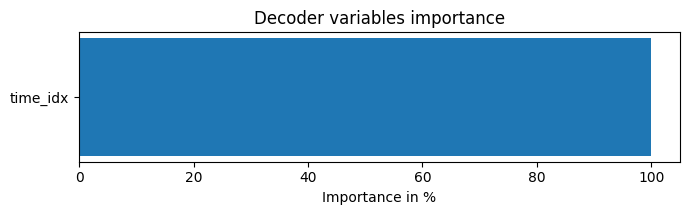

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, etf_or_stock):
    if etf_or_stock == "etf":
        file_path = "/content/drive/MyDrive/CW_backup/etfs/" + file_path
    else:
        file_path = "/content/drive/MyDrive/CW_backup/stocks/" + file_path
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['etf_or_stock'] = etf_or_stock
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")
googl = load_stock("GOOGL.csv", "GOOGL", "stock")
msft = load_stock("MSFT.csv", "MSFT", "stock")
amzn = load_stock("AMZN.csv", "AMZN", "stock")
meta = load_stock("META.csv", "META", "stock")
tsla = load_stock("TSLA.csv", "TSLA", "stock")
sony = load_stock("SONY.csv", "SONY", "stock")
jbl = load_stock("JBL.csv", "JBL", "stock")
nflx = load_stock("NFLX.csv", "NFLX", "stock")
amd = load_stock("AMD.csv", "AMD", "stock")
tsm = load_stock("TSM.csv", "TSM", "stock")
orcl = load_stock("ORCL.csv", "ORCL", "stock")
avgo = load_stock("AVGO.csv", "AVGO", "stock")
v = load_stock("V.csv", "V", "stock")
ms = load_stock("MS.csv", "MS", "stock")
cof = load_stock("COF.csv", "COF", "stock")
met = load_stock("MET.csv", "MET", "stock")
amat = load_stock("AMAT.csv", "AMAT", "stock")
mchip = load_stock("MCHP.csv", "MCHP", "stock")
adi = load_stock("ADI.csv", "ADI", "stock")
bac = load_stock("BAC.csv", "BAC", "stock")
blk = load_stock("BLK.csv", "BLK", "stock")
asml = load_stock("ASML.csv", "ASML", "stock")
qcom = load_stock("QCOM.csv", "QCOM", "stock")
crm = load_stock("CRM.csv", "CRM", "stock")
adbe = load_stock("ADBE.csv", "ADBE", "stock")
gs = load_stock("GS.csv", "GS", "stock")
wfc = load_stock("WFC.csv", "WFC", "stock")
schw = load_stock("SCHW.csv", "SCHW", "stock")
bk = load_stock("BK.csv", "BK", "stock")
axp = load_stock("AXP.csv", "AXP", "stock")
txn = load_stock("TXN.csv", "TXN", "stock")
mu = load_stock("MU.csv", "MU", "stock")
nxpi = load_stock("NXPI.csv", "NXPI", "stock")
klac = load_stock("KLAC.csv", "KLAC", "stock")
lrcx = load_stock("LRCX.csv", "LRCX", "stock")
unh = load_stock("UNH.csv", "UNH", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
pfe = load_stock("PFE.csv", "PFE", "stock")
mrk = load_stock("MRK.csv", "MRK", "stock")
lly = load_stock("LLY.csv", "LLY", "stock")
tmo = load_stock("TMO.csv", "TMO", "stock")
bmy = load_stock("BMY.csv", "BMY", "stock")
lmt = load_stock("LMT.csv", "LMT", "stock")
f = load_stock("F.csv", "F", "stock")
gm = load_stock("GM.csv", "GM", "stock")
hmc = load_stock("HMC.csv", "HMC", "stock")
tm = load_stock("TM.csv", "TM", "stock")
wmt = load_stock("WMT.csv", "WMT", "stock")
hd = load_stock("HD.csv", "HD", "stock")
cost = load_stock("COST.csv", "COST", "stock")
pg = load_stock("PG.csv", "PG", "stock")
ko = load_stock("KO.csv", "KO", "stock")
mcd = load_stock("MCD.csv", "MCD", "stock")
tgt = load_stock("TGT.csv", "TGT", "stock")
pep = load_stock("PEP.csv", "PEP", "stock")
jnj = load_stock("JNJ.csv", "JNJ", "stock")
nvo = load_stock("NVO.csv", "NVO", "stock")

qqq = load_stock("QQQ.csv", "QQQ", "etf")
dia = load_stock("DIA.csv", "DIA", "etf")
iwm = load_stock("IWM.csv", "IWM", "etf")
xlk = load_stock("XLK.csv", "XLK", "etf")
xlf = load_stock("XLF.csv", "XLF", "etf")
xle = load_stock("XLE.csv", "XLE", "etf")
xli = load_stock("XLI.csv", "XLI", "etf")
xlv = load_stock("XLV.csv", "XLV", "etf")
xly = load_stock("XLY.csv", "XLY", "etf")
xlp = load_stock("XLP.csv", "XLP", "etf")
vnq = load_stock("VNQ.csv", "VNQ", "etf")
iyr = load_stock("IYR.csv", "IYR", "etf")
vgt = load_stock("VGT.csv", "VGT", "etf")
vti = load_stock("VTI.csv", "VTI", "etf")
vug = load_stock("VUG.csv", "VUG", "etf")
vtv = load_stock("VTV.csv", "VTV", "etf")
iwf = load_stock("IWF.csv", "IWF", "etf")
iwg = load_stock("IWD.csv", "IWD", "etf")
itot = load_stock("ITOT.csv", "ITOT", "etf")
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.


df = pd.concat([jpm, nvda, spy, aapl, googl, msft, amzn, meta,
                tsla, sony, jbl, nflx, amd, tsm, orcl, avgo,
                v, ms, cof, met, amat, mchip, adi, #22
                bac, blk, asml, qcom, crm, adbe, gs, wfc, #30
                schw, bk, axp, txn, mu, nxpi, klac, lrcx, #38
                unh, jnj, pfe, mrk, lly, tmo, bmy, lmt, f,
                gm, hmc, tm, wmt, hd, cost, pg, ko, mcd,
                tgt, pep, jnj, nvo, qqq, dia, iwm, xlk, xlf, xle,
                xli, xlv, xly, xlp, vnq, iyr, vgt, vti, vug, vtv, iwf,
                iwg, itot], ignore_index=True)

df = df[(df['Date'] >= '2018-01-01') & (df['Date'] <= '2024-12-31')]
# Assuming predictions are for AAPL only
gnn_preds_df = pd.DataFrame({
    "Date": df[df["group"] == "AAPL"]["Date"].reset_index(drop=True),
    "group": "AAPL",
    "gnn_pred": gnn_updown  # your 1761-length array
})
df = df.merge(
    gnn_preds_df,
    on=["Date", "group"],
    how="left"
)

df["gnn_pred"] = df["gnn_pred"].fillna(0)

df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)


# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation


tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", "upper_shadow", "lower_shadow", "gnn_pred"],
    static_categoricals=["group", "etf_or_stock"],
    allow_missing_timesteps=True,
)


# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


preds, acts = [], []
df_group = test_df[test_df["group"] == "AAPL"].copy().reset_index(drop=True)
df_group["time_idx"] = np.arange(len(df_group))

steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(steps):
    decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
    data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice["time_idx"].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]

    preds.append(prediction)
    acts.append(actual)

# Evaluate
rmse = np.sqrt(mean_squared_error(acts, preds))
mae = mean_absolute_error(acts, preds)
r2 = r2_score(acts, preds)
mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

print(f"\n AAPL Evaluation:")
print(f"  RMSE: {rmse:.4f}")
print(f"  MAE : {mae:.4f}")
print(f"  R²  : {r2:.4f}")
print(f"  MAPE: {mape:.2f}%")


plt.figure(figsize=(12, 5))
plt.plot(acts, label=f"Actual")
plt.plot(preds, label=f"Predicted")
plt.title(f"AAPL - 1-Day Ahead Rolling Forecast (2024)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# GNN preds for all 4 then tft (2024): 17 mins for all.

In [1]:
!pip install torch_geometric
!pip install pytorch_forecasting
!pip install torch
!pip install pytorch_lightning
!pip install ta

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.9/260.9 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 824.2/824.2 kB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 828.2/828.2 kB 57.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29412 sha256=ae114ea9daa23f950934314405714cdbebccf7944fb02c8a1271ec628e1a9a92
  Stored in directory: /root/.cache/pip/wheels/5c/a1/5f/c6b85a7d9452057be4ce68a8e45d77ba34234a6d46581777c6
Successfully built ta


Load all graphs:

In [2]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

/tmp/ipython-input-1240396716.py:121: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:253.)
  x_tensor = torch.tensor(x, dtype=torch.float)


In [3]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd.pt')

In [4]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd.pt')

In [5]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_spy_21day_rsimacd.pt')

GNN predictions:

Epoch 01 | Train Loss: 0.0026 | Test Loss: 0.0232
 New best model saved (Train Loss: 0.0232)
Epoch 02 | Train Loss: 0.0016 | Test Loss: 0.0231
 New best model saved (Train Loss: 0.0231)
Epoch 03 | Train Loss: 0.0015 | Test Loss: 0.0261
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0013 | Test Loss: 0.0347
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0014 | Test Loss: 0.0282
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0014 | Test Loss: 0.0322
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0014 | Test Loss: 0.0276
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0231
AAPL — RMSE: 39.3485 | MAE: 33.1852 | MAPE: 50.54% | R²: 0.5598


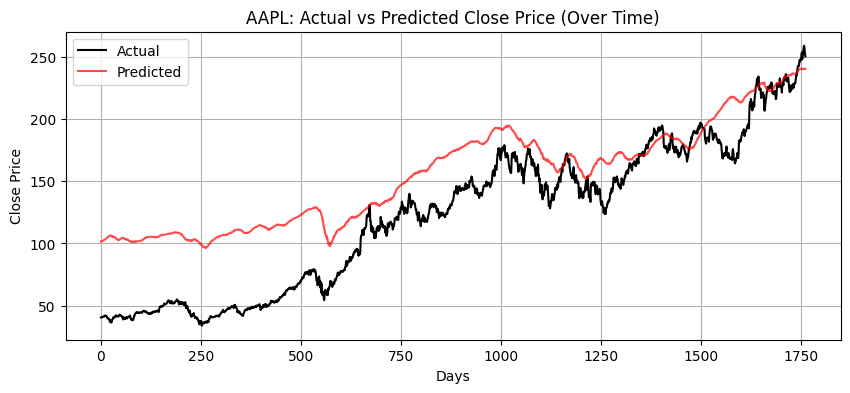

Extracted attention weights for AAPL for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


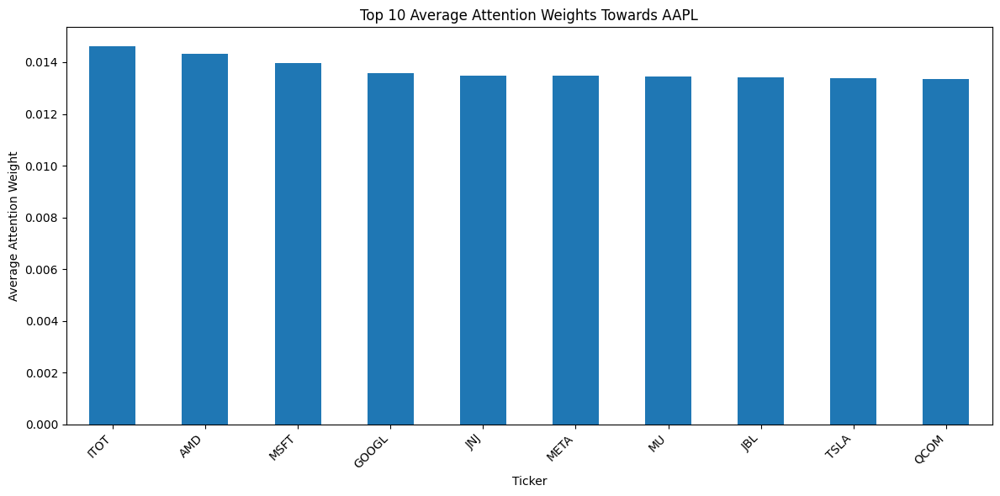

Top 10 tickers by average attention weight towards AAPL:
ITOT     0.014622
AMD      0.014311
MSFT     0.013979
GOOGL    0.013576
JNJ      0.013486
META     0.013466
MU       0.013437
JBL      0.013427
TSLA     0.013383
QCOM     0.013360
dtype: float32


In [6]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_aapl_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0052 | Test Loss: 0.0034
 New best model saved (Train Loss: 0.0034)
Epoch 02 | Train Loss: 0.0013 | Test Loss: 0.0035
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0009 | Test Loss: 0.0040
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0009 | Test Loss: 0.0059
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0008 | Test Loss: 0.0040
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0007 | Test Loss: 0.0055
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0034
JPM — RMSE: 16.1730 | MAE: 12.0117 | MAPE: 9.67% | R²: 0.8257


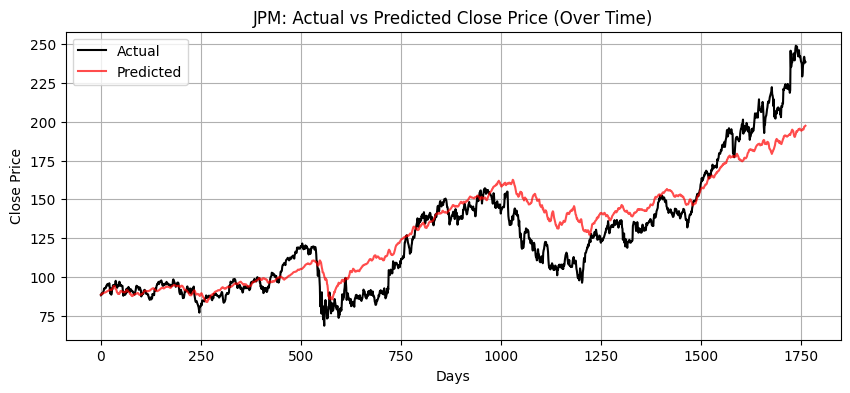

Extracted attention weights for JPM for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


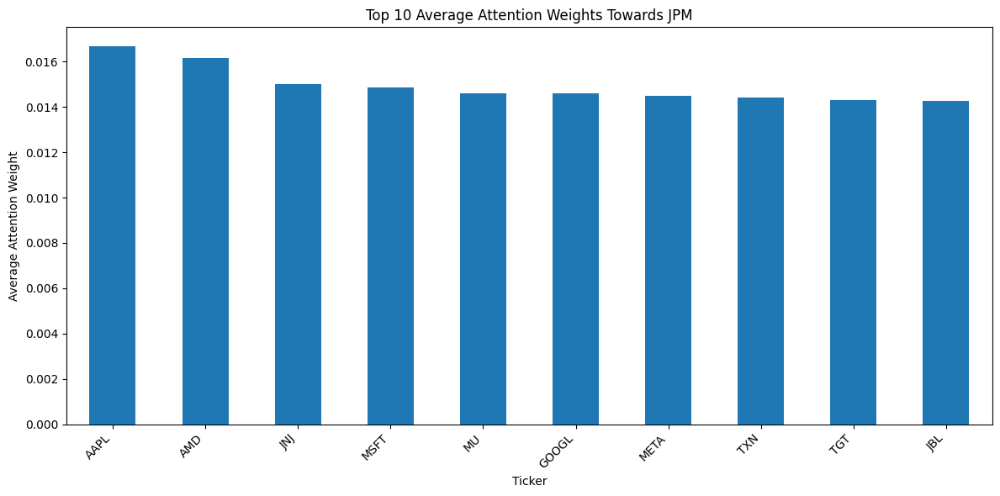

Top 10 tickers by average attention weight towards JPM:
AAPL     0.016683
AMD      0.016175
JNJ      0.015016
MSFT     0.014855
MU       0.014605
GOOGL    0.014598
META     0.014496
TXN      0.014427
TGT      0.014310
JBL      0.014271
dtype: float32


In [7]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_jpm_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0018 | Test Loss: 0.0459
 New best model saved (Train Loss: 0.0459)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0448
 New best model saved (Train Loss: 0.0448)
Epoch 03 | Train Loss: 0.0003 | Test Loss: 0.0453
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0492
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0003 | Test Loss: 0.0478
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0003 | Test Loss: 0.0493
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0003 | Test Loss: 0.0513
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0448
NVDA — RMSE: 31.6182 | MAE: 27.9897 | MAPE: 259.96% | R²: 0.2136


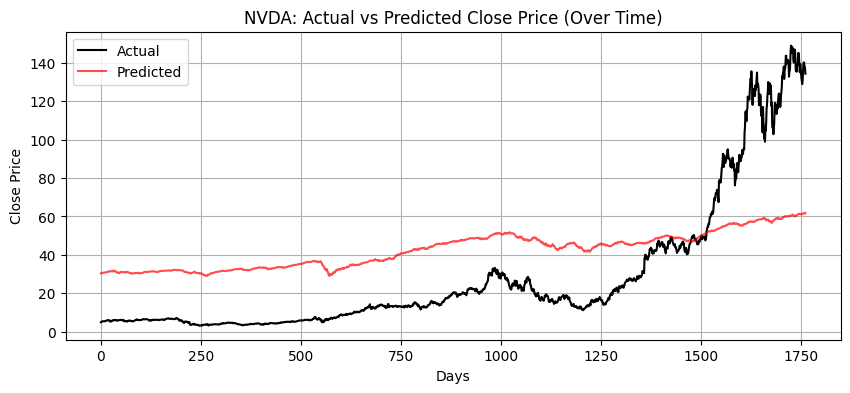

Extracted attention weights for NVDA for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


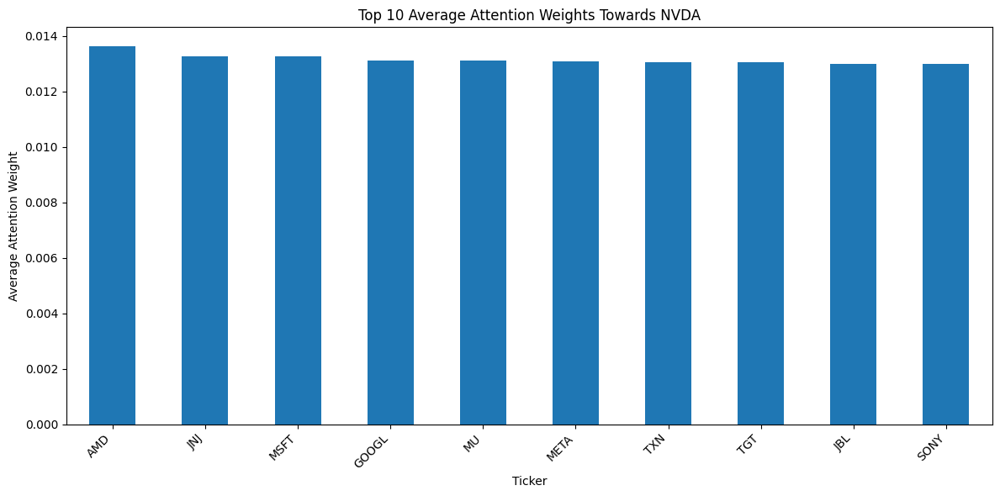

Top 10 tickers by average attention weight towards NVDA:
AMD      0.013639
JNJ      0.013278
MSFT     0.013267
GOOGL    0.013131
MU       0.013107
META     0.013076
TXN      0.013052
TGT      0.013045
JBL      0.013003
SONY     0.012997
dtype: float32


In [8]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_nvda_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0066 | Test Loss: 0.0012
 New best model saved (Train Loss: 0.0012)
Epoch 02 | Train Loss: 0.0016 | Test Loss: 0.0006
 New best model saved (Train Loss: 0.0006)
Epoch 03 | Train Loss: 0.0013 | Test Loss: 0.0024
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0011 | Test Loss: 0.0021
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0011 | Test Loss: 0.0023
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0011 | Test Loss: 0.0024
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0010 | Test Loss: 0.0033
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0006
SPY — RMSE: 14.7867 | MAE: 11.3114 | MAPE: 3.28% | R²: 0.9772


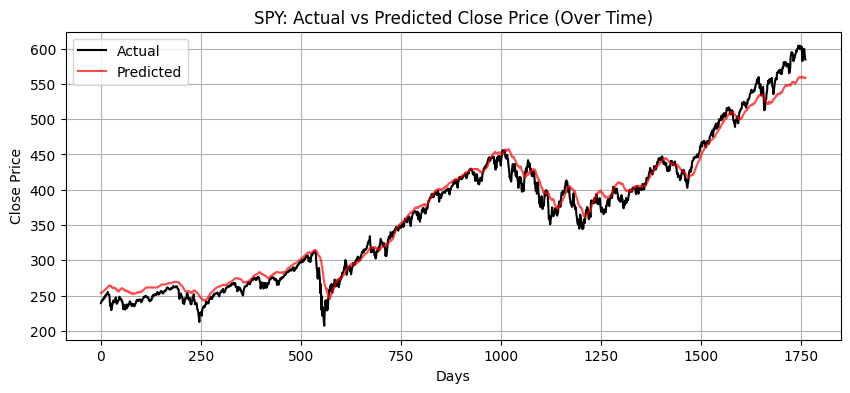

Extracted attention weights for SPY for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


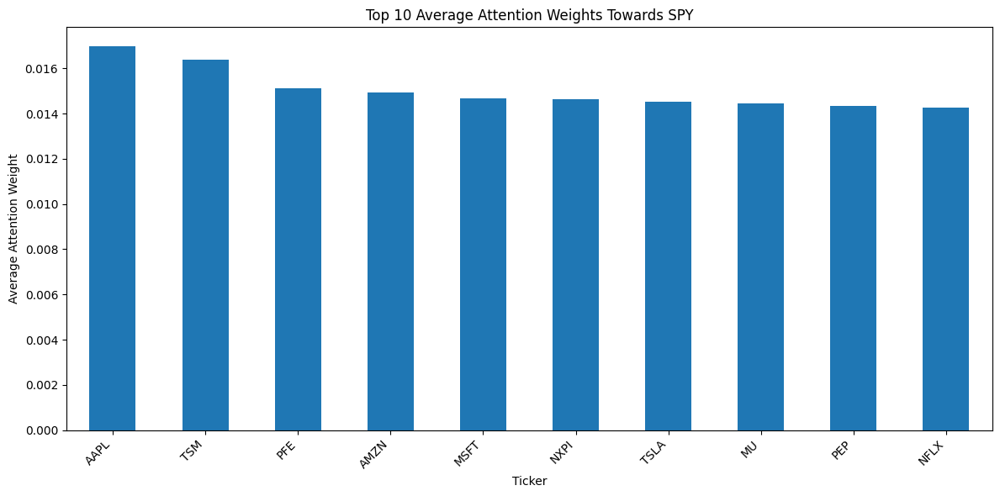

Top 10 tickers by average attention weight towards SPY:
AAPL    0.016973
TSM     0.016379
PFE     0.015109
AMZN    0.014918
MSFT    0.014669
NXPI    0.014639
TSLA    0.014535
MU      0.014452
PEP     0.014345
NFLX    0.014283
dtype: float32


In [9]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_spy_updown = gnn_updown

# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [11]:
gnn_predictions = np.concatenate((gnn_aapl_updown, gnn_jpm_updown, gnn_nvda_updown, gnn_spy_updown))

TFT:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 223 K  | train
------------------------------------------------------------
223 K     Trainable params
0         Non-trainable params
223 K     Total params
0.895     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 3.2734
  MAE : 2.4517
  R²  : 0.9836
  MAPE: 1.20%


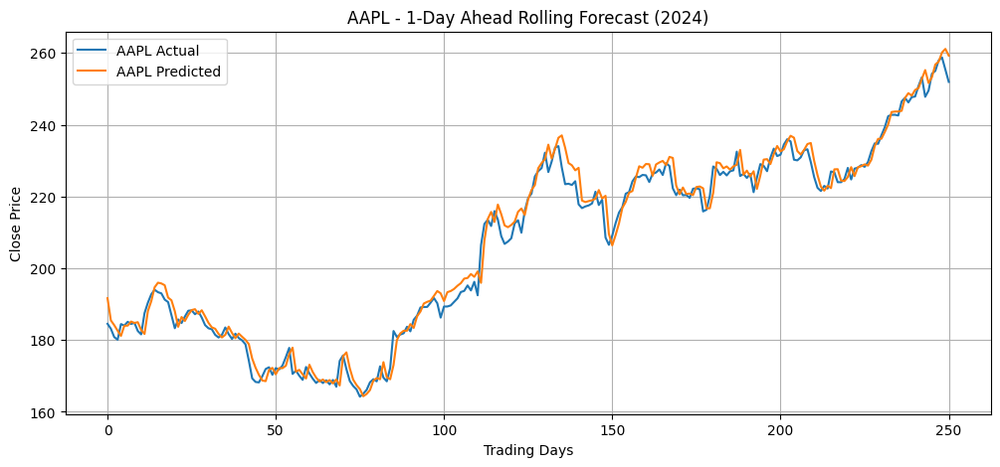


 JPM Evaluation:
  RMSE: 3.5230
  MAE : 2.3646
  R²  : 0.9747
  MAPE: 1.15%


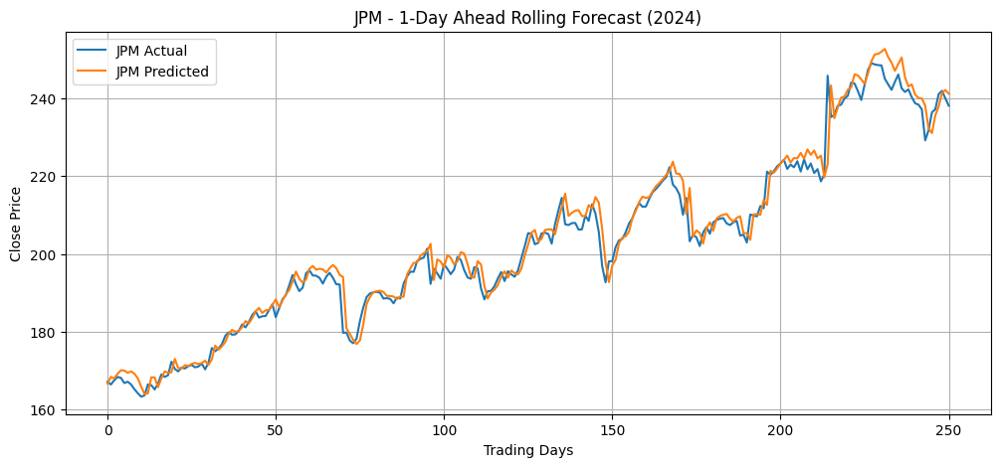


 NVDA Evaluation:
  RMSE: 3.9258
  MAE : 2.9800
  R²  : 0.9787
  MAPE: 2.78%


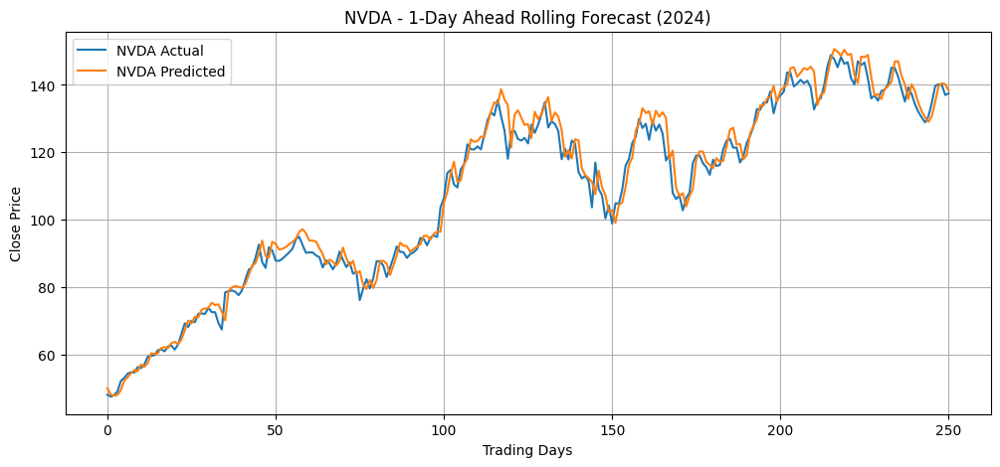


 SPY Evaluation:
  RMSE: 5.0453
  MAE : 3.8119
  R²  : 0.9825
  MAPE: 0.71%


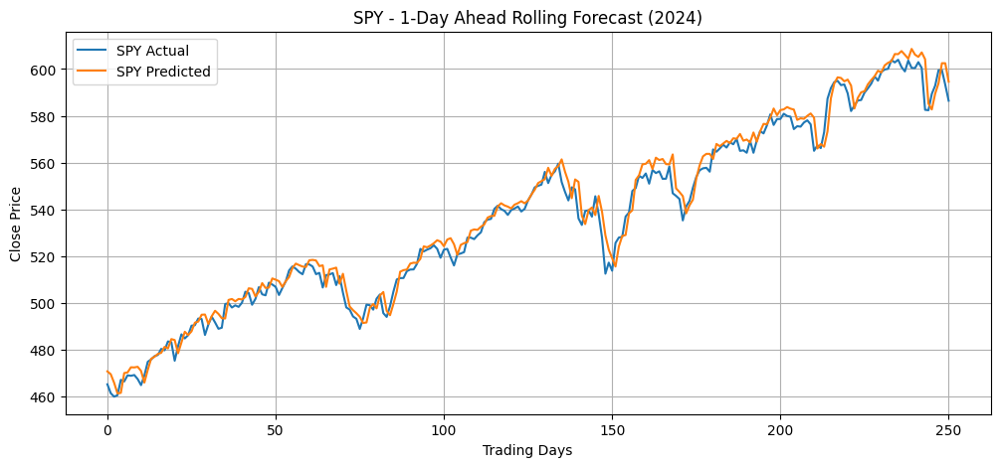

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

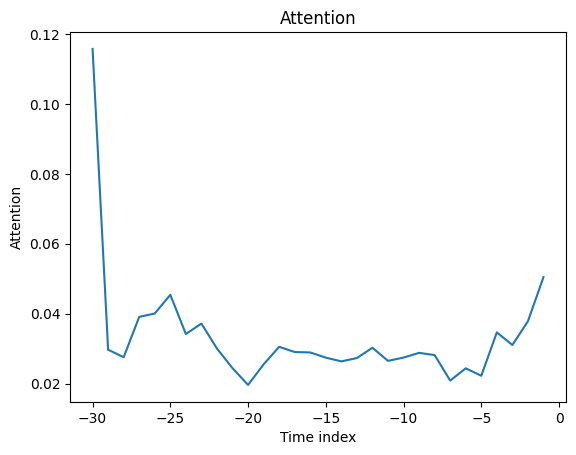

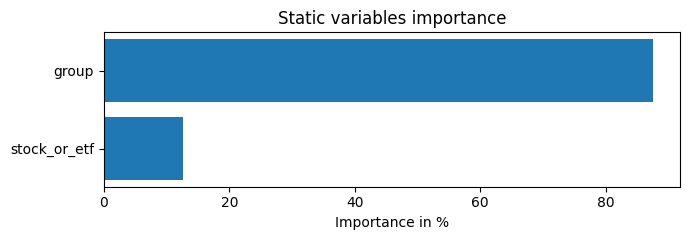

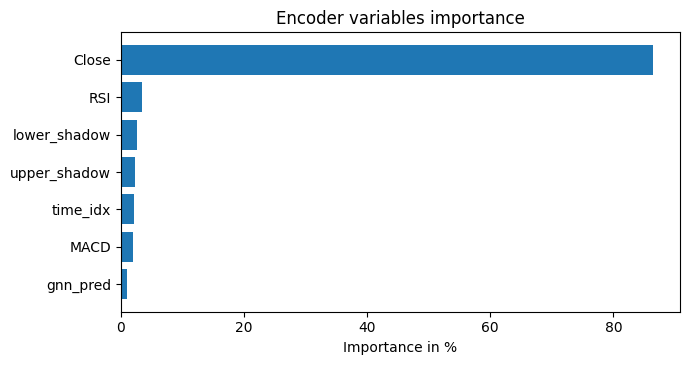

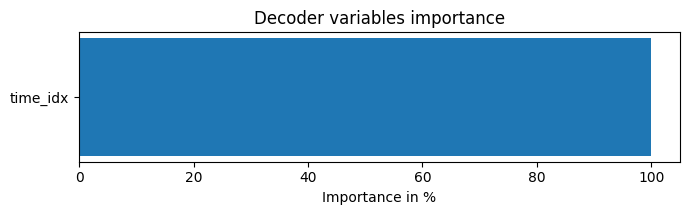

In [12]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 140 K  | train
------------------------------------------------------------
140 K     Trainable params
0         Non-trainable params
140 K     Total params
0.561     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 2.9966
  MAE : 2.1783
  R²  : 0.9862
  MAPE: 1.07%


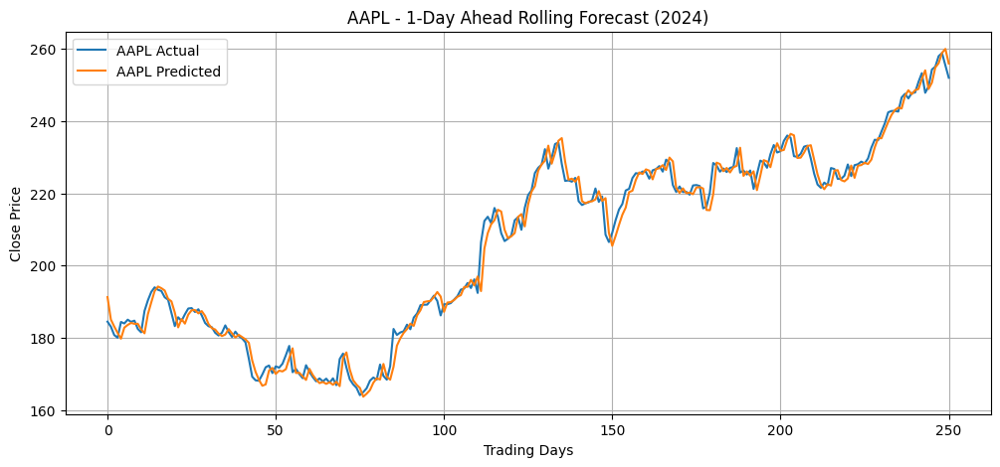


 JPM Evaluation:
  RMSE: 3.1340
  MAE : 2.0207
  R²  : 0.9800
  MAPE: 0.99%


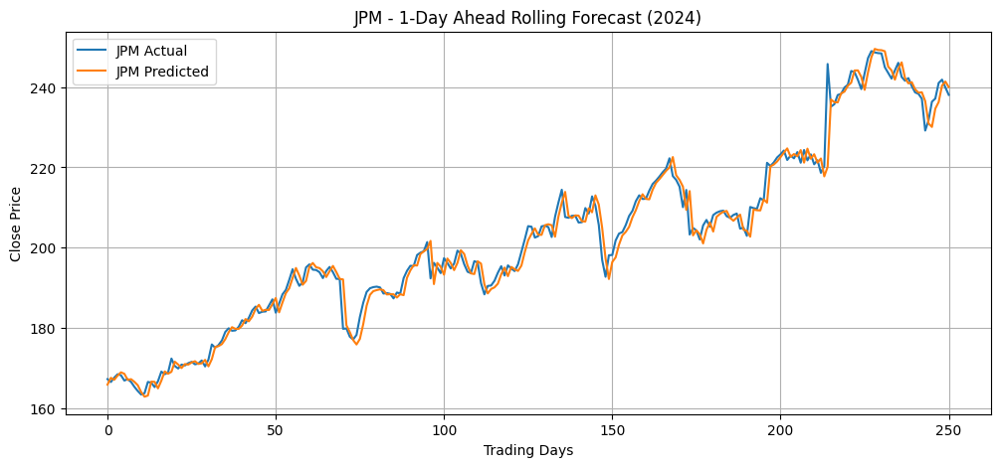


 NVDA Evaluation:
  RMSE: 3.5357
  MAE : 2.6770
  R²  : 0.9827
  MAPE: 2.51%


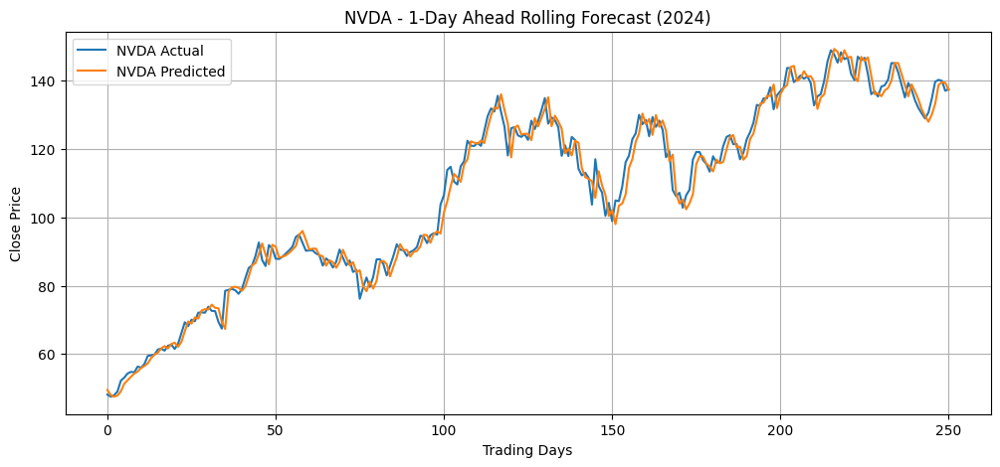


 SPY Evaluation:
  RMSE: 4.4188
  MAE : 3.2371
  R²  : 0.9865
  MAPE: 0.61%


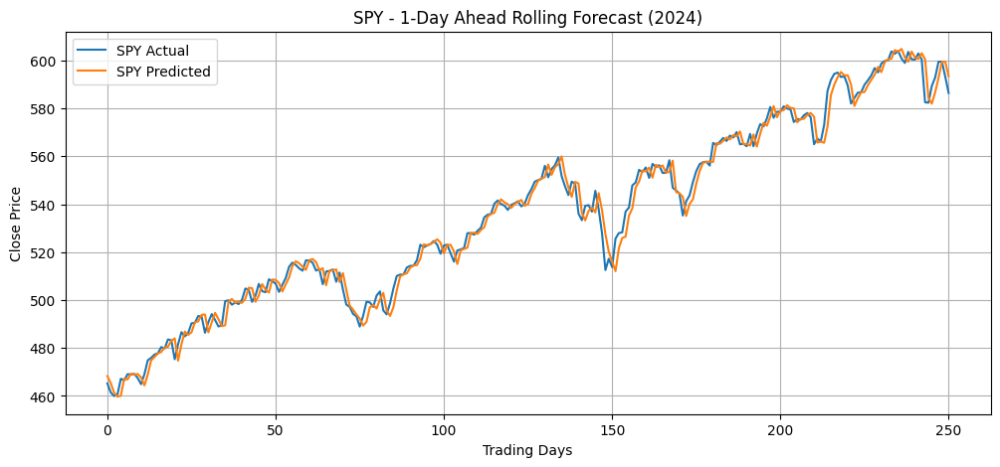

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

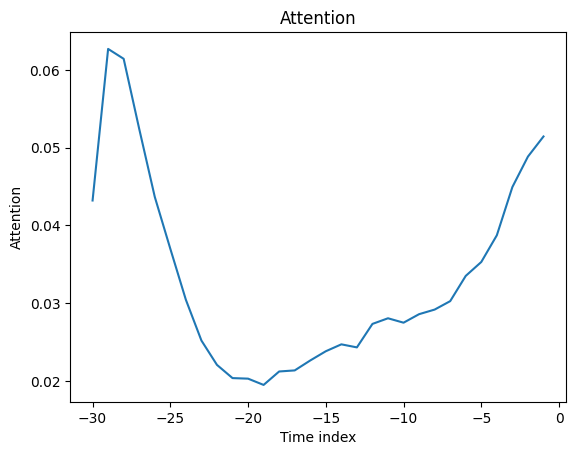

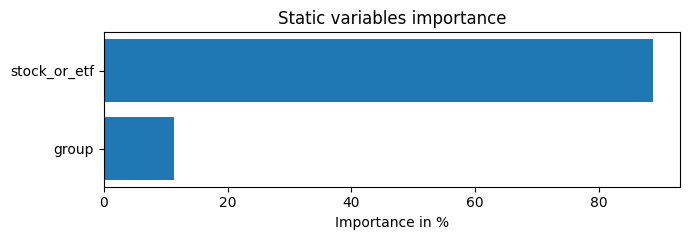

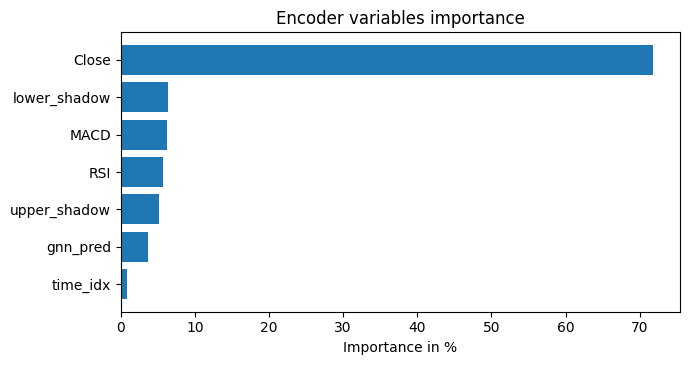

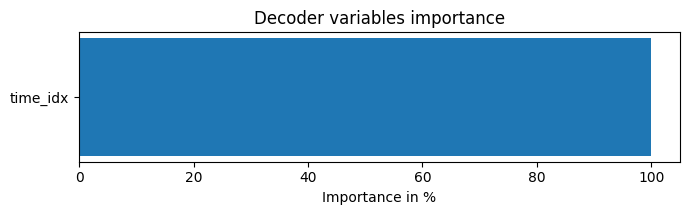

In [14]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.005,
    hidden_size=50,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 61.6 K | train
------------------------------------------------------------
61.6 K    Trainable params
0         Non-trainable params
61.6 K    Total params
0.246     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 2.9777
  MAE : 2.2251
  R²  : 0.9864
  MAPE: 1.09%


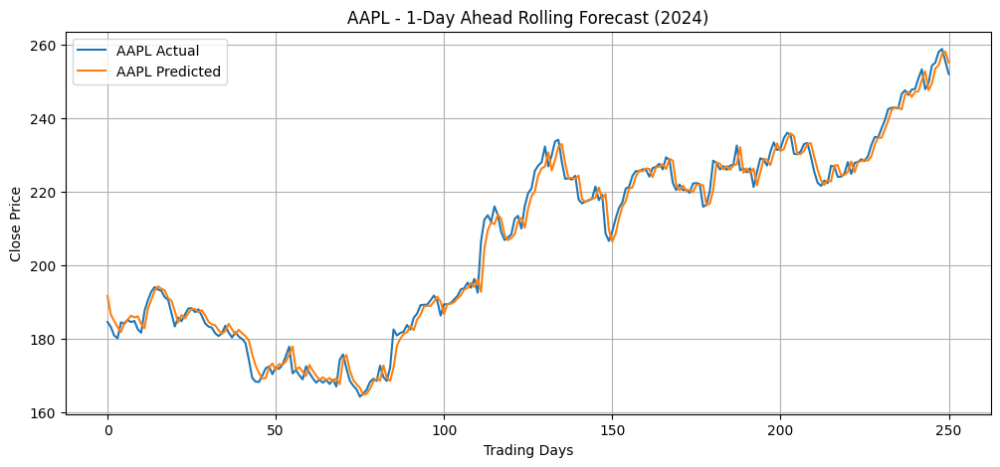


 JPM Evaluation:
  RMSE: 3.0700
  MAE : 1.9978
  R²  : 0.9808
  MAPE: 0.98%


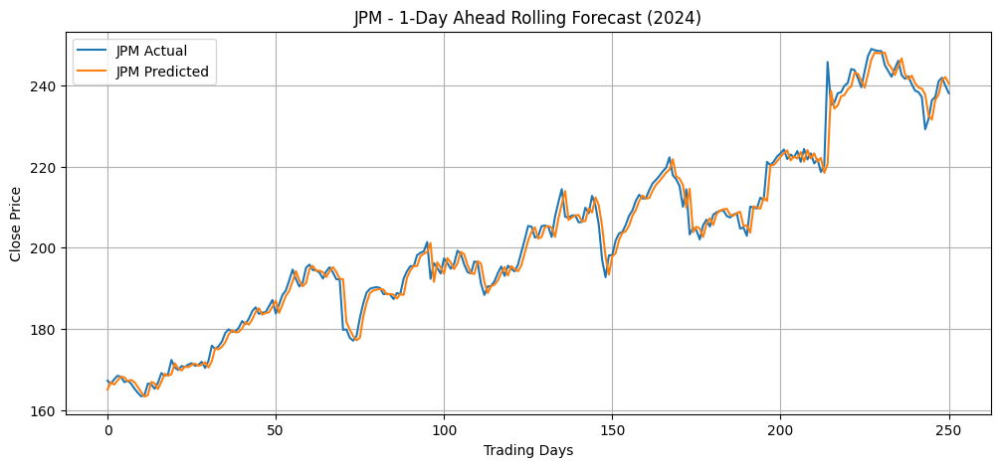


 NVDA Evaluation:
  RMSE: 3.4734
  MAE : 2.6319
  R²  : 0.9833
  MAPE: 2.48%


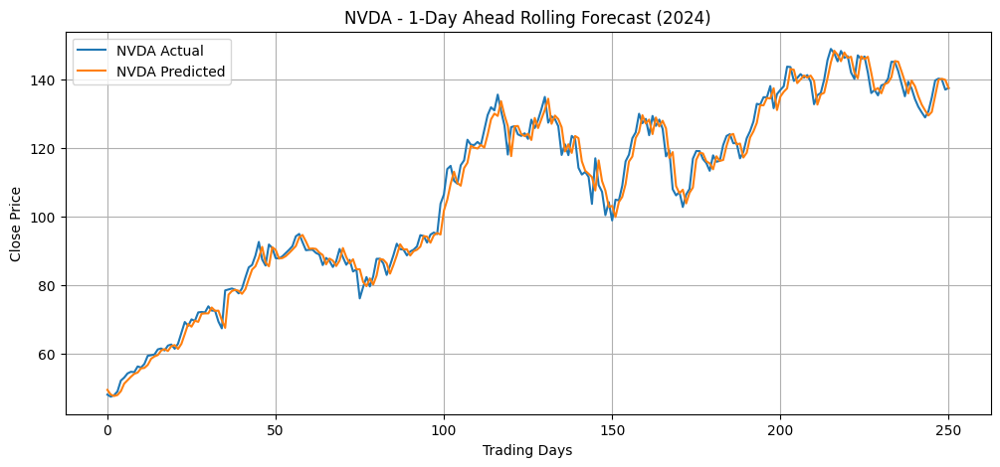


 SPY Evaluation:
  RMSE: 4.2989
  MAE : 3.1880
  R²  : 0.9873
  MAPE: 0.60%


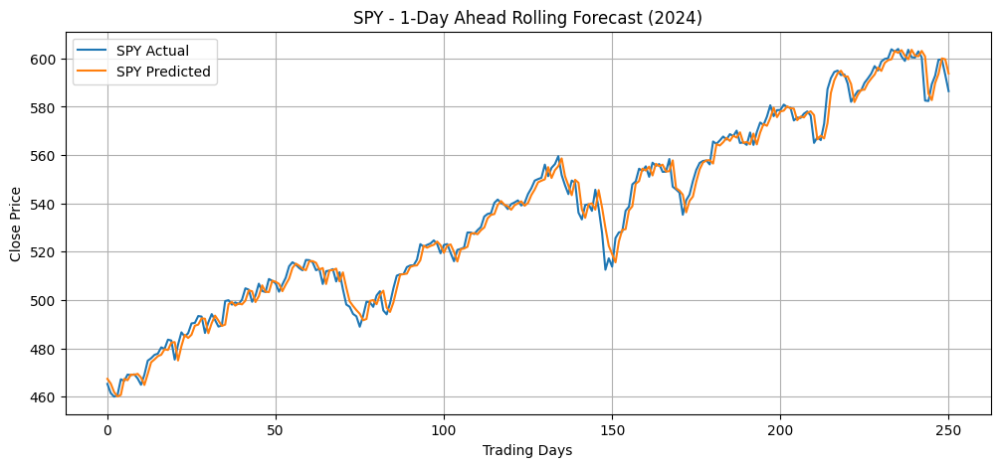

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

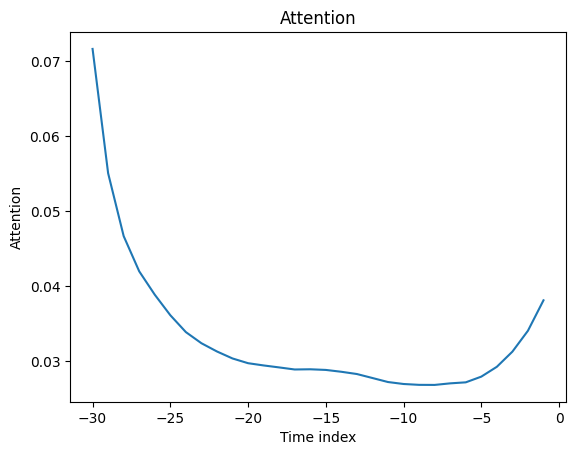

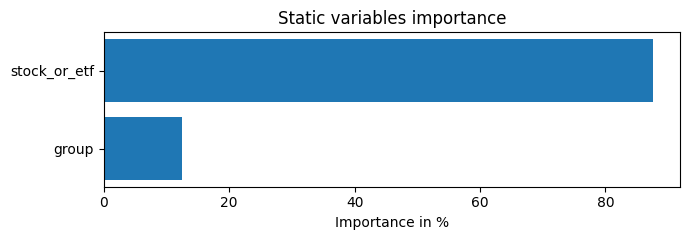

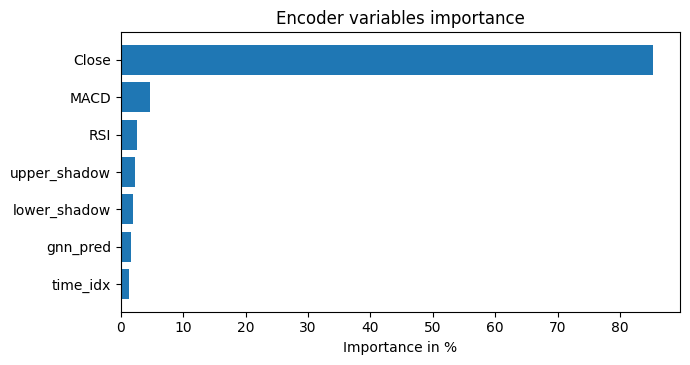

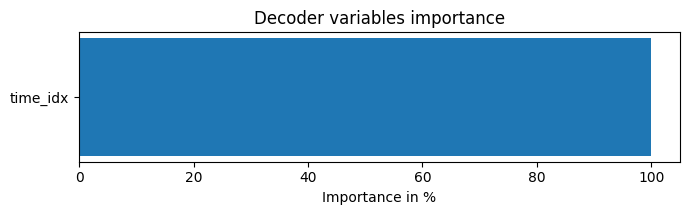

In [16]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=32,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# Same for 2021:

Load all graphs:

In [24]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

In [25]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd.pt')

In [26]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd.pt')

In [27]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_spy_21day_rsimacd.pt')

GNN predictions:

Epoch 01 | Train Loss: 0.0008 | Test Loss: 0.0266
 New best model saved (Train Loss: 0.0266)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0295
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0004 | Test Loss: 0.0299
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0334
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0004 | Test Loss: 0.0290
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.0293
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0266
AAPL — RMSE: 42.1659 | MAE: 38.9452 | MAPE: 108.25% | R²: -0.0996


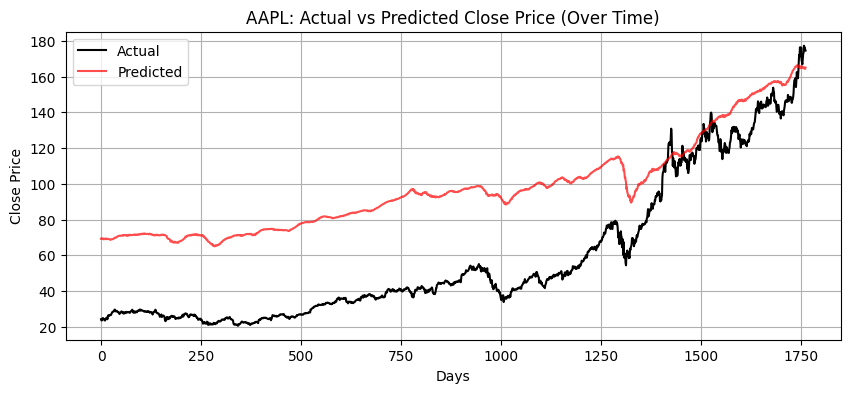

Extracted attention weights for AAPL for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


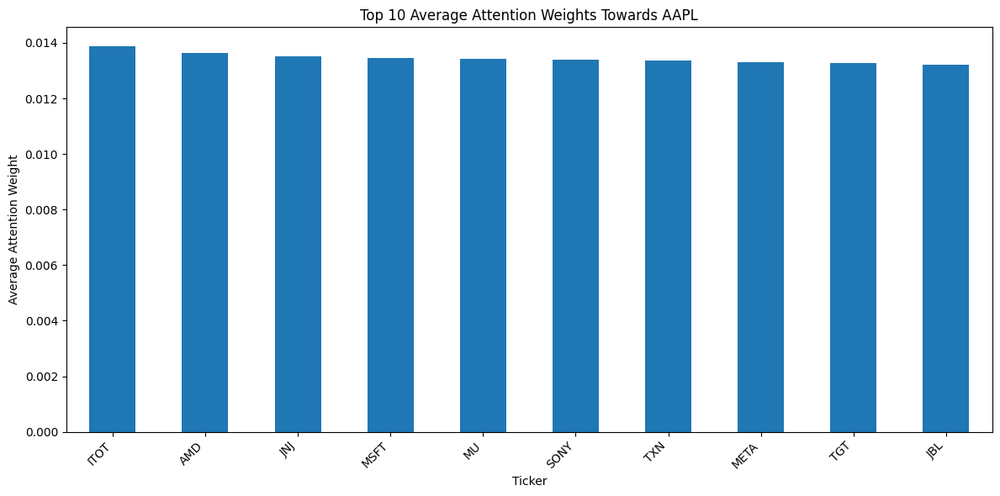

Top 10 tickers by average attention weight towards AAPL:
ITOT    0.013871
AMD     0.013622
JNJ     0.013510
MSFT    0.013470
MU      0.013431
SONY    0.013380
TXN     0.013379
META    0.013293
TGT     0.013278
JBL     0.013209
dtype: float32


In [28]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_aapl_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0011 | Test Loss: 0.0022
 New best model saved (Train Loss: 0.0022)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0020
 New best model saved (Train Loss: 0.0020)
Epoch 03 | Train Loss: 0.0004 | Test Loss: 0.0026
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0029
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0003 | Test Loss: 0.0035
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0003 | Test Loss: 0.0041
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0003 | Test Loss: 0.0048
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0020
JPM — RMSE: 12.6167 | MAE: 10.6873 | MAPE: 15.25% | R²: 0.8254


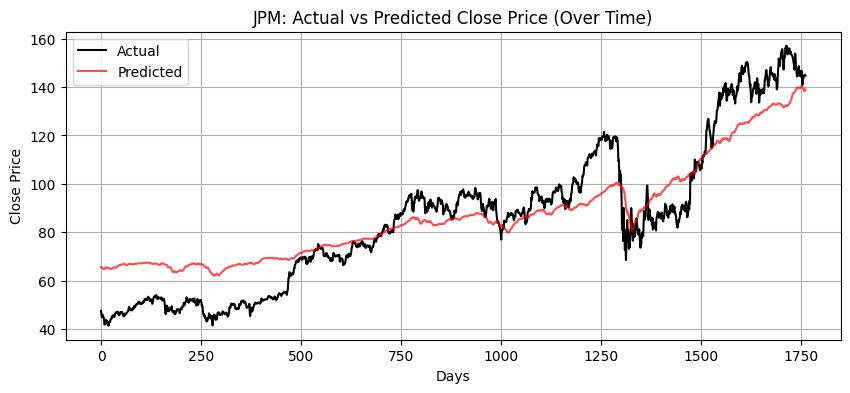

Extracted attention weights for JPM for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


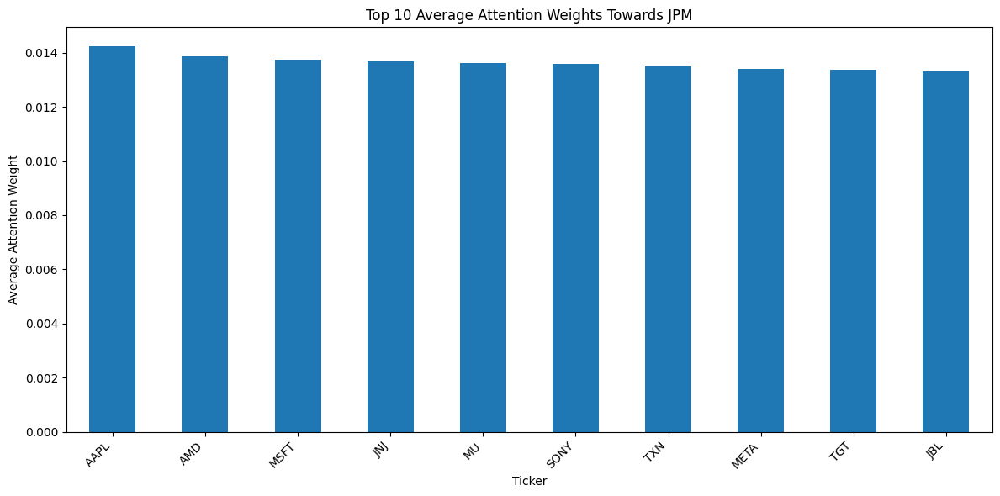

Top 10 tickers by average attention weight towards JPM:
AAPL    0.014232
AMD     0.013867
MSFT    0.013730
JNJ     0.013682
MU      0.013626
SONY    0.013589
TXN     0.013508
META    0.013401
TGT     0.013383
JBL     0.013301
dtype: float32


In [29]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_jpm_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0005 | Test Loss: 0.0008
 New best model saved (Train Loss: 0.0008)
Epoch 02 | Train Loss: 0.0000 | Test Loss: 0.0006
 New best model saved (Train Loss: 0.0006)
Epoch 03 | Train Loss: 0.0000 | Test Loss: 0.0008
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0000 | Test Loss: 0.0009
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0000 | Test Loss: 0.0013
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0000 | Test Loss: 0.0019
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0000 | Test Loss: 0.0019
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0006
NVDA — RMSE: 3.6820 | MAE: 2.8869 | MAPE: 148.38% | R²: 0.6838


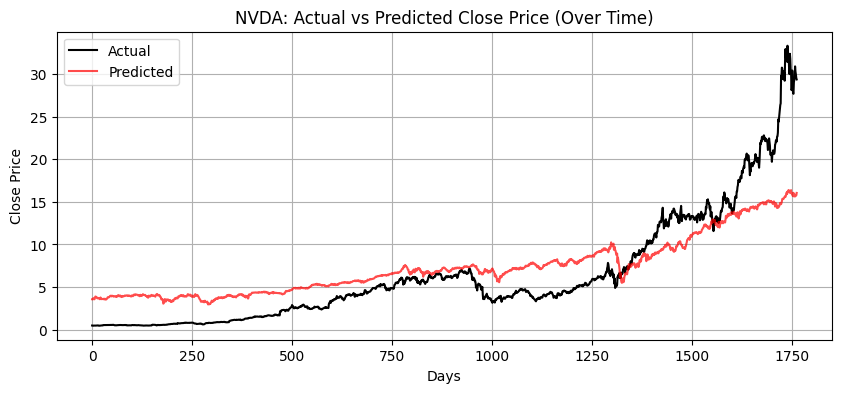

Extracted attention weights for NVDA for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


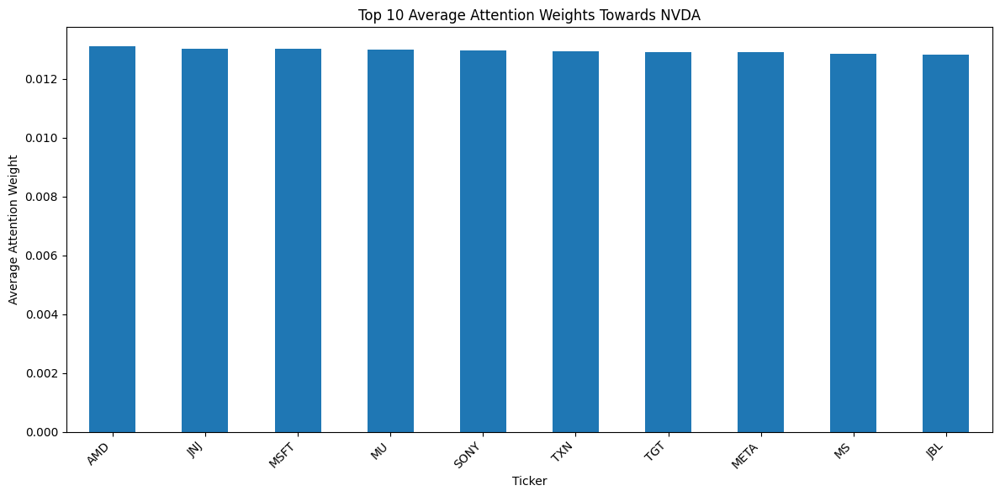

Top 10 tickers by average attention weight towards NVDA:
AMD     0.013101
JNJ     0.013034
MSFT    0.013022
MU      0.012985
SONY    0.012955
TXN     0.012942
TGT     0.012901
META    0.012900
MS      0.012839
JBL     0.012837
dtype: float32


In [30]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_nvda_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0022 | Test Loss: 0.0006
 New best model saved (Train Loss: 0.0006)
Epoch 02 | Train Loss: 0.0007 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0005)
Epoch 03 | Train Loss: 0.0005 | Test Loss: 0.0009
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0005 | Test Loss: 0.0020
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0005 | Test Loss: 0.0033
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.0028
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0004 | Test Loss: 0.0041
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0005
SPY — RMSE: 13.6866 | MAE: 11.6067 | MAPE: 5.07% | R²: 0.9674


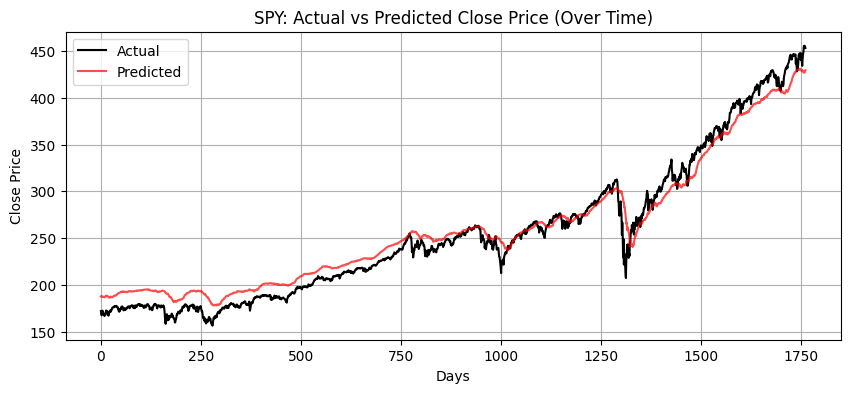

Extracted attention weights for SPY for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


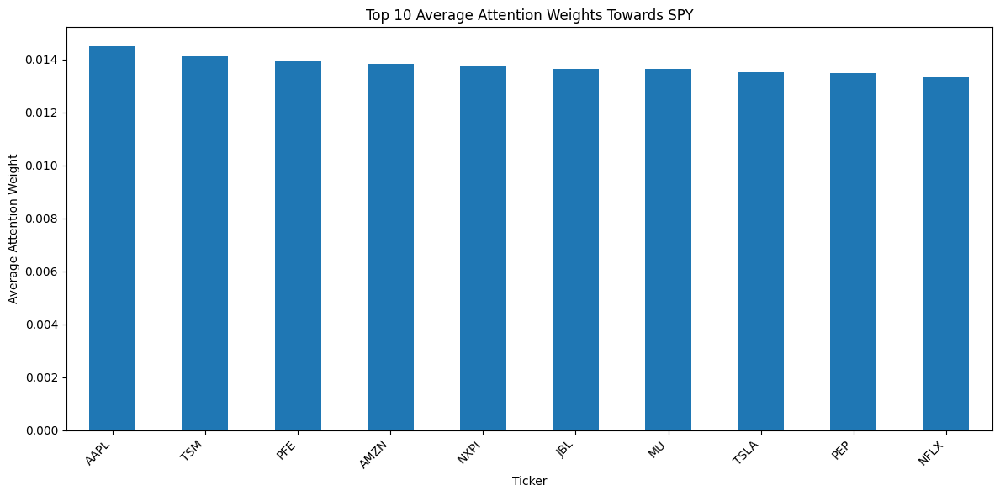

Top 10 tickers by average attention weight towards SPY:
AAPL    0.014495
TSM     0.014112
PFE     0.013916
AMZN    0.013818
NXPI    0.013759
JBL     0.013657
MU      0.013656
TSLA    0.013503
PEP     0.013498
NFLX    0.013330
dtype: float32


In [31]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_spy_updown = gnn_updown

# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [32]:
gnn_predictions = np.concatenate((gnn_aapl_updown, gnn_jpm_updown, gnn_nvda_updown, gnn_spy_updown))

TFT:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 140 K  | train
------------------------------------------------------------
140 K     Trainable params
0         Non-trainable params
140 K     Total params
0.561     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 2.2331
  MAE : 1.6999
  R²  : 0.9758
  MAPE: 1.23%


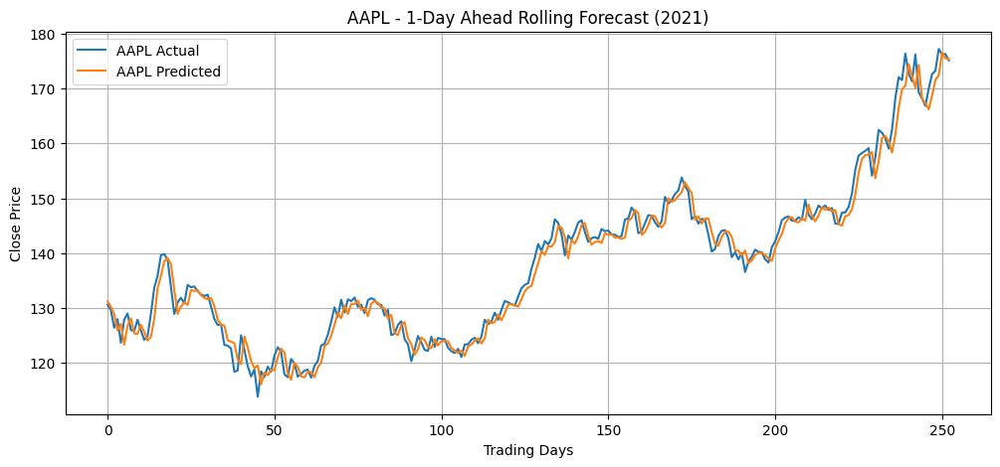


 JPM Evaluation:
  RMSE: 1.9872
  MAE : 1.5595
  R²  : 0.9574
  MAPE: 1.12%


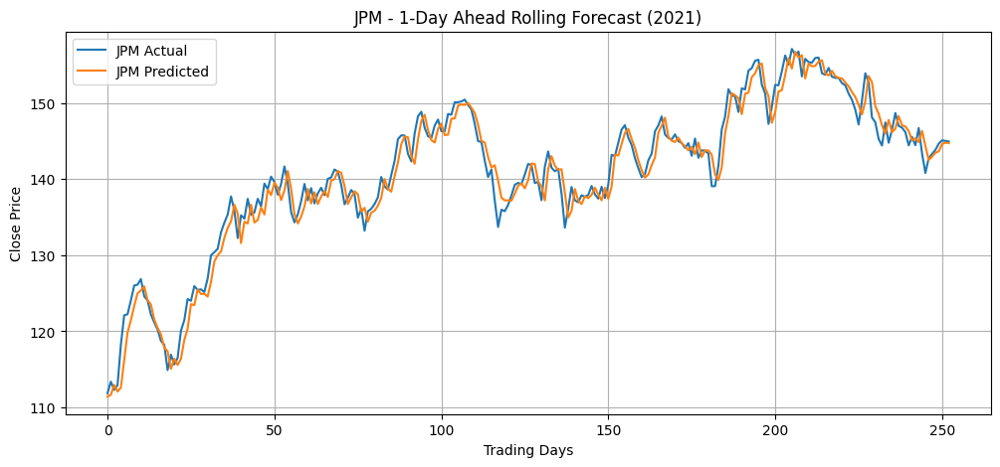


 NVDA Evaluation:
  RMSE: 0.6375
  MAE : 0.4333
  R²  : 0.9881
  MAPE: 2.14%


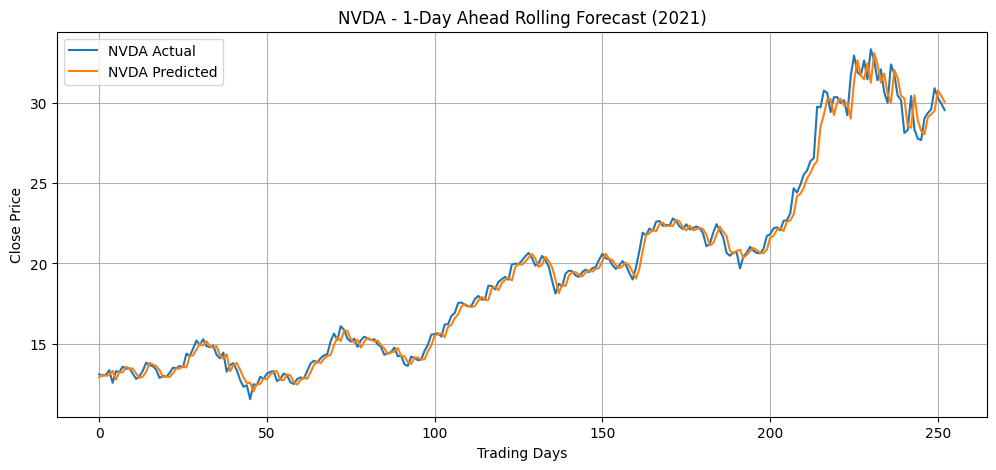


 SPY Evaluation:
  RMSE: 3.3212
  MAE : 2.6143
  R²  : 0.9866
  MAPE: 0.65%


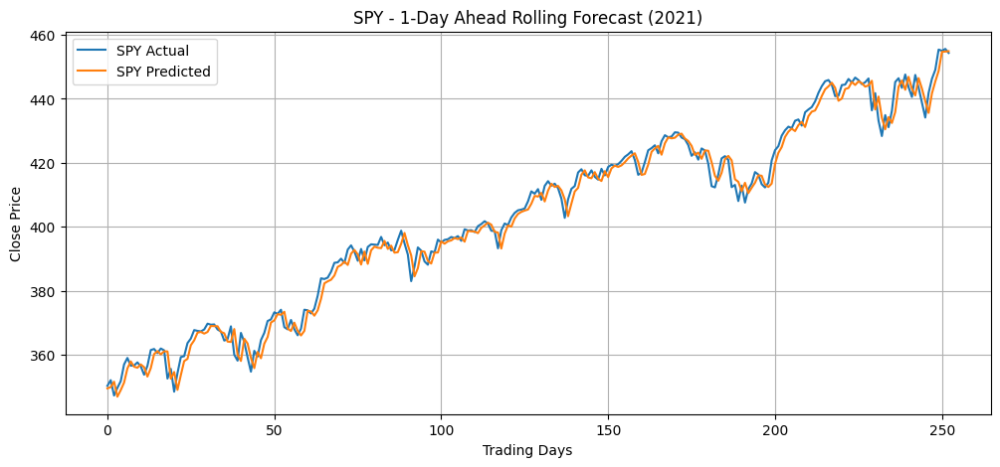

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

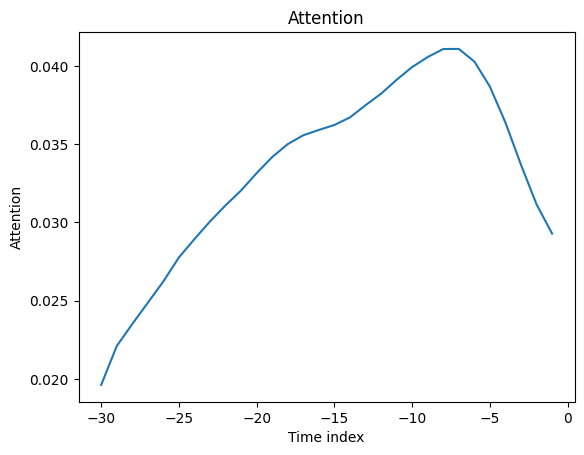

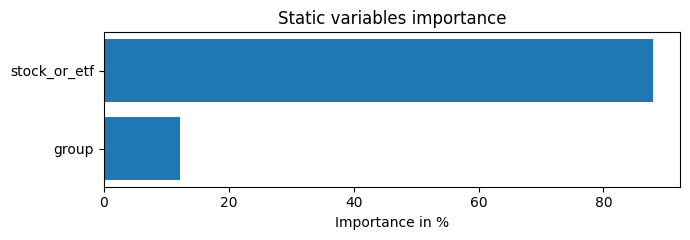

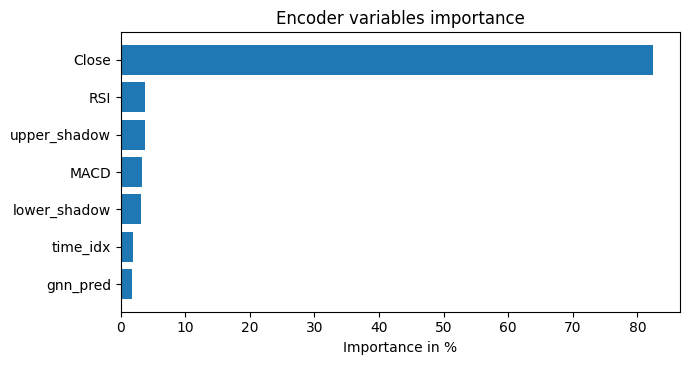

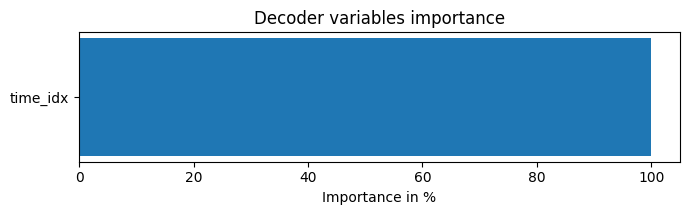

In [36]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2015-01-01') & (df['Date'] <= '2021-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2021-01-01"].copy()
test_df = df[df['Date'] >= "2020-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=50,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=30,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2021)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# 2018:

Load all graphs:

In [48]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2012-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

In [49]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2012-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd.pt')

In [50]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2012-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd.pt')

In [51]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2012-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2018-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_spy_21day_rsimacd.pt')

GNN predictions:

Epoch 01 | Train Loss: 0.0004 | Test Loss: 0.0007
 New best model saved (Train Loss: 0.0007)
Epoch 02 | Train Loss: 0.0001 | Test Loss: 0.0005
 New best model saved (Train Loss: 0.0005)
Epoch 03 | Train Loss: 0.0000 | Test Loss: 0.0006
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0000 | Test Loss: 0.0008
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0000 | Test Loss: 0.0013
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0000 | Test Loss: 0.0012
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0000 | Test Loss: 0.0011
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0005
AAPL — RMSE: 5.8644 | MAE: 4.8874 | MAPE: 24.08% | R²: 0.6734


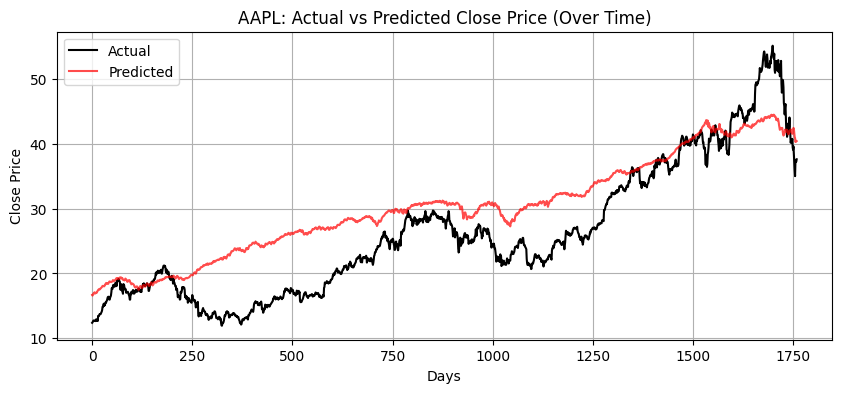

Extracted attention weights for AAPL for 1760 time steps.
Shape of attention weights for one time step: torch.Size([78, 4])


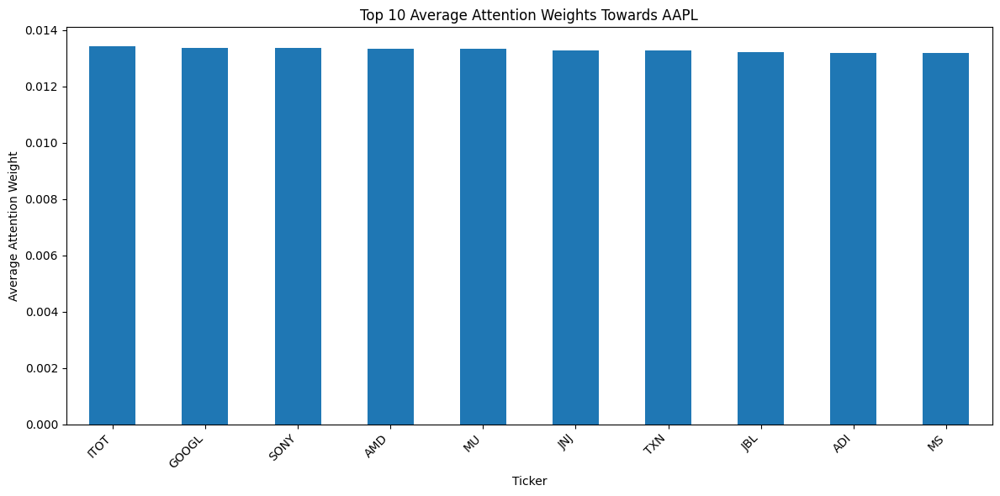

Top 10 tickers by average attention weight towards AAPL:
ITOT     0.013426
GOOGL    0.013374
SONY     0.013368
AMD      0.013332
MU       0.013329
JNJ      0.013267
TXN      0.013257
JBL      0.013209
ADI      0.013194
MS       0.013186
dtype: float32


In [52]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_aapl_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0003 | Test Loss: 0.0026
 New best model saved (Train Loss: 0.0026)
Epoch 02 | Train Loss: 0.0001 | Test Loss: 0.0023
 New best model saved (Train Loss: 0.0023)
Epoch 03 | Train Loss: 0.0001 | Test Loss: 0.0034
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0001 | Test Loss: 0.0032
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0001 | Test Loss: 0.0032
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0001 | Test Loss: 0.0041
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0001 | Test Loss: 0.0038
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0023
JPM — RMSE: 13.4355 | MAE: 12.2031 | MAPE: 29.53% | R²: 0.5835


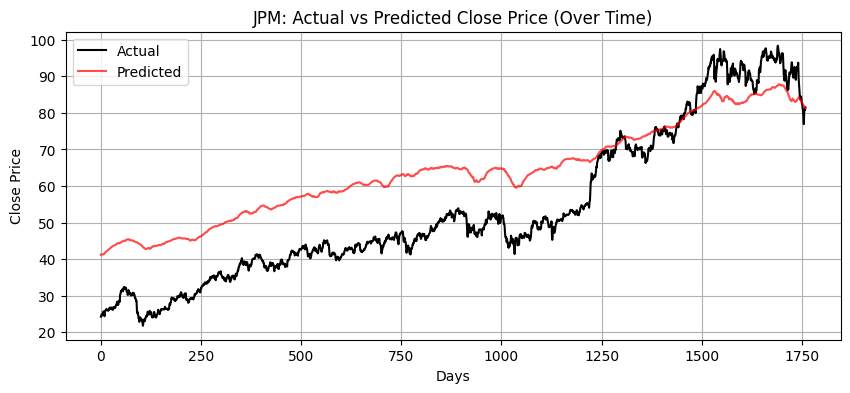

Extracted attention weights for JPM for 1760 time steps.
Shape of attention weights for one time step: torch.Size([78, 4])


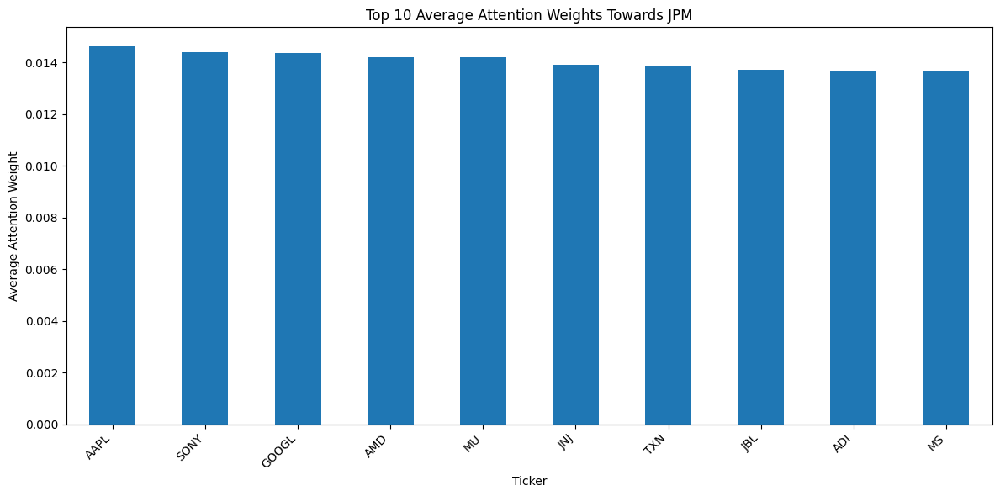

Top 10 tickers by average attention weight towards JPM:
AAPL     0.014633
SONY     0.014405
GOOGL    0.014376
AMD      0.014217
MU       0.014204
JNJ      0.013928
TXN      0.013891
JBL      0.013724
ADI      0.013683
MS       0.013664
dtype: float32


In [53]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_jpm_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0004 | Test Loss: 0.0016
 New best model saved (Train Loss: 0.0016)
Epoch 02 | Train Loss: 0.0000 | Test Loss: 0.0010
 New best model saved (Train Loss: 0.0010)
Epoch 03 | Train Loss: 0.0000 | Test Loss: 0.0006
 New best model saved (Train Loss: 0.0006)
Epoch 04 | Train Loss: 0.0000 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0004)
Epoch 05 | Train Loss: 0.0000 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0004)
Epoch 06 | Train Loss: 0.0000 | Test Loss: 0.0004
 New best model saved (Train Loss: 0.0004)
Epoch 07 | Train Loss: 0.0000 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0003)
Epoch 08 | Train Loss: 0.0000 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0003)
Epoch 09 | Train Loss: 0.0000 | Test Loss: 0.0003
 No improvement for 1 epoch(s)
Epoch 10 | Train Loss: 0.0000 | Test Loss: 0.0003
 New best model saved (Train Loss: 0.0003)
Epoch 11 | Train Loss: 0.0000 | Test Loss: 0.0003
 No improvement for 1 epoch(s)
E

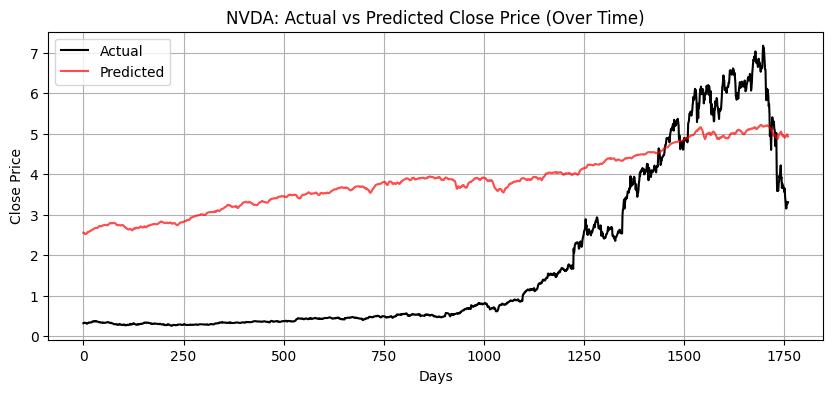

Extracted attention weights for NVDA for 1760 time steps.
Shape of attention weights for one time step: torch.Size([78, 4])


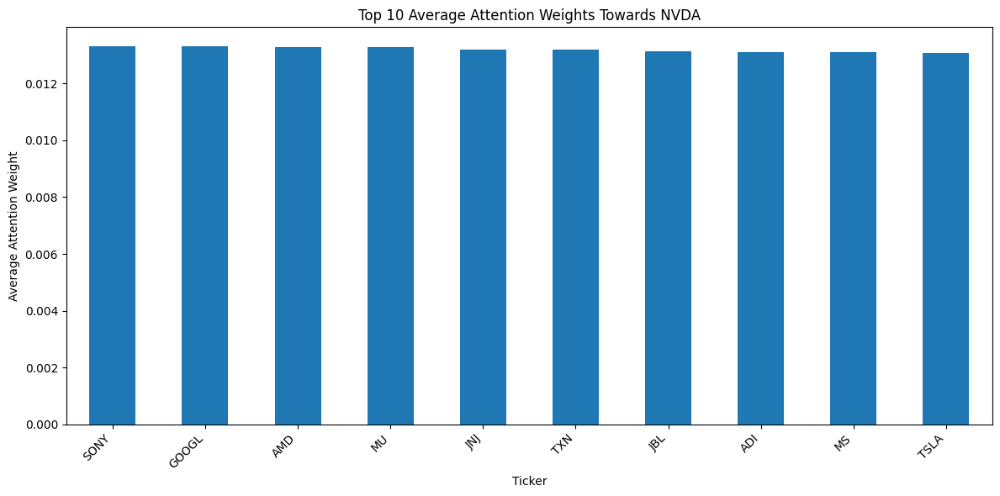

Top 10 tickers by average attention weight towards NVDA:
SONY     0.013314
GOOGL    0.013312
AMD      0.013278
MU       0.013275
JNJ      0.013198
TXN      0.013185
JBL      0.013125
ADI      0.013111
MS       0.013104
TSLA     0.013084
dtype: float32


In [54]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_nvda_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0004 | Test Loss: 0.0015
 New best model saved (Train Loss: 0.0015)
Epoch 02 | Train Loss: 0.0001 | Test Loss: 0.0020
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0001 | Test Loss: 0.0022
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0001 | Test Loss: 0.0024
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0001 | Test Loss: 0.0032
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0001 | Test Loss: 0.0024
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0015
SPY — RMSE: 22.6306 | MAE: 19.1695 | MAPE: 13.54% | R²: 0.7311


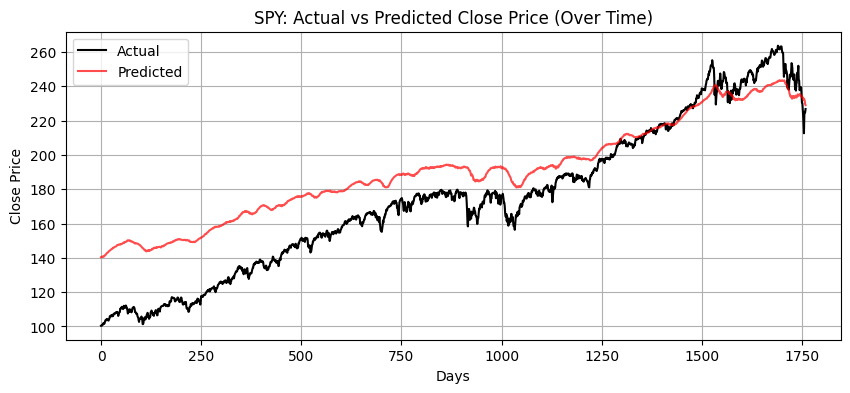

Extracted attention weights for SPY for 1760 time steps.
Shape of attention weights for one time step: torch.Size([78, 4])


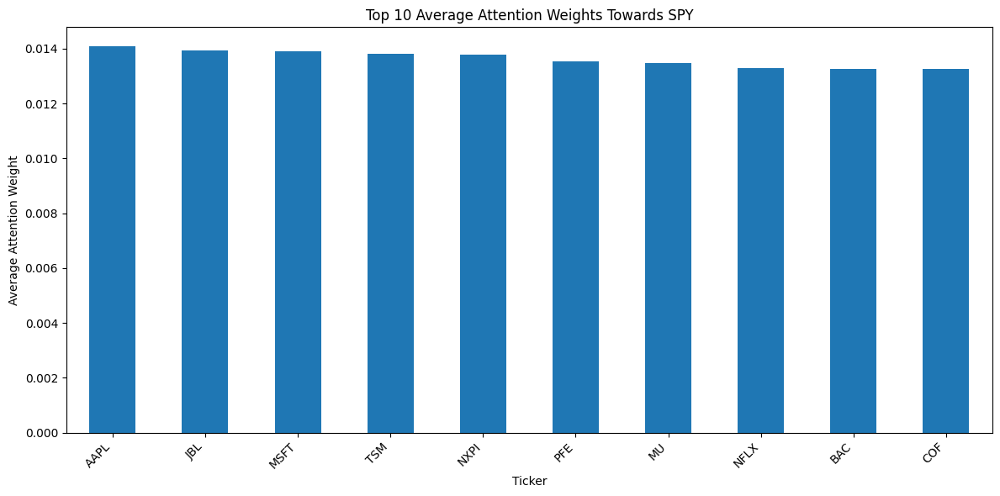

Top 10 tickers by average attention weight towards SPY:
AAPL    0.014082
JBL     0.013923
MSFT    0.013919
TSM     0.013802
NXPI    0.013792
PFE     0.013535
MU      0.013493
NFLX    0.013306
BAC     0.013265
COF     0.013263
dtype: float32


In [55]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_spy_updown = gnn_updown

# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [56]:
gnn_predictions = np.concatenate((gnn_aapl_updown, gnn_jpm_updown, gnn_nvda_updown, gnn_spy_updown))
len(gnn_predictions)

7040

TFT:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 61.6 K | train
------------------------------------------------------------
61.6 K    Trainable params
0         Non-trainable params
61.6 K    Total params
0.246     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.



 AAPL Evaluation:
  RMSE: 0.8759
  MAE : 0.6321
  R²  : 0.9688
  MAPE: 1.43%


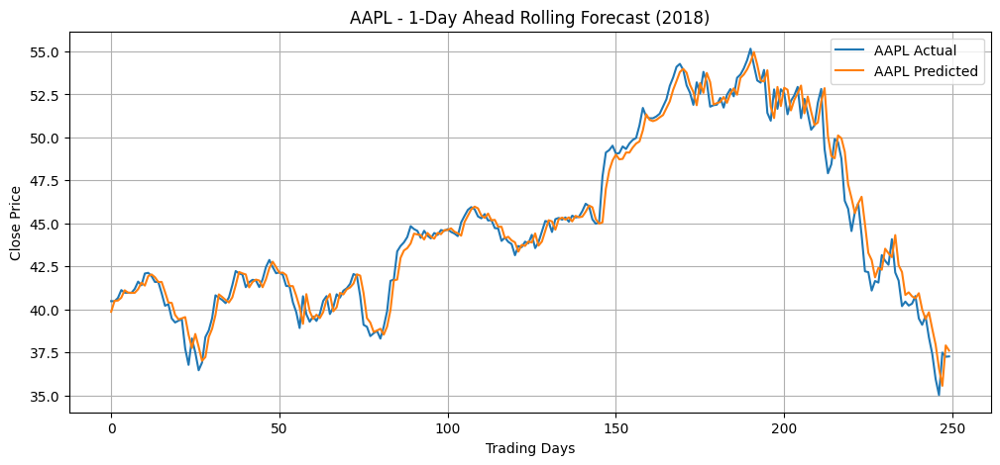


 JPM Evaluation:
  RMSE: 1.2952
  MAE : 0.9979
  R²  : 0.8836
  MAPE: 1.10%


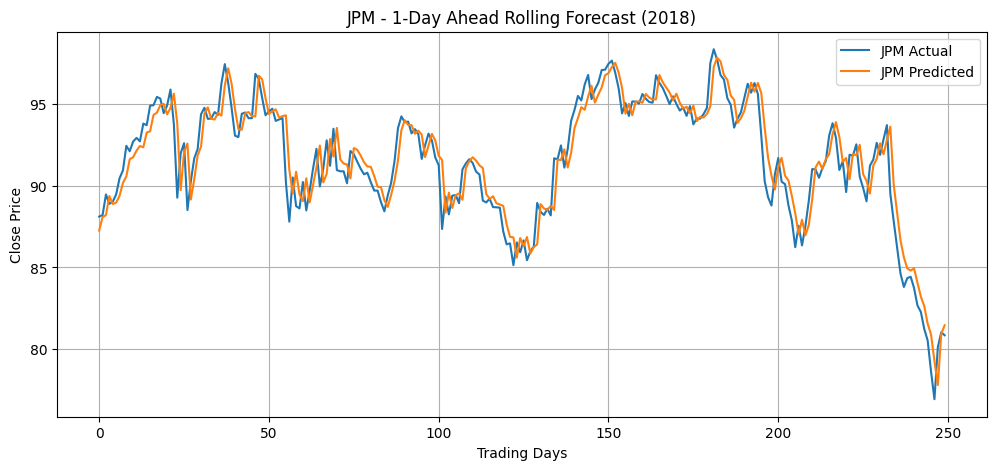


 NVDA Evaluation:
  RMSE: 0.1743
  MAE : 0.1236
  R²  : 0.9616
  MAPE: 2.32%


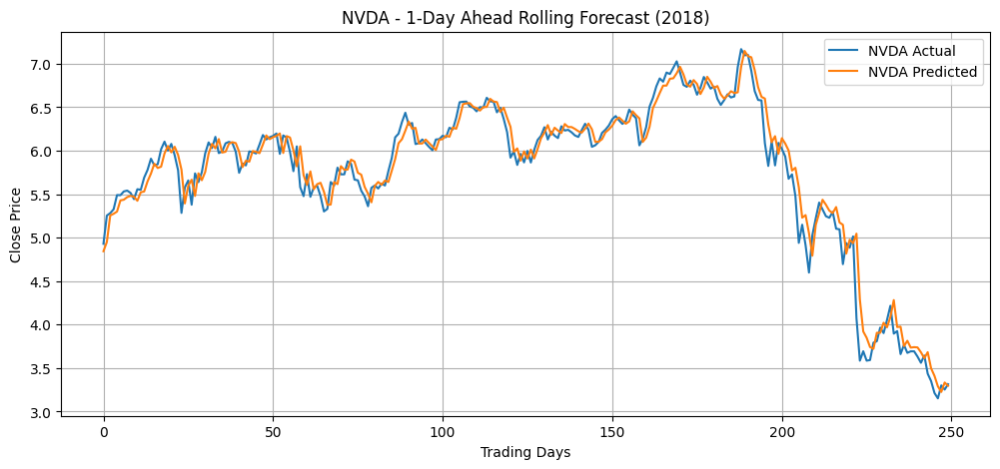


 SPY Evaluation:
  RMSE: 2.6542
  MAE : 1.8550
  R²  : 0.9137
  MAPE: 0.77%


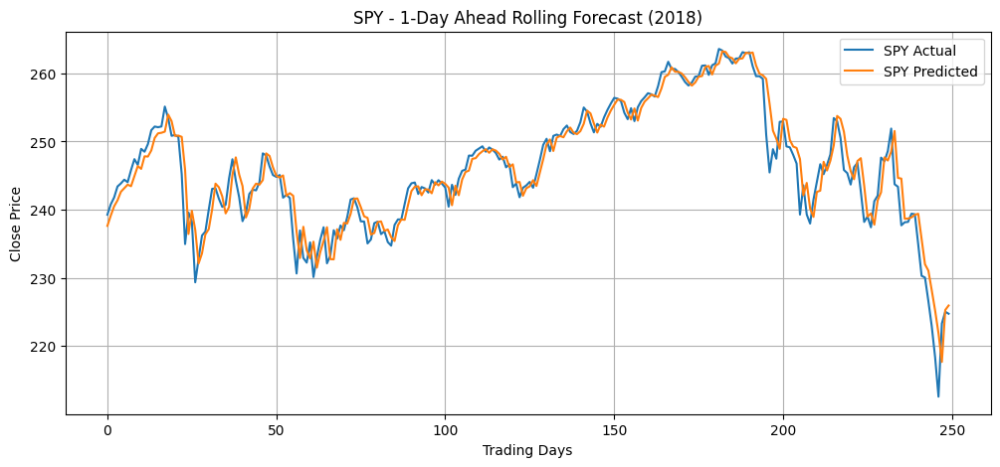

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

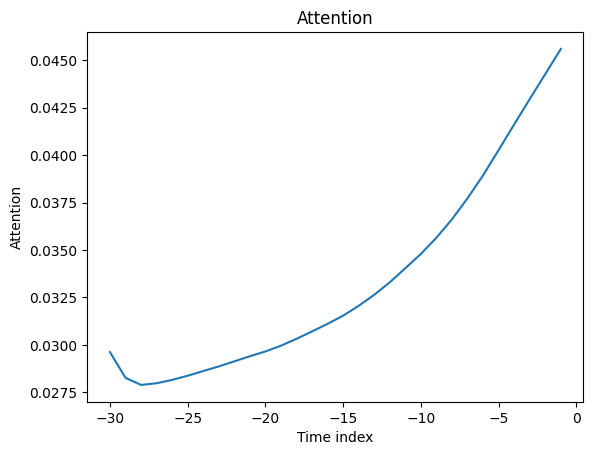

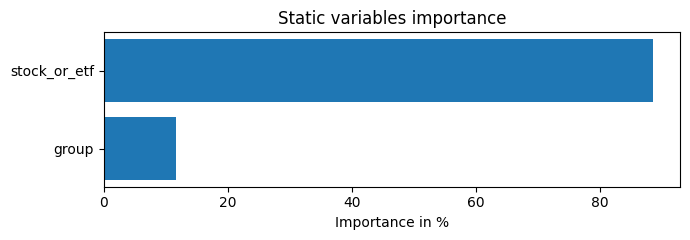

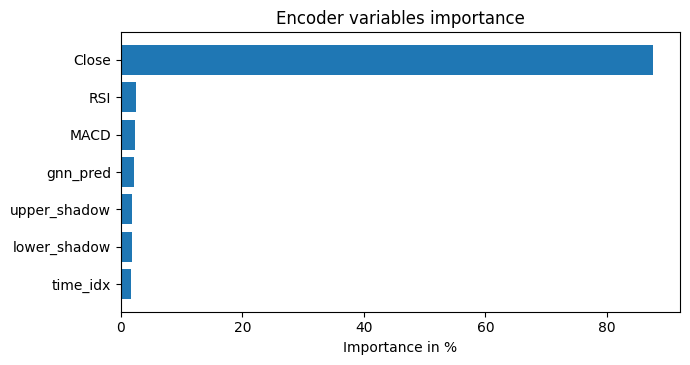

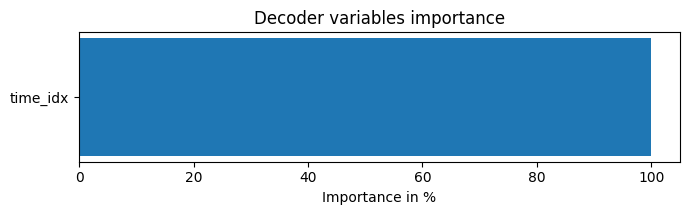

In [57]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2012-01-01') & (df['Date'] <= '2018-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2018-01-01"].copy()
test_df = df[df['Date'] >= "2017-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=32,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2018)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# TFTGNN Weekly:

2018:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 61.6 K | train
------------------------------------------------------------
61.6 K    Trainable params
0         Non-trainable params
61.6 K    Total params
0.246     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.



 AAPL Evaluation:
  RMSE: 1.3342
  MAE : 1.0461
  R²  : 0.9276
  MAPE: 2.35%


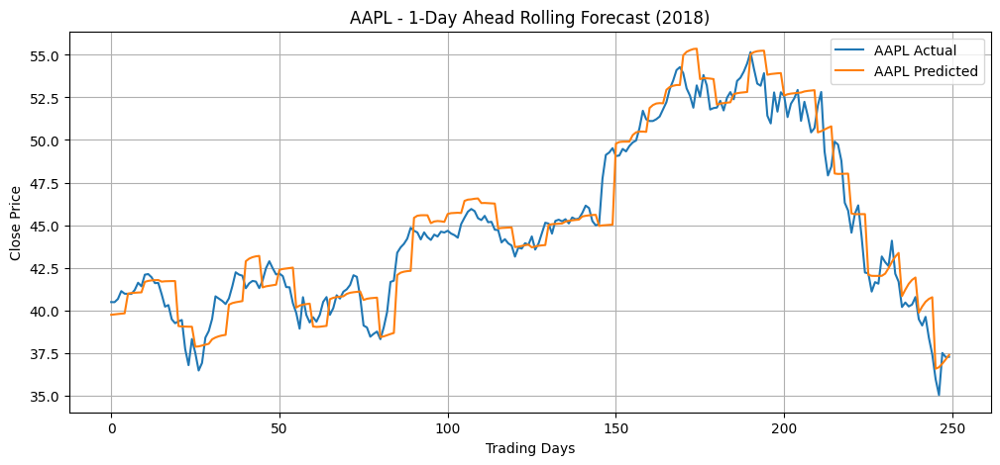


 JPM Evaluation:
  RMSE: 2.0782
  MAE : 1.5555
  R²  : 0.7002
  MAPE: 1.71%


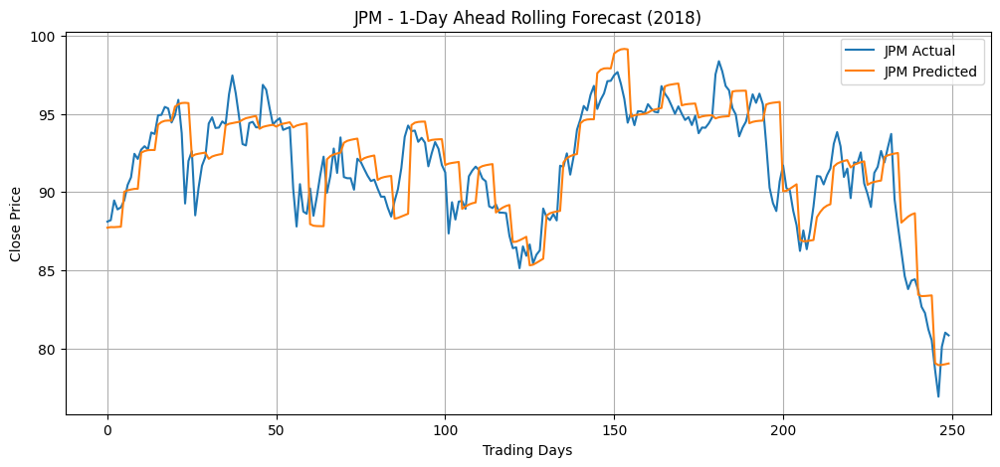


 NVDA Evaluation:
  RMSE: 0.3008
  MAE : 0.2124
  R²  : 0.8856
  MAPE: 3.92%


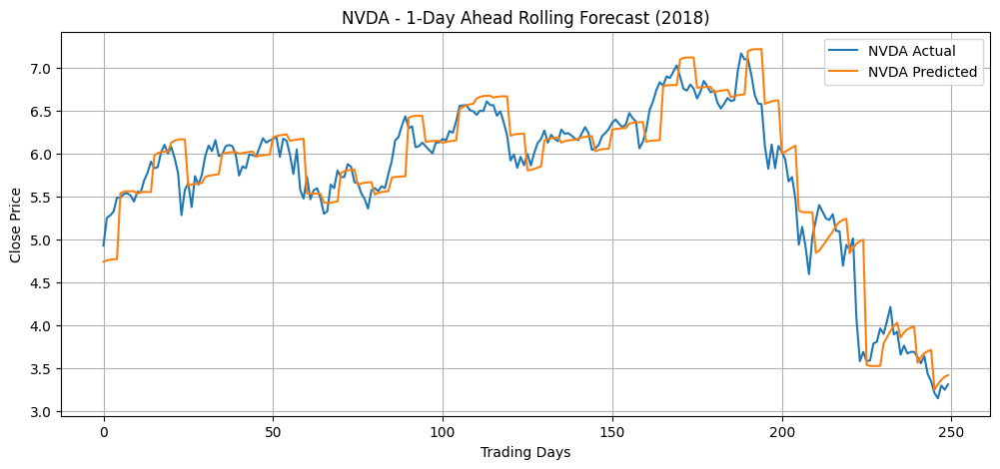


 SPY Evaluation:
  RMSE: 4.8563
  MAE : 3.3976
  R²  : 0.7110
  MAPE: 1.41%


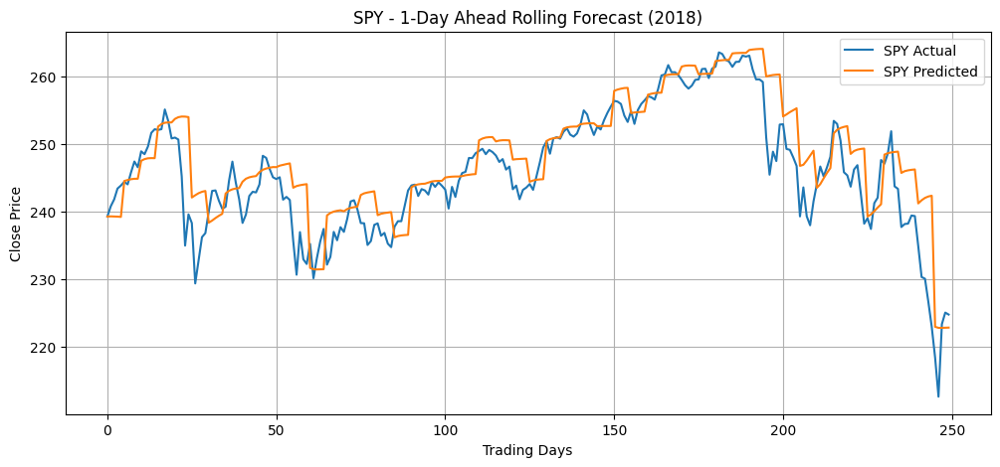

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

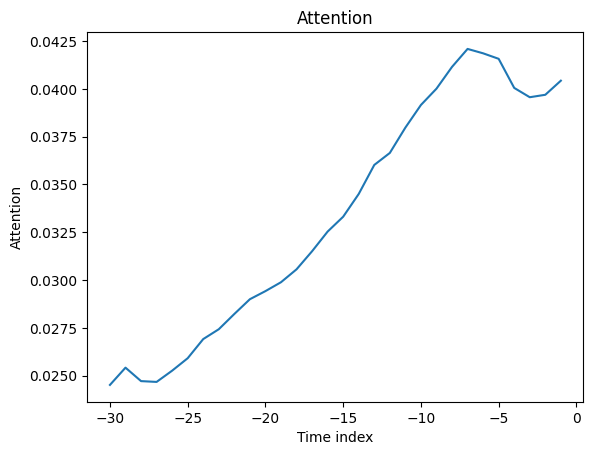

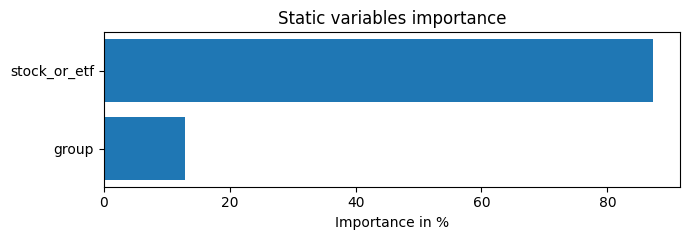

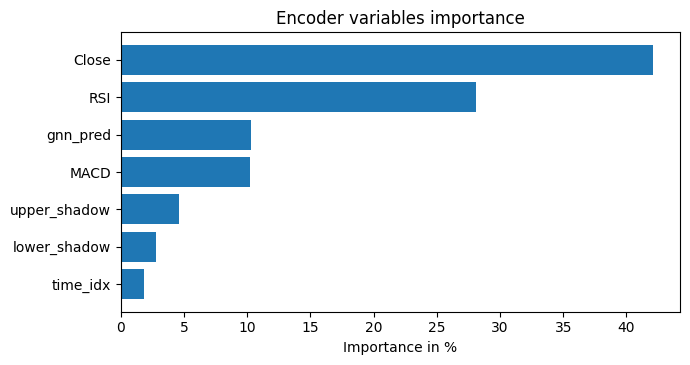

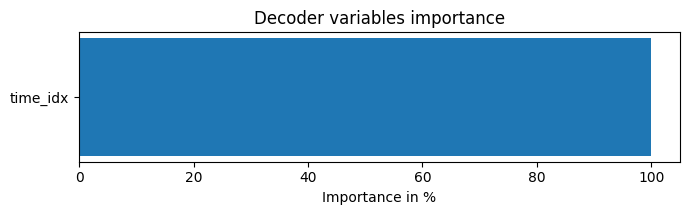

In [59]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2012-01-01') & (df['Date'] <= '2018-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2018-01-01"].copy()
test_df = df[df['Date'] >= "2017-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 5
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=32,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(0, steps, max_prediction_length):  # jump in 5-day chunks
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()
            actual = data_slice.iloc[-max_prediction_length:]["Close"].values

            preds_by_group[group].extend(prediction)
            actuals_by_group[group].extend(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2018)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# 2021:

In [60]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

In [61]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd.pt')

In [62]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd.pt')

In [63]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2015-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2021-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_spy_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0007 | Test Loss: 0.0350
 New best model saved (Train Loss: 0.0350)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0360
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0004 | Test Loss: 0.0364
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0286
 New best model saved (Train Loss: 0.0286)
Epoch 05 | Train Loss: 0.0003 | Test Loss: 0.0388
 No improvement for 1 epoch(s)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.0360
 No improvement for 2 epoch(s)
Epoch 07 | Train Loss: 0.0003 | Test Loss: 0.0395
 No improvement for 3 epoch(s)
Epoch 08 | Train Loss: 0.0004 | Test Loss: 0.0388
 No improvement for 4 epoch(s)
Epoch 09 | Train Loss: 0.0004 | Test Loss: 0.0366
 No improvement for 5 epoch(s)

 Early stopping at epoch 9

 Restored model with best Train Loss = 0.0286
AAPL — RMSE: 43.7646 | MAE: 39.8961 | MAPE: 113.24% | R²: -0.1846


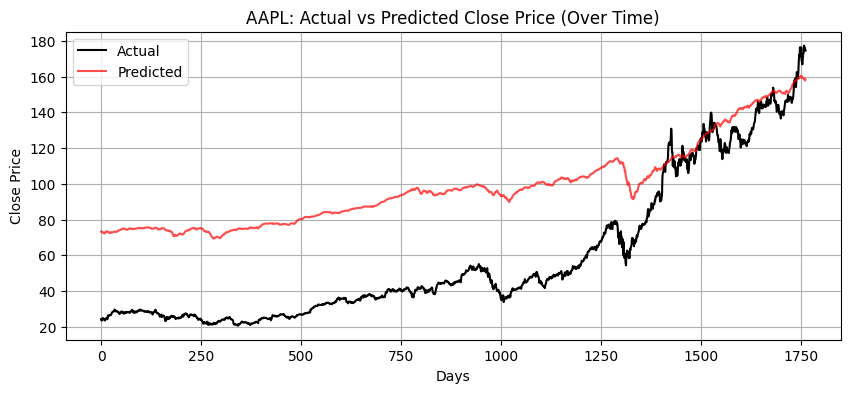

Extracted attention weights for AAPL for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


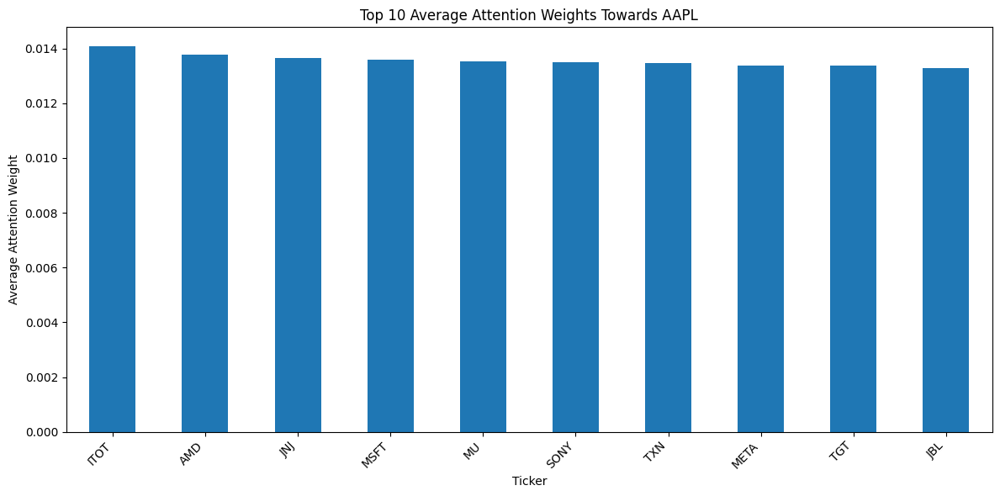

Top 10 tickers by average attention weight towards AAPL:
ITOT    0.014074
AMD     0.013782
JNJ     0.013645
MSFT    0.013597
MU      0.013544
SONY    0.013488
TXN     0.013483
META    0.013385
TGT     0.013367
JBL     0.013286
dtype: float32


In [64]:
# === Model Definition ===
import torc
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_aapl_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0011 | Test Loss: 0.0024
 New best model saved (Train Loss: 0.0024)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0027
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0003 | Test Loss: 0.0032
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0035
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0003 | Test Loss: 0.0041
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0003 | Test Loss: 0.0051
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0024
JPM — RMSE: 13.5412 | MAE: 11.2904 | MAPE: 16.89% | R²: 0.7989


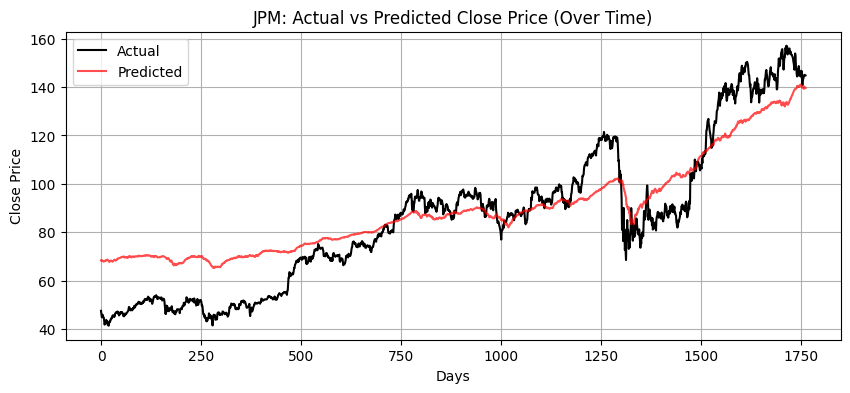

Extracted attention weights for JPM for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


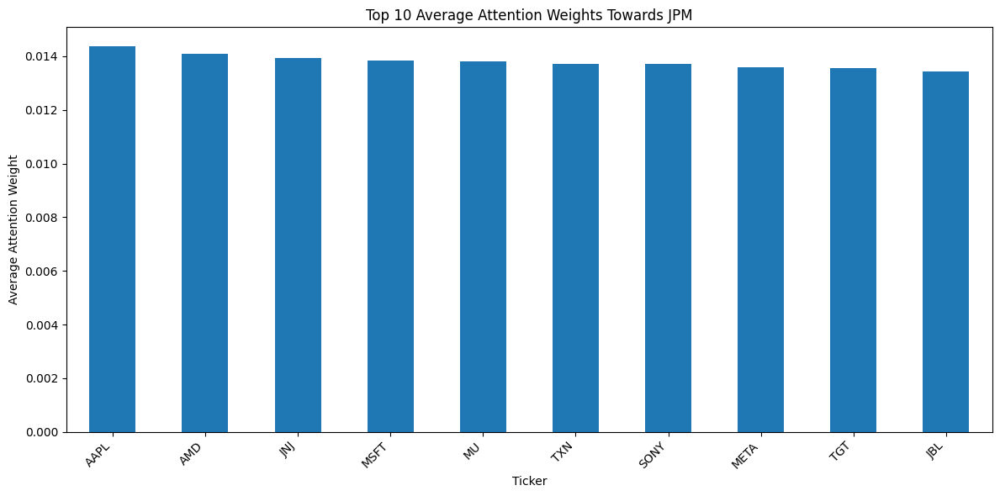

Top 10 tickers by average attention weight towards JPM:
AAPL    0.014363
AMD     0.014086
JNJ     0.013930
MSFT    0.013836
MU      0.013801
TXN     0.013714
SONY    0.013704
META    0.013574
TGT     0.013552
JBL     0.013430
dtype: float32


In [65]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_jpm_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0005 | Test Loss: 0.0024
 New best model saved (Train Loss: 0.0024)
Epoch 02 | Train Loss: 0.0000 | Test Loss: 0.0025
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0000 | Test Loss: 0.0020
 New best model saved (Train Loss: 0.0020)
Epoch 04 | Train Loss: 0.0000 | Test Loss: 0.0019
 New best model saved (Train Loss: 0.0019)
Epoch 05 | Train Loss: 0.0000 | Test Loss: 0.0023
 No improvement for 1 epoch(s)
Epoch 06 | Train Loss: 0.0000 | Test Loss: 0.0023
 No improvement for 2 epoch(s)
Epoch 07 | Train Loss: 0.0000 | Test Loss: 0.0019
 New best model saved (Train Loss: 0.0019)
Epoch 08 | Train Loss: 0.0000 | Test Loss: 0.0019
 New best model saved (Train Loss: 0.0019)
Epoch 09 | Train Loss: 0.0000 | Test Loss: 0.0020
 No improvement for 1 epoch(s)
Epoch 10 | Train Loss: 0.0000 | Test Loss: 0.0020
 No improvement for 2 epoch(s)
Epoch 11 | Train Loss: 0.0000 | Test Loss: 0.0019
 No improvement for 3 epoch(s)
Epoch 12 | Train Loss: 0.0000 | Test Loss: 0.0019

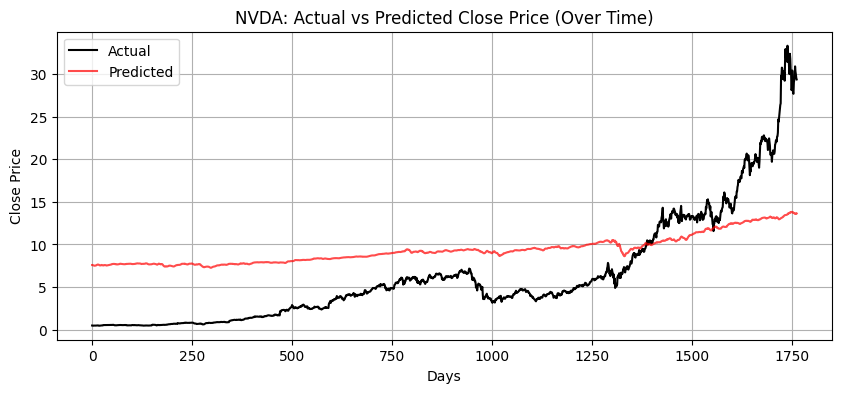

Extracted attention weights for NVDA for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


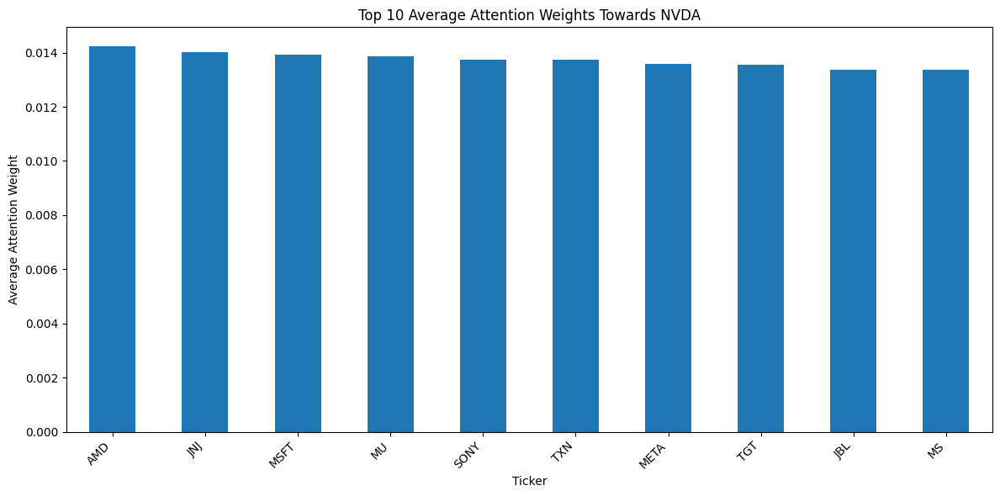

Top 10 tickers by average attention weight towards NVDA:
AMD     0.014228
JNJ     0.014017
MSFT    0.013937
MU      0.013849
SONY    0.013749
TXN     0.013726
META    0.013575
TGT     0.013567
JBL     0.013382
MS      0.013377
dtype: float32


In [66]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_nvda_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0014 | Test Loss: 0.0009
 New best model saved (Train Loss: 0.0009)
Epoch 02 | Train Loss: 0.0006 | Test Loss: 0.0011
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0004 | Test Loss: 0.0027
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0004 | Test Loss: 0.0027
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0004 | Test Loss: 0.0042
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0004 | Test Loss: 0.0051
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0009
SPY — RMSE: 17.1757 | MAE: 14.9499 | MAPE: 6.75% | R²: 0.9487


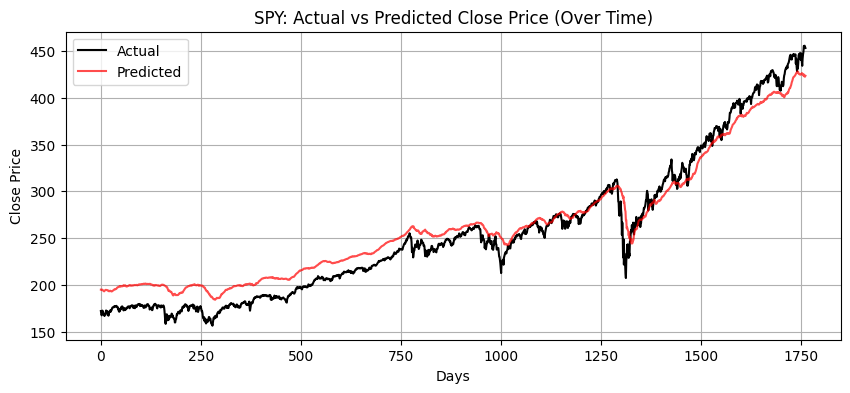

Extracted attention weights for SPY for 1763 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


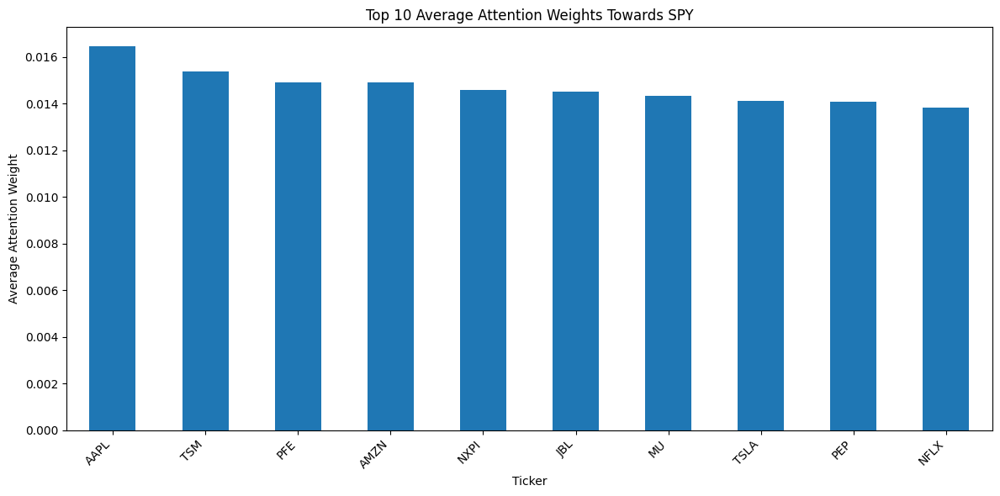

Top 10 tickers by average attention weight towards SPY:
AAPL    0.016451
TSM     0.015393
PFE     0.014900
AMZN    0.014895
NXPI    0.014579
JBL     0.014502
MU      0.014347
TSLA    0.014110
PEP     0.014079
NFLX    0.013822
dtype: float32


In [67]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_spy_updown = gnn_updown

# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [68]:
gnn_predictions = np.concatenate((gnn_aapl_updown, gnn_jpm_updown, gnn_nvda_updown, gnn_spy_updown))

TFT:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 61.6 K | train
------------------------------------------------------------
61.6 K    Trainable params
0         Non-trainable params
61.6 K    Total params
0.246     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.



 AAPL Evaluation:
  RMSE: 3.7422
  MAE : 2.9216
  R²  : 0.9268
  MAPE: 2.11%


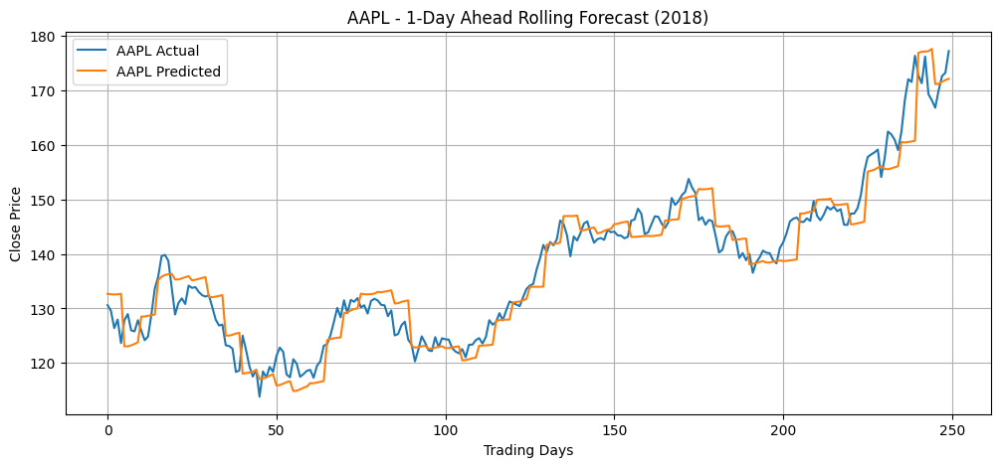


 JPM Evaluation:
  RMSE: 3.5201
  MAE : 2.7773
  R²  : 0.8677
  MAPE: 2.00%


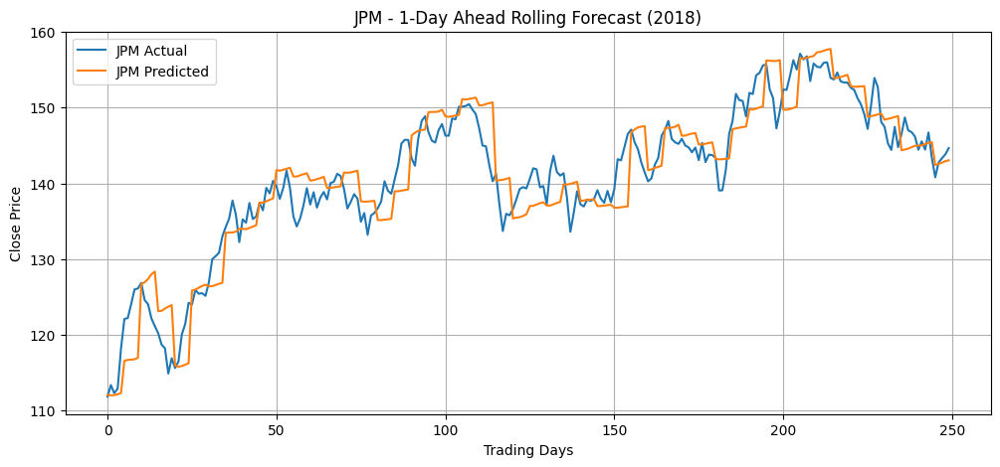


 NVDA Evaluation:
  RMSE: 0.9477
  MAE : 0.6922
  R²  : 0.9729
  MAPE: 3.61%


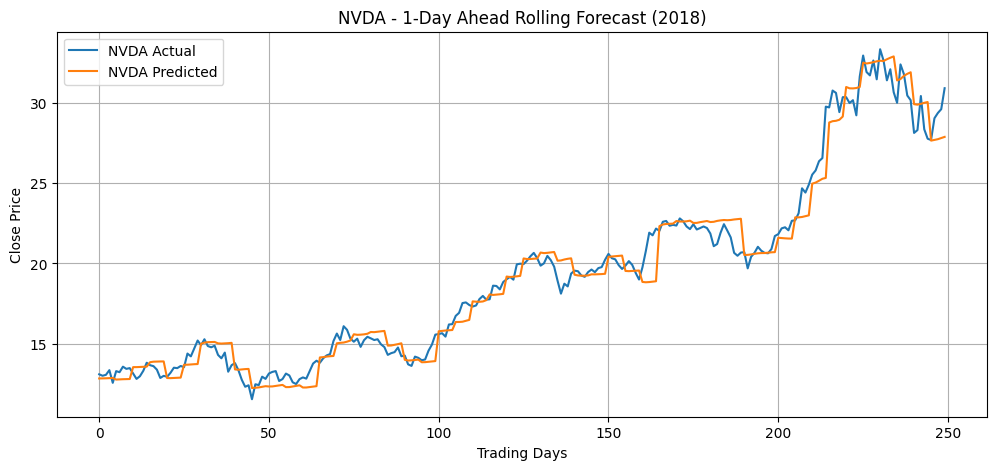


 SPY Evaluation:
  RMSE: 5.1008
  MAE : 3.6819
  R²  : 0.9675
  MAPE: 0.91%


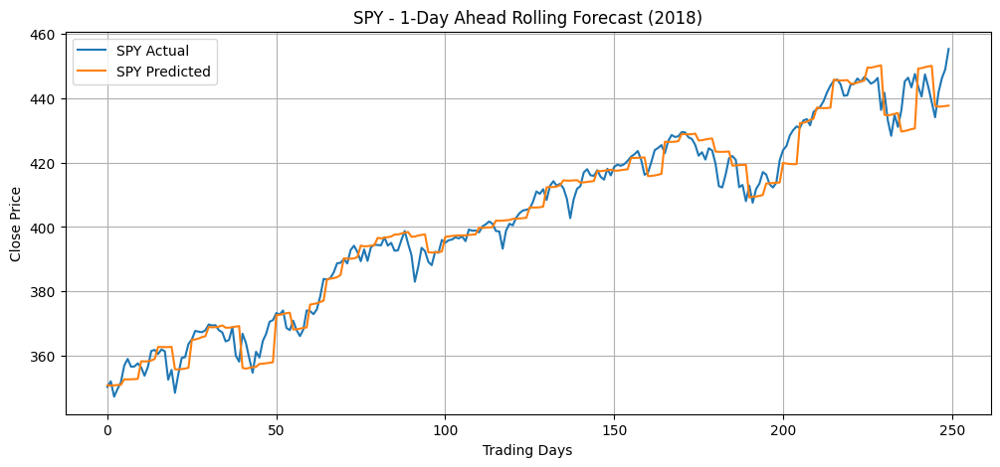

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

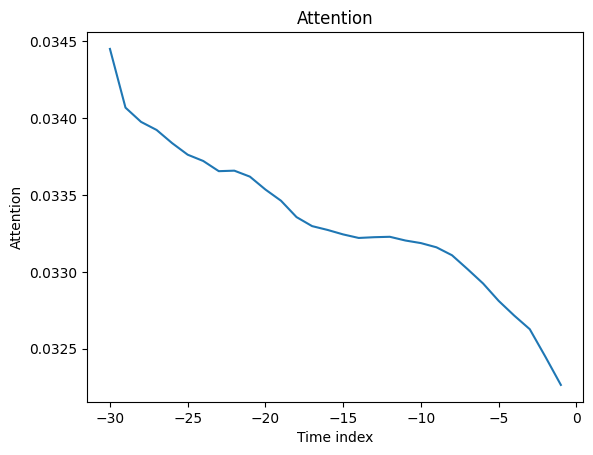

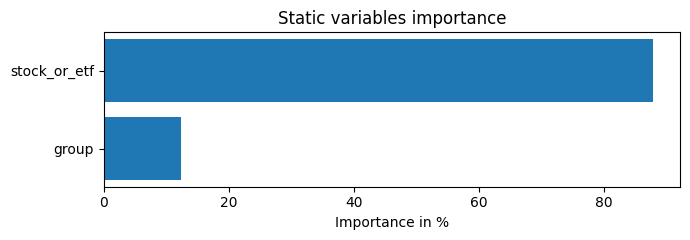

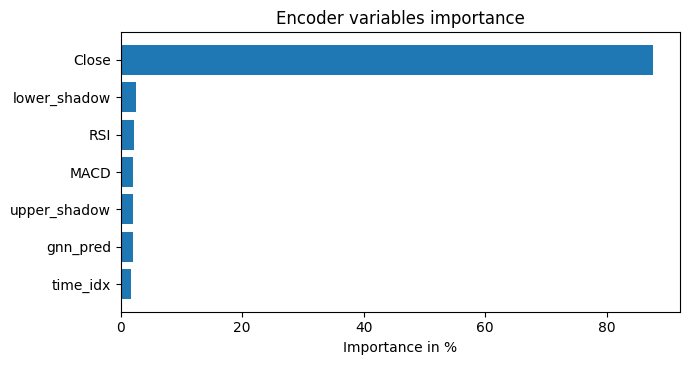

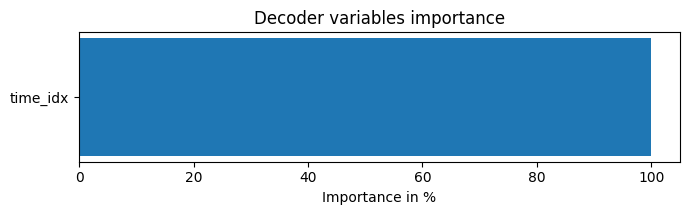

In [69]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2015-01-01') & (df['Date'] <= '2021-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2021-01-01"].copy()
test_df = df[df['Date'] >= "2020-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 5
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=32,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(0, steps, max_prediction_length):  # jump in 5-day chunks
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()
            actual = data_slice.iloc[-max_prediction_length:]["Close"].values

            preds_by_group[group].extend(prediction)
            actuals_by_group[group].extend(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2018)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

# 2024:

In [70]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'AAPL'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_aapl_21day_rsimacd.pt')

In [71]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'JPM'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_jpm_21day_rsimacd.pt')

In [72]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'NVDA'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(stock_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_nvda_21day_rsimacd.pt')

In [73]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import torch
from torch_geometric.data import Data
from functools import reduce
import joblib
from ta.momentum import RSIIndicator
from ta.trend import MACD

# Path to your stock and ETF folders
base_path = "/content/drive/MyDrive/CW_backup"
stock_path = os.path.join(base_path, "stocks")
etf_path = os.path.join(base_path, "etfs")

# Load and preprocess function (only scaled close price)
def load_and_scale_close(filepath):
    df = pd.read_csv(filepath, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df = df[['Date', 'Close']]
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()

    scaler_close = MinMaxScaler()
    scaler = MinMaxScaler()
    df['Close'] = scaler_close.fit_transform(df[['Close']])
    df['RSI'] = scaler.fit_transform(df[['RSI']])
    df['MACD'] = scaler.fit_transform(df[['MACD']])


    # Find the date 21 entries before '2018-01-01' based on available dates
    cutoff_date = pd.to_datetime('2018-01-01')
    dates_before_cutoff = df[df['Date'] < cutoff_date]['Date'].sort_values(ascending=False).tolist()
    earliest_date_needed = dates_before_cutoff[min(len(dates_before_cutoff) - 1, 20)] if dates_before_cutoff else cutoff_date


    df = df[(df['Date'] >= earliest_date_needed) & (df['Date'] <= '2024-12-31')]
    return df, scaler_close

selected_stocks = ['AAPL', 'JPM', 'NVDA', 'GOOGL', 'MSFT', 'AMZN', 'META', #7
                   'TSLA', 'SONY', 'JBL', 'NFLX',  'AMD', 'TSM', 'ORCL', 'AVGO',
                   'V', 'MS', 'COF', 'MET', 'AMAT', 'MCHP', 'ADI', #22
                   'BAC', 'BLK', "ASML", 'QCOM', 'CRM', 'ADBE', 'GS', 'WFC', #30
                   'SCHW', 'BK', 'AXP', 'TXN', 'MU', 'NXPI', 'KLAC', 'LRCX', #38
                   'UNH', 'JNJ', 'PFE', 'MRK', 'LLY', 'TMO', 'BMY', 'LMT', 'F',
                   'GM', 'HMC', 'TM', 'WMT', 'HD', 'COST', 'PG', 'KO', 'MCD',#56
                   'TGT', 'PEP', 'JNJ', 'NVO'] #60
# Related to the 4 i need + healthcare, automotive and consumer, for diversity.
selected_etfs = ['SPY', 'QQQ', 'DIA', 'IWM', 'XLK', 'XLF', 'XLE', 'XLI', 'XLV',
                 'XLY', 'XLP', 'VNQ', 'IYR', 'VGT', 'VTI', 'VUG', 'VTV', 'IWF',
                 'IWD', 'ITOT'] # 20.

target_stock = 'SPY'

panel = {}

# Load and scale AAPL separately to save its scaler
aapl_filepath = os.path.join(etf_path, f"{target_stock}.csv")
aapl_df, aapl_scaler = load_and_scale_close(aapl_filepath)
panel[target_stock] = aapl_df
joblib.dump(aapl_scaler, f'scaler_{target_stock.lower()}.save')

# Load and scale other tickers
tickers_to_process = [t for t in selected_stocks + selected_etfs if t != target_stock]

for ticker in tickers_to_process:
    folder = stock_path if ticker in selected_stocks else etf_path
    filepath = os.path.join(folder, f"{ticker}.csv")
    if os.path.exists(filepath):
        try:
            df, _ = load_and_scale_close(filepath) # Scale each individually
            panel[ticker] = df
        except Exception as e:
            print(f"Error loading {ticker}: {e}")
    else:
        print(f"File for {ticker} not found")


# Select only common dates
dataframes_to_merge = [df[['Date']] for df in panel.values()]
if not dataframes_to_merge:
    print("No dataframes loaded to find common dates.")
else:
    common_dates = reduce(lambda x, y: pd.merge(x, y, on='Date', how='inner'), dataframes_to_merge)
    common_dates = pd.to_datetime(common_dates['Date'].unique())
    common_dates = sorted(common_dates.tolist()) # Corrected sorting


    # Filter dataframes by common dates
    for ticker in panel:
        panel[ticker] = panel[ticker][panel[ticker]['Date'].isin(common_dates)].reset_index(drop=True)

    # Create graph list
    tickers_in_panel = list(panel.keys())
    target_indices = [tickers_in_panel.index(target_stock)]

    def fully_connected_edges(num_nodes):
        row = torch.arange(num_nodes).repeat_interleave(num_nodes)
        col = torch.arange(num_nodes).repeat(num_nodes)
        return torch.stack([row, col], dim=0)

    window_size = 21  # today + previous 20 days

    graph_list = []
    num_days = len(common_dates) - 1  # Leave 1 for next-day label

    for day in range(window_size - 1, num_days):
        x = []
        y = []

        for ticker in tickers_to_process:
            window_rows = panel[ticker].iloc[day - (window_size - 1): day + 1]
            features_window = window_rows[['Close']].values.flatten()
            x.append(features_window)

        # --- CHANGE: categorical label (up or down) ---
        y.append(panel[target_stock].iloc[day + 1]['Close'])

        x_tensor = torch.tensor(x, dtype=torch.float)
        y_tensor = torch.tensor(y, dtype=torch.float)  # categorical label

        # Replace NaN/Inf with zeros
        x_tensor = torch.nan_to_num(x_tensor, nan=0.0, posinf=0.0, neginf=0.0)
        y_tensor = torch.nan_to_num(y_tensor, nan=0, posinf=0, neginf=0)


        edge_index = fully_connected_edges(len(tickers_to_process))
        target_tensor = torch.tensor(target_indices, dtype=torch.long)

        data = Data(x=x_tensor, edge_index=edge_index, y=y_tensor, target_node_ids=target_tensor)
        graph_list.append(data)


    torch.save(graph_list, 'graph_list_spy_21day_rsimacd.pt')

Epoch 01 | Train Loss: 0.0029 | Test Loss: 0.0202
 New best model saved (Train Loss: 0.0202)
Epoch 02 | Train Loss: 0.0018 | Test Loss: 0.0199
 New best model saved (Train Loss: 0.0199)
Epoch 03 | Train Loss: 0.0015 | Test Loss: 0.0225
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0014 | Test Loss: 0.0244
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0013 | Test Loss: 0.0208
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0013 | Test Loss: 0.0262
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0014 | Test Loss: 0.0257
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0199
AAPL — RMSE: 36.4511 | MAE: 30.8265 | MAPE: 46.49% | R²: 0.6222


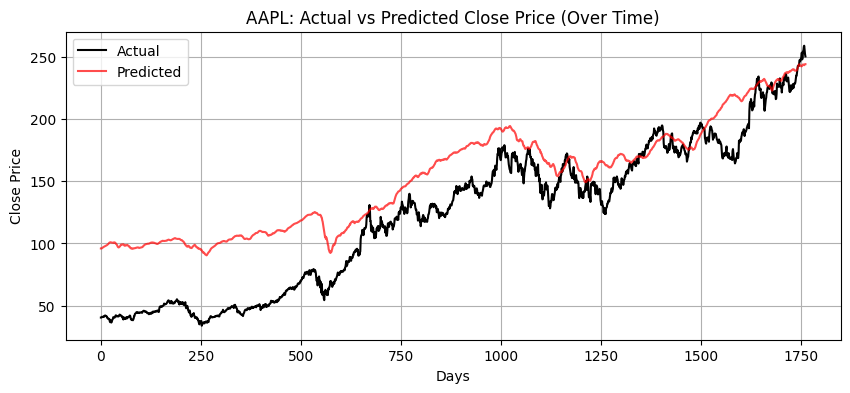

Extracted attention weights for AAPL for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


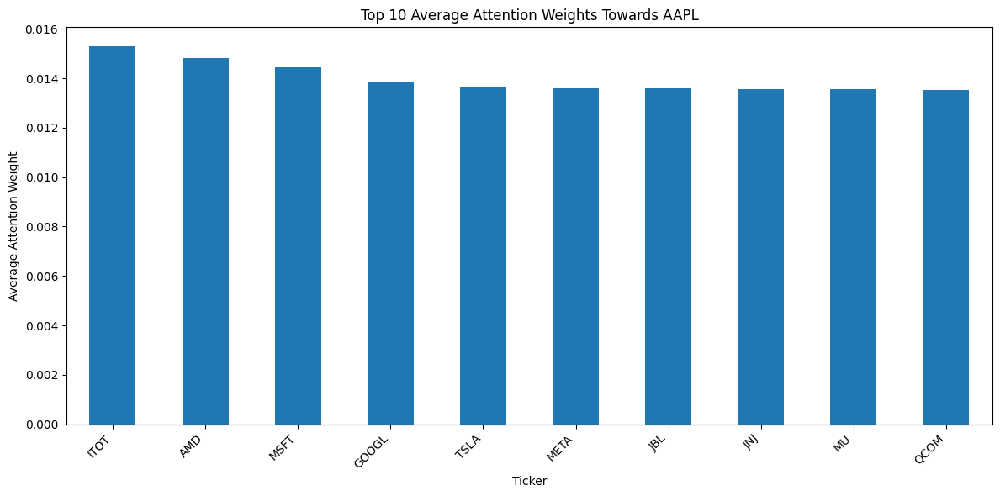

Top 10 tickers by average attention weight towards AAPL:
ITOT     0.015299
AMD      0.014806
MSFT     0.014445
GOOGL    0.013815
TSLA     0.013618
META     0.013610
JBL      0.013609
JNJ      0.013576
MU       0.013542
QCOM     0.013539
dtype: float32


In [74]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'AAPL'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_aapl_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'AAPL'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0029 | Test Loss: 0.0034
 New best model saved (Train Loss: 0.0034)
Epoch 02 | Train Loss: 0.0012 | Test Loss: 0.0031
 New best model saved (Train Loss: 0.0031)
Epoch 03 | Train Loss: 0.0011 | Test Loss: 0.0036
 No improvement for 1 epoch(s)
Epoch 04 | Train Loss: 0.0010 | Test Loss: 0.0053
 No improvement for 2 epoch(s)
Epoch 05 | Train Loss: 0.0009 | Test Loss: 0.0033
 No improvement for 3 epoch(s)
Epoch 06 | Train Loss: 0.0008 | Test Loss: 0.0056
 No improvement for 4 epoch(s)
Epoch 07 | Train Loss: 0.0008 | Test Loss: 0.0066
 No improvement for 5 epoch(s)

 Early stopping at epoch 7

 Restored model with best Train Loss = 0.0031
JPM — RMSE: 15.5822 | MAE: 12.1552 | MAPE: 10.12% | R²: 0.8382


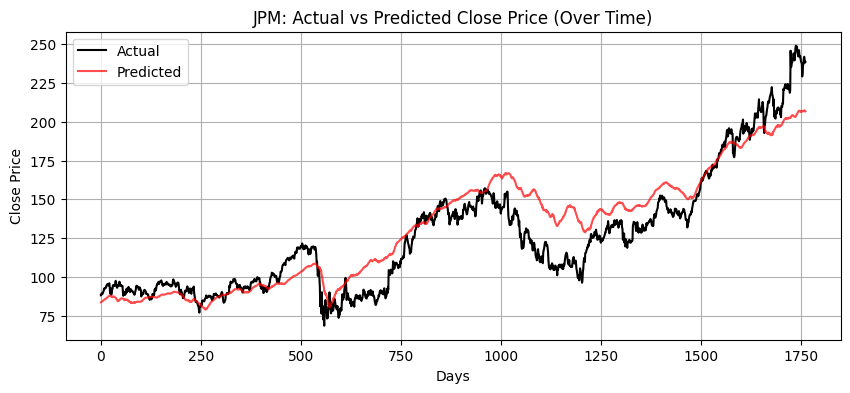

Extracted attention weights for JPM for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


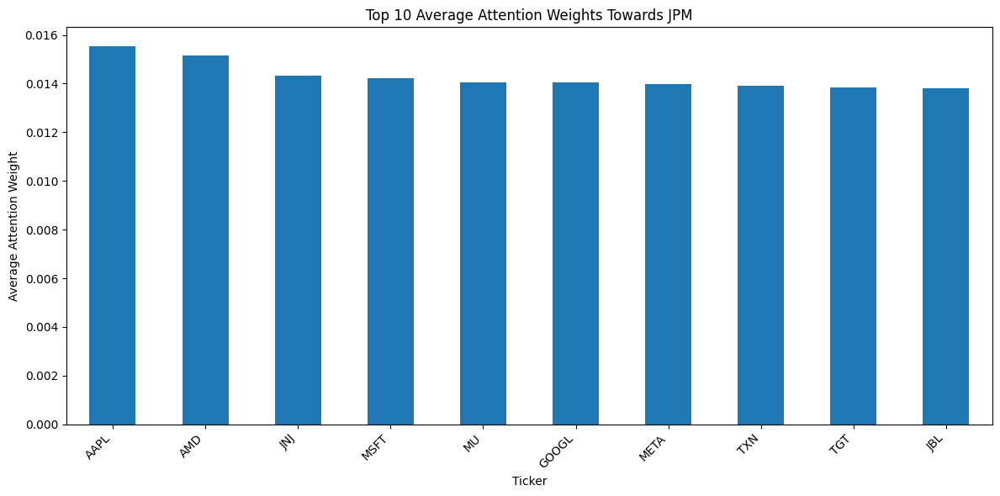

Top 10 tickers by average attention weight towards JPM:
AAPL     0.015542
AMD      0.015169
JNJ      0.014338
MSFT     0.014226
MU       0.014041
GOOGL    0.014040
META     0.013964
TXN      0.013915
TGT      0.013834
JBL      0.013803
dtype: float32


In [75]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'JPM'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_jpm_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'JPM'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0021 | Test Loss: 0.0375
 New best model saved (Train Loss: 0.0375)
Epoch 02 | Train Loss: 0.0004 | Test Loss: 0.0390
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0003 | Test Loss: 0.0391
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0003 | Test Loss: 0.0407
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0003 | Test Loss: 0.0413
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0003 | Test Loss: 0.0441
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0375
NVDA — RMSE: 28.9148 | MAE: 24.9066 | MAPE: 215.33% | R²: 0.3423


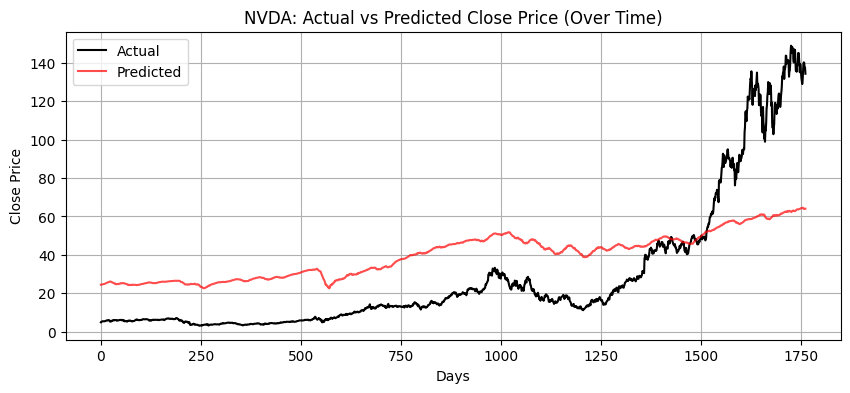

Extracted attention weights for NVDA for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


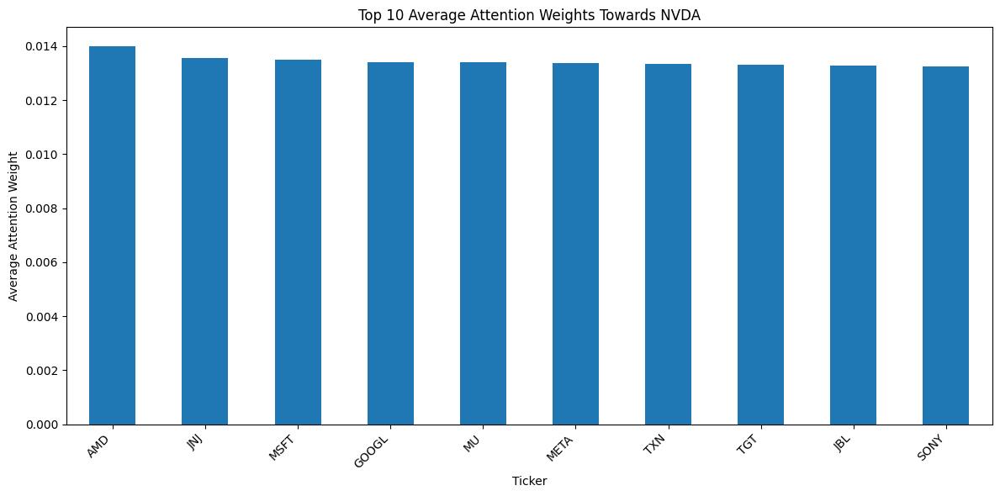

Top 10 tickers by average attention weight towards NVDA:
AMD      0.013997
JNJ      0.013557
MSFT     0.013504
GOOGL    0.013416
MU       0.013414
META     0.013371
TXN      0.013346
TGT      0.013295
JBL      0.013291
SONY     0.013246
dtype: float32


In [76]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'NVDA'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_nvda_updown = gnn_updown



# Extract attention weights for the target node (AAPL)
target_stock = 'NVDA'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

Epoch 01 | Train Loss: 0.0033 | Test Loss: 0.0020
 New best model saved (Train Loss: 0.0020)
Epoch 02 | Train Loss: 0.0012 | Test Loss: 0.0025
 No improvement for 1 epoch(s)
Epoch 03 | Train Loss: 0.0010 | Test Loss: 0.0030
 No improvement for 2 epoch(s)
Epoch 04 | Train Loss: 0.0010 | Test Loss: 0.0064
 No improvement for 3 epoch(s)
Epoch 05 | Train Loss: 0.0009 | Test Loss: 0.0037
 No improvement for 4 epoch(s)
Epoch 06 | Train Loss: 0.0009 | Test Loss: 0.0053
 No improvement for 5 epoch(s)

 Early stopping at epoch 6

 Restored model with best Train Loss = 0.0020
SPY — RMSE: 26.1911 | MAE: 23.1247 | MAPE: 7.24% | R²: 0.9286


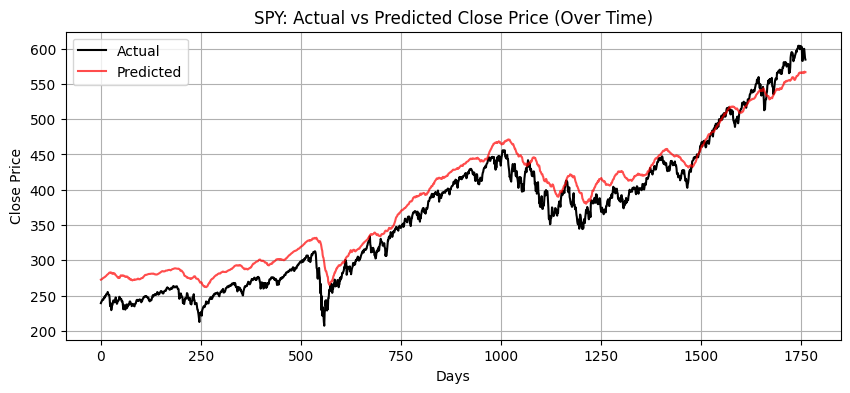

Extracted attention weights for SPY for 1761 time steps.
Shape of attention weights for one time step: torch.Size([79, 4])


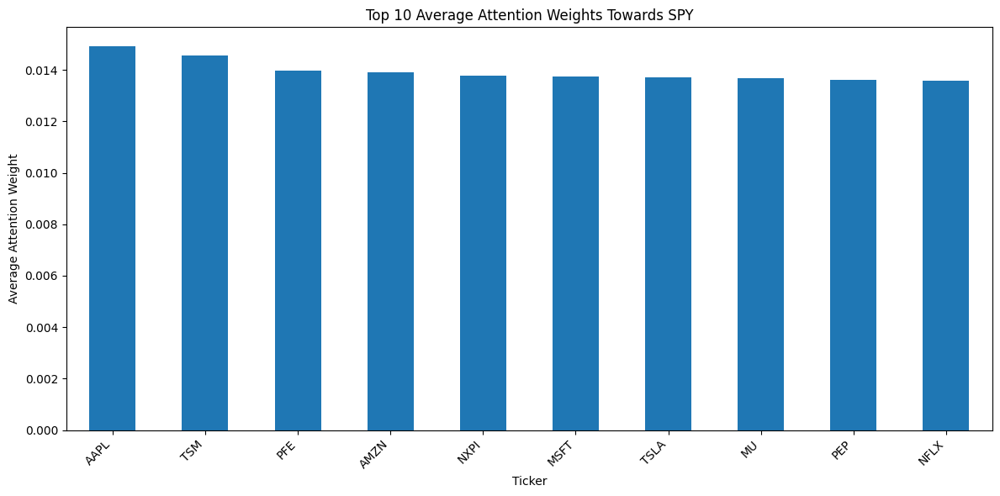

Top 10 tickers by average attention weight towards SPY:
AAPL    0.014912
TSM     0.014560
PFE     0.013962
AMZN    0.013899
NXPI    0.013759
MSFT    0.013756
TSLA    0.013700
MU      0.013667
PEP     0.013599
NFLX    0.013589
dtype: float32


In [77]:
# === Model Definition ===
import torch
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# === Load Graph Data ===
target_stock = 'SPY'
graph_list = torch.load(f"graph_list_{target_stock.lower()}_21day_rsimacd.pt", weights_only=False)

test_days = 252
train_graphs = graph_list[:-test_days]
test_graphs = graph_list

batch_size = 1
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_graphs, batch_size=batch_size, shuffle=False)

# === Model Definition ===
class GATPredictor(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=4, dropout_prob=0.2):
        super(GATPredictor, self).__init__()
        self.gat1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.fc = nn.Linear(hidden_channels * heads, out_channels)  # Predict price for each node
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x, (edge_index_attn, attn_weights_tensor) = self.gat1(
            x, edge_index, return_attention_weights=True
        )
        x = F.elu(x)
        x = self.dropout(x)  # Apply dropout after activation
        output = self.fc(x)  # shape: [num_nodes, 1]
        return output, (edge_index_attn, attn_weights_tensor)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = GATPredictor(in_channels=21, hidden_channels=32, out_channels=1).to(device) # Changed in_channels to 1
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
loss_fn = nn.MSELoss()

# === Training / Testing ===
def train():
    model.train()
    total_loss = 0
    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        out, _ = model(data)  # predictions for all nodes, shape [num_nodes, 1]
        out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
        # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
        if out_target_nodes.ndim == 0:
            out_target_nodes = out_target_nodes.unsqueeze(0)
        if data.y.ndim == 0:
            data.y = data.y.unsqueeze(0)
        loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(train_loader)

def test(loader):
    model.eval()
    total_loss = 0
    all_attn_weights = []
    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            out, (edge_index_attn, attn_weights_tensor) = model(data)  # predictions for all nodes, shape [num_nodes, 1]
            out_target_nodes = out[data.target_node_ids].squeeze() # select and squeeze predictions for target nodes, shape [num_targets]
            # Ensure shapes are compatible for MSELoss, unsqueeze if scalar
            if out_target_nodes.ndim == 0:
                out_target_nodes = out_target_nodes.unsqueeze(0)
            if data.y.ndim == 0:
                data.y = data.y.unsqueeze(0)
            loss = loss_fn(out_target_nodes, data.y.to(device)) # compare with actual targets, shape [num_targets]
            total_loss += loss.item()
            all_attn_weights.append((edge_index_attn.cpu(), attn_weights_tensor.cpu())) # Store edge_index and attention_weights_tensor

    return total_loss / len(loader), all_attn_weights

import copy

patience = 5   # how many epochs to wait for improvement
best_loss = float("inf")
epochs_no_improve = 0
best_model_state = None
n_epochs = 30  # or however many max you want

for epoch in range(n_epochs):
    train_loss = train()
    test_loss, test_attn_weights = test(test_loader)

    print(f"Epoch {epoch+1:02d} | Train Loss: {train_loss:.4f} | Test Loss: {test_loss:.4f}")

    # --- Early stopping check (based on train loss) ---
    if test_loss < best_loss - 1e-6:   # small delta to avoid floating point noise
        best_loss = test_loss
        best_model_state = copy.deepcopy(model.state_dict())
        epochs_no_improve = 0
        print(f" New best model saved (Train Loss: {best_loss:.4f})")
    else:
        epochs_no_improve += 1
        print(f" No improvement for {epochs_no_improve} epoch(s)")

    if epochs_no_improve >= patience:
        print(f"\n Early stopping at epoch {epoch+1}")
        break

# --- Restore best model before evaluation ---
if best_model_state is not None:
    model.load_state_dict(best_model_state)
    print(f"\n Restored model with best Train Loss = {best_loss:.4f}")

# === Predictions ===
model.eval()
predictions = []
actuals = []

with torch.no_grad():
    for data in test_loader:
        data = data.to(device)
        out, _ = model(data)  # predictions for all nodes
        out_target = out[data.target_node_ids].squeeze().cpu().numpy()
        # Ensure out_target is treated as an iterable even if it's a scalar
        if out_target.ndim == 0:
            out_target = out_target.reshape(1)
        predictions.extend(out_target)
        actuals.extend(data.y.cpu().numpy())

# === Inverse scaling and Metrics ===
aapl_scaler = joblib.load(f'scaler_{target_stock.lower()}.save')

predictions = aapl_scaler.inverse_transform(np.array(predictions).reshape(-1, 1)).flatten()
actuals = aapl_scaler.inverse_transform(np.array(actuals).reshape(-1, 1)).flatten()

rmse = np.sqrt(mean_squared_error(actuals, predictions))
mae = mean_absolute_error(actuals, predictions)
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100
r2 = r2_score(actuals, predictions)

print(f"{target_stock} — RMSE: {rmse:.4f} | MAE: {mae:.4f} | MAPE: {mape:.2f}% | R²: {r2:.4f}")

# === Plotting ===
plt.figure(figsize=(10, 4))
plt.plot(actuals, label="Actual", color='black')
plt.plot(predictions, label="Predicted", color='red', alpha=0.7)
plt.title(f"{target_stock}: Actual vs Predicted Close Price (Over Time)")
plt.xlabel("Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.show()

gnn_predictions = predictions

# assume gnn_predictions is a numpy array (len = N)
gnn_predictions = np.array(gnn_predictions)

# Compare today vs yesterday
gnn_updown = np.zeros_like(gnn_predictions, dtype=int)

for i in range(1, len(gnn_predictions)):
    if gnn_predictions[i] > gnn_predictions[i-1]:
        gnn_updown[i] = 1  # up
    else:
        gnn_updown[i] = 0  # down

# Force the first value to be "up" as you requested
gnn_updown[0] = 1
gnn_spy_updown = gnn_updown

# Extract attention weights for the target node (AAPL)
target_stock = 'SPY'
# Assuming 'tickers' list and 'panel' dictionary are available from previous cells
tickers_in_panel = list(panel.keys())
aapl_node_index = tickers_in_panel.index(target_stock)

aapl_attention_weights = []

for edge_index, attn_weights in test_attn_weights:
    # Find edges where the target node is AAPL
    # In a fully connected graph, the target node is in the second row of edge_index
    # and its index is aapl_node_index
    aapl_edges_mask = edge_index[1] == aapl_node_index

    # Get the attention weights for these edges
    weights_to_aapl = attn_weights[aapl_edges_mask]
    aapl_attention_weights.append(weights_to_aapl)

# aapl_attention_weights is a list of tensors, where each tensor contains the attention
# weights from all other nodes towards AAPL for a given time step in the test set.

print(f"Extracted attention weights for {target_stock} for {len(aapl_attention_weights)} time steps.")
# You can inspect the shape of the weights for a single time step
if aapl_attention_weights:
    print(f"Shape of attention weights for one time step: {aapl_attention_weights[0].shape}")


# Calculate average attention weights across the test set
# Assuming aapl_attention_weights is a list of tensors where each tensor is [num_nodes, heads]
# We want to average across the time steps (the list) and potentially across heads

if aapl_attention_weights:
    # Concatenate all attention weight tensors from the list
    all_weights_tensor = torch.cat(aapl_attention_weights, dim=0) # Shape: [num_days * num_nodes, heads]

    # Reshape to [num_days, num_nodes, heads] and average over days
    num_days_test = len(aapl_attention_weights)
    num_nodes = all_weights_tensor.shape[0] // num_days_test
    num_heads = all_weights_tensor.shape[1]

    average_weights_per_node_head = all_weights_tensor.reshape(num_days_test, num_nodes, num_heads).mean(dim=0) # Shape: [num_nodes, heads]

    # Average across heads to get a single weight per node
    average_weights_per_node = average_weights_per_node_head.mean(dim=1) # Shape: [num_nodes]

    # Get the tickers corresponding to the nodes
    # Use tickers_to_process as the index, since the graph was built using these tickers

    # Create a pandas Series for easier sorting and visualization
    average_attention_series = pd.Series(average_weights_per_node.numpy(), index=tickers_in_panel) # Use corrected index

    # Sort the series by attention weight
    sorted_attention = average_attention_series.sort_values(ascending=False)

    # Plot the top N attention weights
    top_n = 10 # Adjusted top_n
    plt.figure(figsize=(12, 6))
    sorted_attention.head(top_n).plot(kind='bar')
    plt.title(f"Top {top_n} Average Attention Weights Towards {target_stock}")
    plt.xlabel("Ticker")
    plt.ylabel("Average Attention Weight")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print(f"Top {top_n} tickers by average attention weight towards {target_stock}:")
    print(sorted_attention.head(top_n))

else:
    print("No attention weights were extracted.")

In [78]:
gnn_predictions = np.concatenate((gnn_aapl_updown, gnn_jpm_updown, gnn_nvda_updown, gnn_spy_updown))

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 140 K  | train
------------------------------------------------------------
140 K     Trainable params
0         Non-trainable params
140 K     Total params
0.561     Total estimated model params size (MB)
272       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 AAPL Evaluation:
  RMSE: 5.7001
  MAE : 4.3468
  R²  : 0.9497
  MAPE: 2.14%


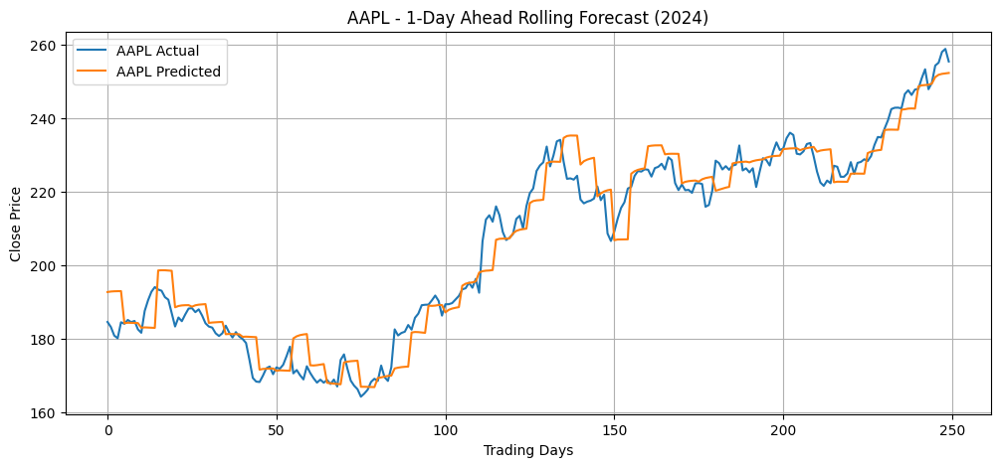


 JPM Evaluation:
  RMSE: 5.4718
  MAE : 3.9960
  R²  : 0.9385
  MAPE: 1.97%


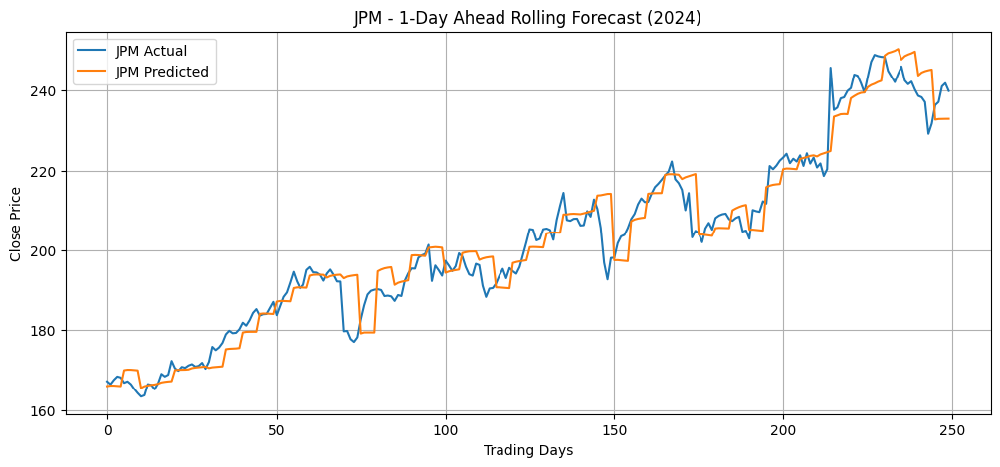


 NVDA Evaluation:
  RMSE: 6.4068
  MAE : 4.9731
  R²  : 0.9432
  MAPE: 4.77%


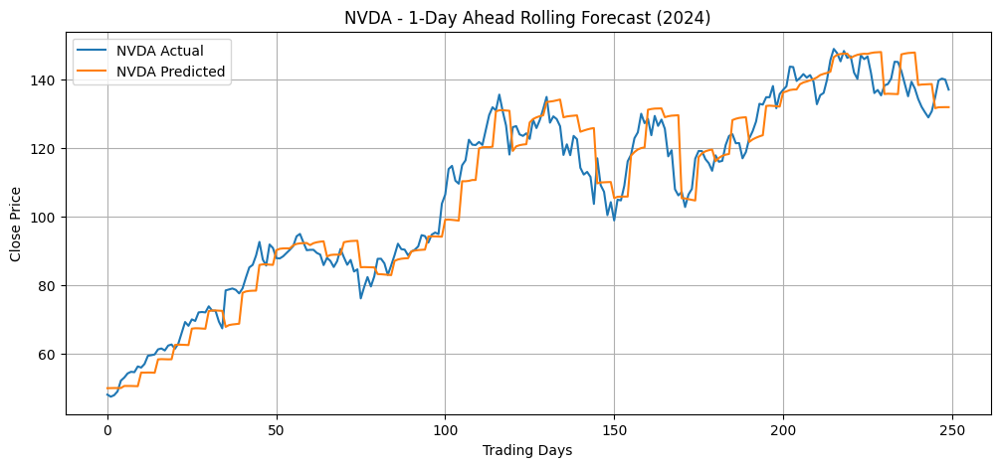


 SPY Evaluation:
  RMSE: 7.2007
  MAE : 5.5106
  R²  : 0.9642
  MAPE: 1.03%


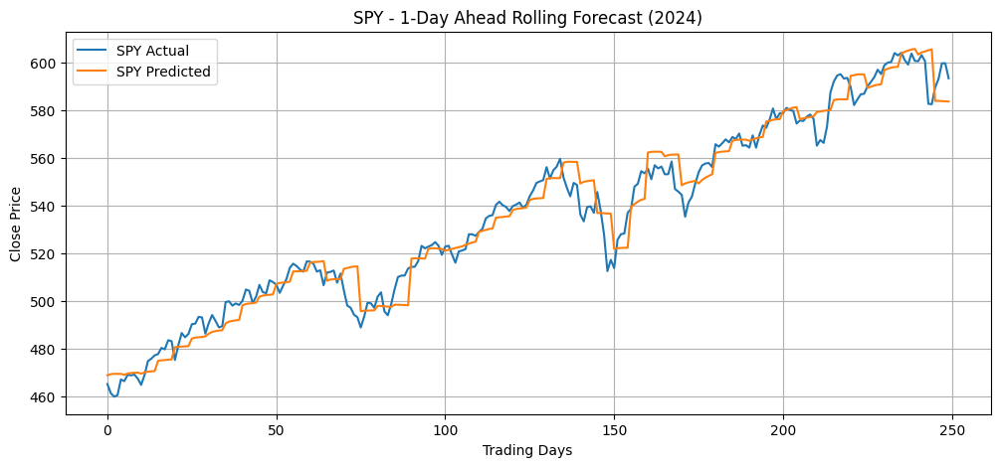

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x250 with 1 Axes>,
 'encoder_variables': <Figure size 700x375 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

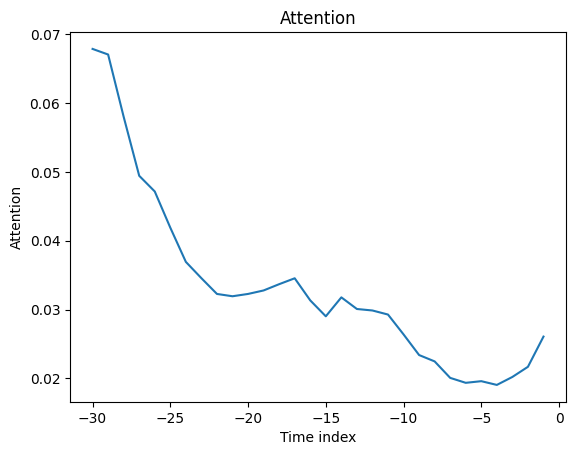

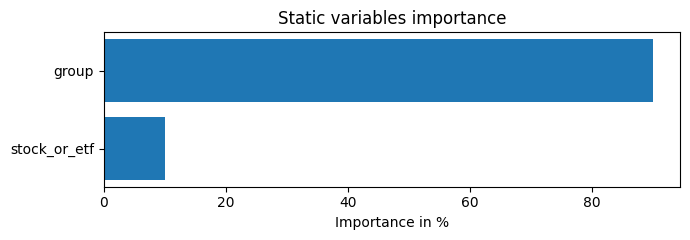

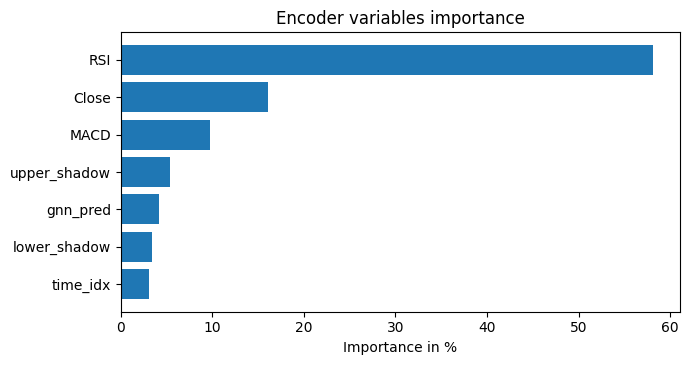

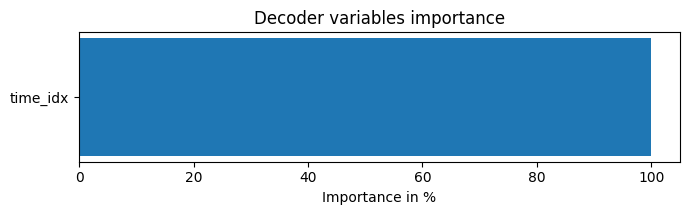

In [80]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name, stock_or_etf):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['stock_or_etf'] = stock_or_etf
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL", "stock")
jpm  = load_stock("JPM.csv", "JPM", "stock")
nvda = load_stock("NVDA.csv", "NVDA", "stock")
spy  = load_stock("SPY.csv",  "SPY", "etf")

df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()
df['gnn_pred'] = gnn_predictions

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 5
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow', 'gnn_pred'],
    static_categoricals=["group", "stock_or_etf"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=32, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=32, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.003,
    hidden_size=50,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=8, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(0, steps, max_prediction_length):  # jump in 5-day chunks
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()
            actual = data_slice.iloc[-max_prediction_length:]["Close"].values

            preds_by_group[group].extend(prediction)
            actuals_by_group[group].extend(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)